First, we're going to develop a model that simply generates a copy of the input.

In [1]:
import os

from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.models import Sequential
from keras.layers import Dense, Dropout, BatchNormalization, Conv2DTranspose, Conv2D, UpSampling2D, Reshape, Flatten, MaxPooling2D, LeakyReLU
from keras.optimizers import RMSprop, SGD
from IPython.display import Image, display
from itertools import repeat
import PIL
from datetime import datetime

import numpy as np

partial_batch_size = 16
scale_up = 4

datagen = ImageDataGenerator(
        rotation_range=10,
        width_shift_range=0.1,
        height_shift_range=0.1,
        rescale=1./255,
        shear_range=0.005,
        zoom_range=0.2,
        horizontal_flip=False,
        fill_mode='nearest')

fake_data_gen = datagen.flow_from_directory(os.getcwd()+'/training_generated/', target_size=(64,64),batch_size=partial_batch_size)

real_data_gen = datagen.flow_from_directory(os.getcwd()+'/training_eye/', target_size=(64,64),batch_size=partial_batch_size)

def output_to_image(array):
    array = array*255
    i = array_to_img(array).resize((64*scale_up,64*scale_up), PIL.Image.ANTIALIAS)
    return i

Using TensorFlow backend.


Found 118 images belonging to 1 classes.
Found 729 images belonging to 3 classes.


In [2]:
def get_generator():
    m = Sequential()
    m.add(Conv2D(32,3, input_shape=(64,64,3,), activation = LeakyReLU(), padding='same'))
    m.add(MaxPooling2D(2,2))
    m.add(Dropout(0.5))
    m.add(Conv2D(32,3, activation = LeakyReLU(), padding='same'))
    m.add(MaxPooling2D(2,2))
    m.add(Dropout(0.5))
    m.add(Conv2D(64,3, activation = LeakyReLU(), padding='same'))
    m.add(MaxPooling2D(2,2))
    m.add(Dropout(0.5))
    m.add(Flatten())
    m.add(Dense((1024), input_shape=(100,), activation = 'relu'))
    m.add(Reshape((4,4,int(1024/4/4))))
    m.add(UpSampling2D())
    m.add(Conv2DTranspose(512,8, activation = 'relu', padding='same'))
    m.add(BatchNormalization())
    m.add(UpSampling2D())
    m.add(Conv2DTranspose(256,5, activation = 'relu', padding='same'))
    m.add(BatchNormalization())
    m.add(UpSampling2D())
    m.add(Conv2DTranspose(128,5, activation = 'relu', padding='same'))
    m.add(BatchNormalization())
    m.add(UpSampling2D())
    m.add(Conv2DTranspose(64,5, activation = 'relu', padding='same'))
    m.add(BatchNormalization())
    m.add(Conv2DTranspose(3,5, activation = 'sigmoid', padding='same'))
    return m

get_generator().summary()


def l1_norm(y_true, y_pred):
    
    from keras import backend as K
    return K.mean(K.abs(y_pred - y_true))

def compile_generator(generator):
    generator.compile(loss=l1_norm, optimizer=RMSprop(lr=0.0001))
    return generator


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/activations.py:103: UserWarning: Do not pass a layer instance (such as LeakyReLU) as the activation argument of another layer. Instead, advanced activation layers should be used just like any other layer in a model.
  ).format(identifier=identifier.__class__.__name__))


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 64, 64, 32)        896       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 32, 32)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 32)        9248      
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
dropout_2 (Dropout)          (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 16, 16, 64)        18496     
__________

In [3]:
def fit_generator(generator, iterations = 3500):
    for step in range(0, iterations):
        real = next(fake_data_gen)[0]
        training = [real, real]
        
        g_err = generator.train_on_batch(real, real)
        
        if step % 10 == 0:
            sample = generator.predict(real)
            display(output_to_image(sample[0]))
        print("%s: Step: %d, Generator: %f"%(str(datetime.now()), step, g_err))
        

/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/activations.py:103: UserWarning: Do not pass a layer instance (such as LeakyReLU) as the activation argument of another layer. Instead, advanced activation layers should be used just like any other layer in a model.
  ).format(identifier=identifier.__class__.__name__))


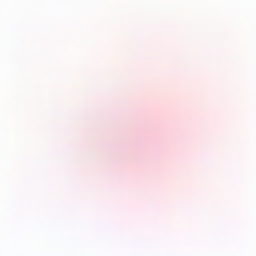

2017-08-26 14:44:55.429245: Step: 0, Generator: 0.417400
2017-08-26 14:44:58.601979: Step: 1, Generator: 0.332337
2017-08-26 14:45:01.888026: Step: 2, Generator: 0.285000
2017-08-26 14:45:05.411726: Step: 3, Generator: 0.247199
2017-08-26 14:45:08.900979: Step: 4, Generator: 0.228937
2017-08-26 14:45:12.468169: Step: 5, Generator: 0.212460
2017-08-26 14:45:16.063746: Step: 6, Generator: 0.198863
2017-08-26 14:45:17.499887: Step: 7, Generator: 0.199045
2017-08-26 14:45:21.028707: Step: 8, Generator: 0.186247
2017-08-26 14:45:24.617630: Step: 9, Generator: 0.180924


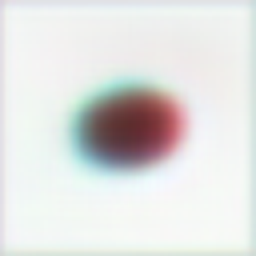

2017-08-26 14:45:29.554215: Step: 10, Generator: 0.177200
2017-08-26 14:45:33.157329: Step: 11, Generator: 0.177789
2017-08-26 14:45:36.767364: Step: 12, Generator: 0.176031
2017-08-26 14:45:40.449084: Step: 13, Generator: 0.159914
2017-08-26 14:45:44.115122: Step: 14, Generator: 0.157090
2017-08-26 14:45:45.538099: Step: 15, Generator: 0.160141
2017-08-26 14:45:49.216026: Step: 16, Generator: 0.159703
2017-08-26 14:45:52.936737: Step: 17, Generator: 0.150142
2017-08-26 14:45:56.611934: Step: 18, Generator: 0.150425
2017-08-26 14:46:00.301300: Step: 19, Generator: 0.152965


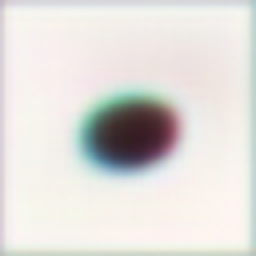

2017-08-26 14:46:05.444383: Step: 20, Generator: 0.147611
2017-08-26 14:46:09.105816: Step: 21, Generator: 0.141916
2017-08-26 14:46:12.724340: Step: 22, Generator: 0.147099
2017-08-26 14:46:14.170510: Step: 23, Generator: 0.128985
2017-08-26 14:46:17.864908: Step: 24, Generator: 0.133979
2017-08-26 14:46:21.492994: Step: 25, Generator: 0.132996
2017-08-26 14:46:25.164169: Step: 26, Generator: 0.131375
2017-08-26 14:46:28.743837: Step: 27, Generator: 0.129674
2017-08-26 14:46:32.354816: Step: 28, Generator: 0.131168
2017-08-26 14:46:36.019617: Step: 29, Generator: 0.131989


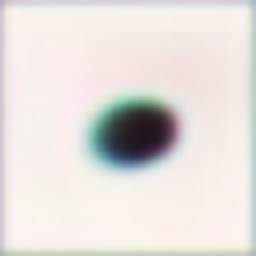

2017-08-26 14:46:40.921761: Step: 30, Generator: 0.131475
2017-08-26 14:46:42.347831: Step: 31, Generator: 0.133259
2017-08-26 14:46:45.917126: Step: 32, Generator: 0.131823
2017-08-26 14:46:49.620064: Step: 33, Generator: 0.126838
2017-08-26 14:46:53.204350: Step: 34, Generator: 0.123173
2017-08-26 14:46:56.847849: Step: 35, Generator: 0.119405
2017-08-26 14:47:00.575243: Step: 36, Generator: 0.118439
2017-08-26 14:47:04.239463: Step: 37, Generator: 0.125149
2017-08-26 14:47:07.905327: Step: 38, Generator: 0.125092
2017-08-26 14:47:09.325400: Step: 39, Generator: 0.116001


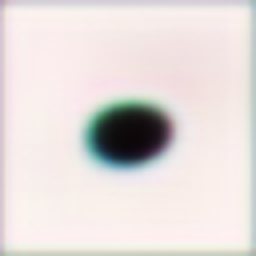

2017-08-26 14:47:14.223983: Step: 40, Generator: 0.111407
2017-08-26 14:47:17.842894: Step: 41, Generator: 0.123165
2017-08-26 14:47:21.535582: Step: 42, Generator: 0.111963
2017-08-26 14:47:25.129504: Step: 43, Generator: 0.109893
2017-08-26 14:47:28.781385: Step: 44, Generator: 0.123796
2017-08-26 14:47:32.471258: Step: 45, Generator: 0.121337
2017-08-26 14:47:36.041781: Step: 46, Generator: 0.111505
2017-08-26 14:47:37.486378: Step: 47, Generator: 0.115827
2017-08-26 14:47:41.186936: Step: 48, Generator: 0.107230
2017-08-26 14:47:44.850704: Step: 49, Generator: 0.108124


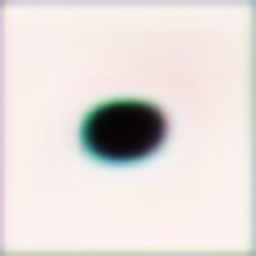

2017-08-26 14:47:49.807533: Step: 50, Generator: 0.109847
2017-08-26 14:47:53.441543: Step: 51, Generator: 0.118882
2017-08-26 14:47:57.339509: Step: 52, Generator: 0.102708
2017-08-26 14:48:01.389591: Step: 53, Generator: 0.112581
2017-08-26 14:48:05.546269: Step: 54, Generator: 0.114568
2017-08-26 14:48:07.198613: Step: 55, Generator: 0.106015
2017-08-26 14:48:11.227794: Step: 56, Generator: 0.112514
2017-08-26 14:48:15.048433: Step: 57, Generator: 0.106956
2017-08-26 14:48:18.849505: Step: 58, Generator: 0.107133
2017-08-26 14:48:22.691572: Step: 59, Generator: 0.103930


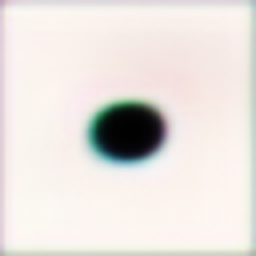

2017-08-26 14:48:28.034913: Step: 60, Generator: 0.100333
2017-08-26 14:48:31.902974: Step: 61, Generator: 0.105332
2017-08-26 14:48:35.816882: Step: 62, Generator: 0.108951
2017-08-26 14:48:37.349110: Step: 63, Generator: 0.100315
2017-08-26 14:48:41.352788: Step: 64, Generator: 0.114691
2017-08-26 14:48:45.435029: Step: 65, Generator: 0.103797
2017-08-26 14:48:49.526525: Step: 66, Generator: 0.104116
2017-08-26 14:48:53.577447: Step: 67, Generator: 0.097749
2017-08-26 14:48:57.660717: Step: 68, Generator: 0.107462
2017-08-26 14:49:01.779111: Step: 69, Generator: 0.100947


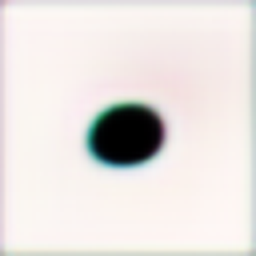

2017-08-26 14:49:07.589462: Step: 70, Generator: 0.096961
2017-08-26 14:49:09.175935: Step: 71, Generator: 0.093846
2017-08-26 14:49:13.252974: Step: 72, Generator: 0.099998
2017-08-26 14:49:17.403226: Step: 73, Generator: 0.100065
2017-08-26 14:49:21.660713: Step: 74, Generator: 0.094464
2017-08-26 14:49:25.895036: Step: 75, Generator: 0.099970
2017-08-26 14:49:30.132323: Step: 76, Generator: 0.103972
2017-08-26 14:49:34.220051: Step: 77, Generator: 0.096423
2017-08-26 14:49:38.376114: Step: 78, Generator: 0.091201
2017-08-26 14:49:40.053509: Step: 79, Generator: 0.097498


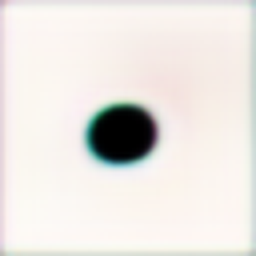

2017-08-26 14:49:45.794827: Step: 80, Generator: 0.104352
2017-08-26 14:49:49.995716: Step: 81, Generator: 0.095816
2017-08-26 14:49:54.060039: Step: 82, Generator: 0.096925
2017-08-26 14:49:58.229473: Step: 83, Generator: 0.088568
2017-08-26 14:50:02.450201: Step: 84, Generator: 0.097350
2017-08-26 14:50:06.737255: Step: 85, Generator: 0.089444
2017-08-26 14:50:10.848536: Step: 86, Generator: 0.101857
2017-08-26 14:50:12.447967: Step: 87, Generator: 0.104343
2017-08-26 14:50:16.603947: Step: 88, Generator: 0.093189
2017-08-26 14:50:20.820205: Step: 89, Generator: 0.098670


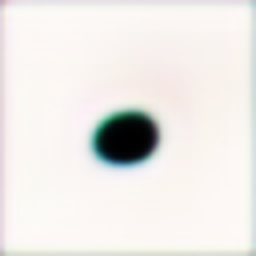

2017-08-26 14:50:26.428665: Step: 90, Generator: 0.090106
2017-08-26 14:50:30.498888: Step: 91, Generator: 0.093758
2017-08-26 14:50:34.714146: Step: 92, Generator: 0.082234
2017-08-26 14:50:38.770023: Step: 93, Generator: 0.099939
2017-08-26 14:50:42.834140: Step: 94, Generator: 0.091794
2017-08-26 14:50:44.444382: Step: 95, Generator: 0.100761
2017-08-26 14:50:48.509240: Step: 96, Generator: 0.096460
2017-08-26 14:50:52.579232: Step: 97, Generator: 0.085756
2017-08-26 14:50:56.807545: Step: 98, Generator: 0.089367
2017-08-26 14:51:00.950263: Step: 99, Generator: 0.088539


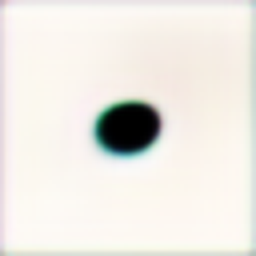

2017-08-26 14:51:06.553296: Step: 100, Generator: 0.091987
2017-08-26 14:51:10.585190: Step: 101, Generator: 0.087814
2017-08-26 14:51:14.628031: Step: 102, Generator: 0.083252
2017-08-26 14:51:16.239418: Step: 103, Generator: 0.080360
2017-08-26 14:51:20.331457: Step: 104, Generator: 0.079669
2017-08-26 14:51:24.422985: Step: 105, Generator: 0.096238
2017-08-26 14:51:28.513303: Step: 106, Generator: 0.084907
2017-08-26 14:51:32.485874: Step: 107, Generator: 0.087123
2017-08-26 14:51:36.493874: Step: 108, Generator: 0.077572
2017-08-26 14:51:40.584363: Step: 109, Generator: 0.084960


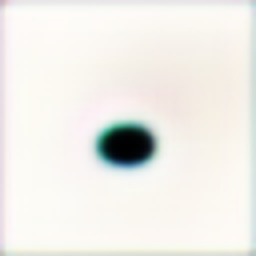

2017-08-26 14:51:46.195509: Step: 110, Generator: 0.086358
2017-08-26 14:51:47.807267: Step: 111, Generator: 0.083274
2017-08-26 14:51:51.736367: Step: 112, Generator: 0.082103
2017-08-26 14:51:55.765156: Step: 113, Generator: 0.079528
2017-08-26 14:52:00.074964: Step: 114, Generator: 0.078310
2017-08-26 14:52:04.475099: Step: 115, Generator: 0.078429
2017-08-26 14:52:08.680756: Step: 116, Generator: 0.078672
2017-08-26 14:52:12.742346: Step: 117, Generator: 0.080853
2017-08-26 14:52:16.806852: Step: 118, Generator: 0.082186
2017-08-26 14:52:18.401764: Step: 119, Generator: 0.087581


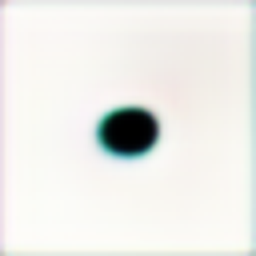

2017-08-26 14:52:23.828202: Step: 120, Generator: 0.096745
2017-08-26 14:52:27.914009: Step: 121, Generator: 0.079425
2017-08-26 14:52:31.990597: Step: 122, Generator: 0.081700
2017-08-26 14:52:36.063454: Step: 123, Generator: 0.078431
2017-08-26 14:52:40.138080: Step: 124, Generator: 0.084074
2017-08-26 14:52:44.229622: Step: 125, Generator: 0.083710
2017-08-26 14:52:48.280233: Step: 126, Generator: 0.078069
2017-08-26 14:52:49.883969: Step: 127, Generator: 0.081994
2017-08-26 14:52:53.957855: Step: 128, Generator: 0.082553
2017-08-26 14:52:58.052204: Step: 129, Generator: 0.074983


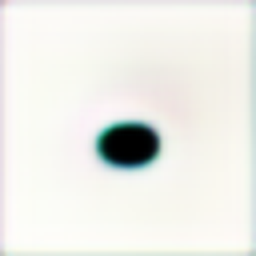

2017-08-26 14:53:03.653923: Step: 130, Generator: 0.077987
2017-08-26 14:53:07.736482: Step: 131, Generator: 0.081612
2017-08-26 14:53:11.791819: Step: 132, Generator: 0.074763
2017-08-26 14:53:15.868342: Step: 133, Generator: 0.085592
2017-08-26 14:53:19.937806: Step: 134, Generator: 0.080264
2017-08-26 14:53:21.551120: Step: 135, Generator: 0.075197
2017-08-26 14:53:25.666238: Step: 136, Generator: 0.073311
2017-08-26 14:53:29.773341: Step: 137, Generator: 0.076040
2017-08-26 14:53:33.873743: Step: 138, Generator: 0.075026
2017-08-26 14:53:38.137172: Step: 139, Generator: 0.074288


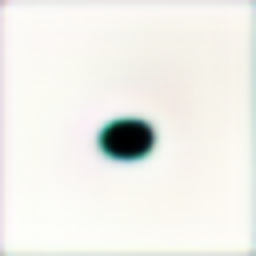

2017-08-26 14:53:43.728057: Step: 140, Generator: 0.086858
2017-08-26 14:53:47.841868: Step: 141, Generator: 0.082070
2017-08-26 14:53:51.916752: Step: 142, Generator: 0.077256
2017-08-26 14:53:53.517882: Step: 143, Generator: 0.070018
2017-08-26 14:53:57.600696: Step: 144, Generator: 0.077498
2017-08-26 14:54:01.713382: Step: 145, Generator: 0.088719
2017-08-26 14:54:05.963216: Step: 146, Generator: 0.073273
2017-08-26 14:54:10.025220: Step: 147, Generator: 0.073146
2017-08-26 14:54:14.151445: Step: 148, Generator: 0.070956
2017-08-26 14:54:18.226467: Step: 149, Generator: 0.072730


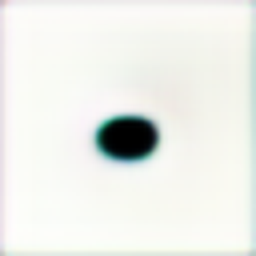

2017-08-26 14:54:24.074396: Step: 150, Generator: 0.068286
2017-08-26 14:54:25.826668: Step: 151, Generator: 0.082277
2017-08-26 14:54:30.503819: Step: 152, Generator: 0.085339
2017-08-26 14:54:35.511309: Step: 153, Generator: 0.070153
2017-08-26 14:54:40.105955: Step: 154, Generator: 0.081592
2017-08-26 14:54:44.673606: Step: 155, Generator: 0.067129
2017-08-26 14:54:49.419409: Step: 156, Generator: 0.069532
2017-08-26 14:54:54.168982: Step: 157, Generator: 0.070411
2017-08-26 14:54:58.794655: Step: 158, Generator: 0.070607
2017-08-26 14:55:00.709045: Step: 159, Generator: 0.070709


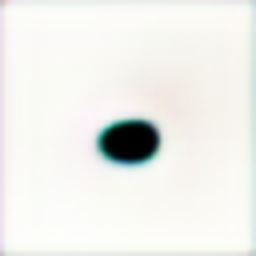

2017-08-26 14:55:06.754244: Step: 160, Generator: 0.092209
2017-08-26 14:55:10.842848: Step: 161, Generator: 0.075005
2017-08-26 14:55:14.939791: Step: 162, Generator: 0.071624
2017-08-26 14:55:19.019993: Step: 163, Generator: 0.069976
2017-08-26 14:55:23.215722: Step: 164, Generator: 0.068290
2017-08-26 14:55:27.265404: Step: 165, Generator: 0.072807
2017-08-26 14:55:31.338024: Step: 166, Generator: 0.072023
2017-08-26 14:55:32.932261: Step: 167, Generator: 0.080364
2017-08-26 14:55:37.026679: Step: 168, Generator: 0.079965
2017-08-26 14:55:41.233990: Step: 169, Generator: 0.072166


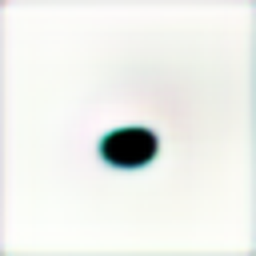

2017-08-26 14:55:46.771103: Step: 170, Generator: 0.069224
2017-08-26 14:55:50.840778: Step: 171, Generator: 0.071729
2017-08-26 14:55:54.927098: Step: 172, Generator: 0.070619
2017-08-26 14:55:59.140754: Step: 173, Generator: 0.066502
2017-08-26 14:56:03.220790: Step: 174, Generator: 0.080605
2017-08-26 14:56:04.818416: Step: 175, Generator: 0.074642
2017-08-26 14:56:08.933260: Step: 176, Generator: 0.073809
2017-08-26 14:56:13.163316: Step: 177, Generator: 0.064942
2017-08-26 14:56:17.230876: Step: 178, Generator: 0.063957
2017-08-26 14:56:21.304399: Step: 179, Generator: 0.068158


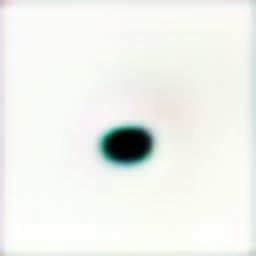

2017-08-26 14:56:26.955302: Step: 180, Generator: 0.071125
2017-08-26 14:56:31.061622: Step: 181, Generator: 0.069857
2017-08-26 14:56:35.128859: Step: 182, Generator: 0.074962
2017-08-26 14:56:36.790061: Step: 183, Generator: 0.060473
2017-08-26 14:56:41.441813: Step: 184, Generator: 0.073212
2017-08-26 14:56:46.037244: Step: 185, Generator: 0.069079
2017-08-26 14:56:51.016807: Step: 186, Generator: 0.069539
2017-08-26 14:56:55.773274: Step: 187, Generator: 0.067824
2017-08-26 14:57:00.194950: Step: 188, Generator: 0.067364
2017-08-26 14:57:04.881565: Step: 189, Generator: 0.065160


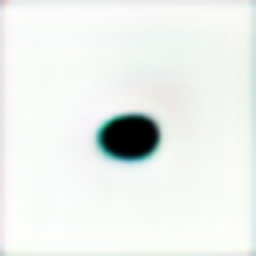

2017-08-26 14:57:12.054173: Step: 190, Generator: 0.063131
2017-08-26 14:57:14.173353: Step: 191, Generator: 0.074476
2017-08-26 14:57:18.581285: Step: 192, Generator: 0.069056
2017-08-26 14:57:22.885723: Step: 193, Generator: 0.070129
2017-08-26 14:57:27.171012: Step: 194, Generator: 0.062209
2017-08-26 14:57:31.629308: Step: 195, Generator: 0.068743
2017-08-26 14:57:35.945127: Step: 196, Generator: 0.075500
2017-08-26 14:57:40.318170: Step: 197, Generator: 0.061344
2017-08-26 14:57:44.589381: Step: 198, Generator: 0.069857
2017-08-26 14:57:46.262773: Step: 199, Generator: 0.063415


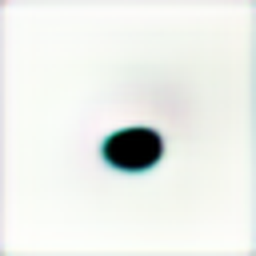

2017-08-26 14:57:52.285588: Step: 200, Generator: 0.074717
2017-08-26 14:57:56.545534: Step: 201, Generator: 0.068240
2017-08-26 14:58:00.815831: Step: 202, Generator: 0.066639
2017-08-26 14:58:05.066767: Step: 203, Generator: 0.066278
2017-08-26 14:58:09.343313: Step: 204, Generator: 0.065170
2017-08-26 14:58:13.652093: Step: 205, Generator: 0.065254
2017-08-26 14:58:17.951500: Step: 206, Generator: 0.056303
2017-08-26 14:58:19.667810: Step: 207, Generator: 0.074689
2017-08-26 14:58:23.980201: Step: 208, Generator: 0.068502
2017-08-26 14:58:28.246880: Step: 209, Generator: 0.067912


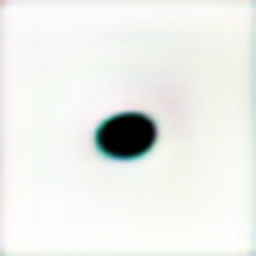

2017-08-26 14:58:33.983028: Step: 210, Generator: 0.064399
2017-08-26 14:58:38.209788: Step: 211, Generator: 0.065691
2017-08-26 14:58:42.426931: Step: 212, Generator: 0.075767
2017-08-26 14:58:46.655439: Step: 213, Generator: 0.065648
2017-08-26 14:58:50.920123: Step: 214, Generator: 0.068178
2017-08-26 14:58:52.644071: Step: 215, Generator: 0.088221
2017-08-26 14:58:56.890122: Step: 216, Generator: 0.078214
2017-08-26 14:59:01.218176: Step: 217, Generator: 0.068091
2017-08-26 14:59:05.607688: Step: 218, Generator: 0.070102
2017-08-26 14:59:09.819526: Step: 219, Generator: 0.063337


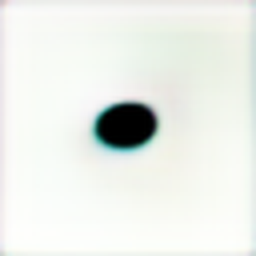

2017-08-26 14:59:15.618295: Step: 220, Generator: 0.066681
2017-08-26 14:59:19.838875: Step: 221, Generator: 0.065365
2017-08-26 14:59:24.081547: Step: 222, Generator: 0.063866
2017-08-26 14:59:25.751714: Step: 223, Generator: 0.074107
2017-08-26 14:59:30.029423: Step: 224, Generator: 0.073073
2017-08-26 14:59:34.331712: Step: 225, Generator: 0.064410
2017-08-26 14:59:38.536040: Step: 226, Generator: 0.065055
2017-08-26 14:59:42.825315: Step: 227, Generator: 0.071832
2017-08-26 14:59:47.120735: Step: 228, Generator: 0.061896
2017-08-26 14:59:51.743868: Step: 229, Generator: 0.063765


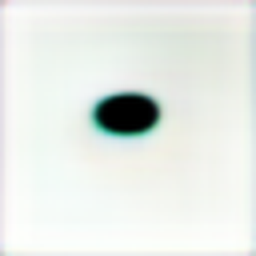

2017-08-26 14:59:57.932983: Step: 230, Generator: 0.066286
2017-08-26 14:59:59.605163: Step: 231, Generator: 0.082215
2017-08-26 15:00:03.957110: Step: 232, Generator: 0.070802
2017-08-26 15:00:08.187871: Step: 233, Generator: 0.065571
2017-08-26 15:00:12.681021: Step: 234, Generator: 0.064994
2017-08-26 15:00:17.082801: Step: 235, Generator: 0.061134
2017-08-26 15:00:21.977640: Step: 236, Generator: 0.064398
2017-08-26 15:00:27.022004: Step: 237, Generator: 0.063706
2017-08-26 15:00:31.951207: Step: 238, Generator: 0.067583
2017-08-26 15:00:34.111832: Step: 239, Generator: 0.059976


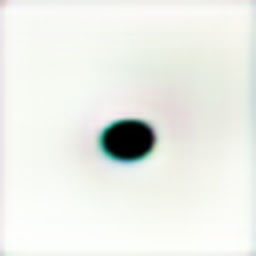

2017-08-26 15:00:40.232236: Step: 240, Generator: 0.069809
2017-08-26 15:00:44.820372: Step: 241, Generator: 0.064884
2017-08-26 15:00:49.355783: Step: 242, Generator: 0.063370
2017-08-26 15:00:53.856891: Step: 243, Generator: 0.064287
2017-08-26 15:00:58.418567: Step: 244, Generator: 0.065714
2017-08-26 15:01:02.827089: Step: 245, Generator: 0.064265
2017-08-26 15:01:07.178432: Step: 246, Generator: 0.065657
2017-08-26 15:01:08.956373: Step: 247, Generator: 0.062797
2017-08-26 15:01:13.426332: Step: 248, Generator: 0.063489
2017-08-26 15:01:17.676899: Step: 249, Generator: 0.064955


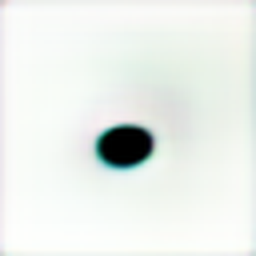

2017-08-26 15:01:23.512812: Step: 250, Generator: 0.059327
2017-08-26 15:01:27.841707: Step: 251, Generator: 0.066388
2017-08-26 15:01:32.165802: Step: 252, Generator: 0.059541
2017-08-26 15:01:36.476418: Step: 253, Generator: 0.060617
2017-08-26 15:01:40.744923: Step: 254, Generator: 0.062804
2017-08-26 15:01:42.477202: Step: 255, Generator: 0.074007
2017-08-26 15:01:46.816246: Step: 256, Generator: 0.058798
2017-08-26 15:01:51.322660: Step: 257, Generator: 0.067004
2017-08-26 15:01:55.966292: Step: 258, Generator: 0.059239
2017-08-26 15:02:00.434341: Step: 259, Generator: 0.069671


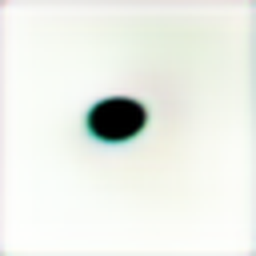

2017-08-26 15:02:06.289980: Step: 260, Generator: 0.064324
2017-08-26 15:02:10.715531: Step: 261, Generator: 0.060111
2017-08-26 15:02:14.968189: Step: 262, Generator: 0.062386
2017-08-26 15:02:16.702903: Step: 263, Generator: 0.065314
2017-08-26 15:02:21.239032: Step: 264, Generator: 0.061853
2017-08-26 15:02:25.823516: Step: 265, Generator: 0.056438
2017-08-26 15:02:30.362303: Step: 266, Generator: 0.063600
2017-08-26 15:02:34.816170: Step: 267, Generator: 0.065541
2017-08-26 15:02:39.387906: Step: 268, Generator: 0.062505
2017-08-26 15:02:43.639390: Step: 269, Generator: 0.060334


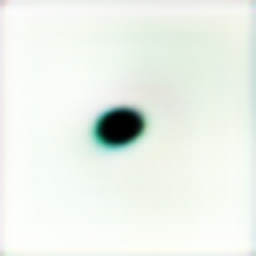

2017-08-26 15:02:49.567646: Step: 270, Generator: 0.062134
2017-08-26 15:02:51.256101: Step: 271, Generator: 0.071866
2017-08-26 15:02:55.512969: Step: 272, Generator: 0.075952
2017-08-26 15:02:59.923388: Step: 273, Generator: 0.060016
2017-08-26 15:03:04.317566: Step: 274, Generator: 0.055683
2017-08-26 15:03:08.551160: Step: 275, Generator: 0.062162
2017-08-26 15:03:12.927864: Step: 276, Generator: 0.065911
2017-08-26 15:03:17.183079: Step: 277, Generator: 0.057530
2017-08-26 15:03:21.461508: Step: 278, Generator: 0.064767
2017-08-26 15:03:23.313850: Step: 279, Generator: 0.081114


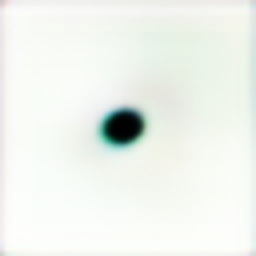

2017-08-26 15:03:29.449038: Step: 280, Generator: 0.067977
2017-08-26 15:03:33.769732: Step: 281, Generator: 0.056361
2017-08-26 15:03:38.034859: Step: 282, Generator: 0.066834
2017-08-26 15:03:42.287522: Step: 283, Generator: 0.064919
2017-08-26 15:03:46.656337: Step: 284, Generator: 0.064234
2017-08-26 15:03:50.901763: Step: 285, Generator: 0.061874
2017-08-26 15:03:55.174839: Step: 286, Generator: 0.064797
2017-08-26 15:03:56.920128: Step: 287, Generator: 0.057407
2017-08-26 15:04:01.181052: Step: 288, Generator: 0.062777
2017-08-26 15:04:05.455451: Step: 289, Generator: 0.059954


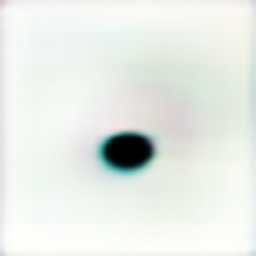

2017-08-26 15:04:11.533218: Step: 290, Generator: 0.057541
2017-08-26 15:04:16.056972: Step: 291, Generator: 0.061903
2017-08-26 15:04:20.604093: Step: 292, Generator: 0.058438
2017-08-26 15:04:25.451441: Step: 293, Generator: 0.060478
2017-08-26 15:04:30.387596: Step: 294, Generator: 0.069465
2017-08-26 15:04:32.765180: Step: 295, Generator: 0.064259
2017-08-26 15:04:38.494350: Step: 296, Generator: 0.060435
2017-08-26 15:04:43.267855: Step: 297, Generator: 0.054617
2017-08-26 15:04:47.728746: Step: 298, Generator: 0.063486
2017-08-26 15:04:52.272130: Step: 299, Generator: 0.057736


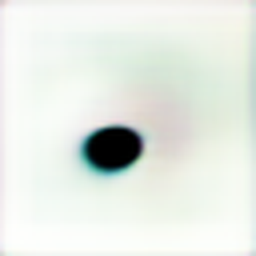

2017-08-26 15:04:58.391486: Step: 300, Generator: 0.060073
2017-08-26 15:05:03.709717: Step: 301, Generator: 0.065011
2017-08-26 15:05:09.110697: Step: 302, Generator: 0.065170
2017-08-26 15:05:11.087790: Step: 303, Generator: 0.054677
2017-08-26 15:05:15.835535: Step: 304, Generator: 0.065135
2017-08-26 15:05:20.321082: Step: 305, Generator: 0.062103
2017-08-26 15:05:24.638168: Step: 306, Generator: 0.060239
2017-08-26 15:05:29.066310: Step: 307, Generator: 0.060597
2017-08-26 15:05:33.486449: Step: 308, Generator: 0.060417
2017-08-26 15:05:37.737704: Step: 309, Generator: 0.053750


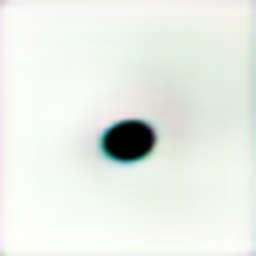

2017-08-26 15:05:43.723436: Step: 310, Generator: 0.059903
2017-08-26 15:05:45.449035: Step: 311, Generator: 0.054688
2017-08-26 15:05:49.719828: Step: 312, Generator: 0.057371
2017-08-26 15:05:54.109952: Step: 313, Generator: 0.064088
2017-08-26 15:05:58.486939: Step: 314, Generator: 0.058689
2017-08-26 15:06:02.747644: Step: 315, Generator: 0.056918
2017-08-26 15:06:07.162341: Step: 316, Generator: 0.054731
2017-08-26 15:06:11.562784: Step: 317, Generator: 0.059101
2017-08-26 15:06:15.844560: Step: 318, Generator: 0.051556
2017-08-26 15:06:17.575458: Step: 319, Generator: 0.056025


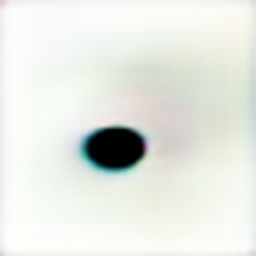

2017-08-26 15:06:23.536005: Step: 320, Generator: 0.061941
2017-08-26 15:06:27.781953: Step: 321, Generator: 0.051381
2017-08-26 15:06:32.238192: Step: 322, Generator: 0.063557
2017-08-26 15:06:36.610964: Step: 323, Generator: 0.064948
2017-08-26 15:06:40.860196: Step: 324, Generator: 0.061632
2017-08-26 15:06:45.242474: Step: 325, Generator: 0.061189
2017-08-26 15:06:49.515037: Step: 326, Generator: 0.054799
2017-08-26 15:06:51.216799: Step: 327, Generator: 0.051648
2017-08-26 15:06:55.621961: Step: 328, Generator: 0.057694
2017-08-26 15:07:00.402049: Step: 329, Generator: 0.055366


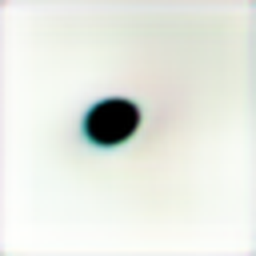

2017-08-26 15:07:07.393569: Step: 330, Generator: 0.067596
2017-08-26 15:07:12.435829: Step: 331, Generator: 0.057401
2017-08-26 15:07:18.061520: Step: 332, Generator: 0.053466
2017-08-26 15:07:23.435806: Step: 333, Generator: 0.065335
2017-08-26 15:07:28.574981: Step: 334, Generator: 0.059187
2017-08-26 15:07:30.494896: Step: 335, Generator: 0.050320
2017-08-26 15:07:35.453485: Step: 336, Generator: 0.059167
2017-08-26 15:07:40.290864: Step: 337, Generator: 0.058105
2017-08-26 15:07:45.297728: Step: 338, Generator: 0.064064
2017-08-26 15:07:50.610370: Step: 339, Generator: 0.060532


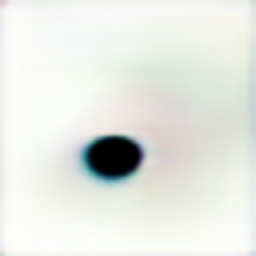

2017-08-26 15:07:58.630052: Step: 340, Generator: 0.058332
2017-08-26 15:08:04.040279: Step: 341, Generator: 0.057891
2017-08-26 15:08:09.270268: Step: 342, Generator: 0.059993
2017-08-26 15:08:11.307572: Step: 343, Generator: 0.058733
2017-08-26 15:08:16.677440: Step: 344, Generator: 0.055158
2017-08-26 15:08:22.144939: Step: 345, Generator: 0.061731
2017-08-26 15:08:27.800718: Step: 346, Generator: 0.056771
2017-08-26 15:08:33.672731: Step: 347, Generator: 0.066297
2017-08-26 15:08:39.890415: Step: 348, Generator: 0.061044
2017-08-26 15:08:45.236261: Step: 349, Generator: 0.062476


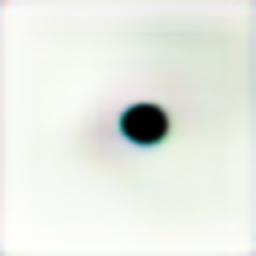

2017-08-26 15:08:52.641448: Step: 350, Generator: 0.061374
2017-08-26 15:08:55.103934: Step: 351, Generator: 0.054897
2017-08-26 15:09:02.090077: Step: 352, Generator: 0.061369
2017-08-26 15:09:11.382387: Step: 353, Generator: 0.054858
2017-08-26 15:09:17.993972: Step: 354, Generator: 0.059321
2017-08-26 15:09:22.674096: Step: 355, Generator: 0.058153
2017-08-26 15:09:27.314154: Step: 356, Generator: 0.052252
2017-08-26 15:09:31.717245: Step: 357, Generator: 0.055131
2017-08-26 15:09:36.104848: Step: 358, Generator: 0.057228
2017-08-26 15:09:37.838576: Step: 359, Generator: 0.061327


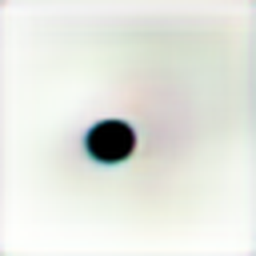

2017-08-26 15:09:43.741556: Step: 360, Generator: 0.062749
2017-08-26 15:09:48.133520: Step: 361, Generator: 0.058963
2017-08-26 15:09:52.394029: Step: 362, Generator: 0.056491
2017-08-26 15:09:56.831903: Step: 363, Generator: 0.057963
2017-08-26 15:10:01.139888: Step: 364, Generator: 0.057087
2017-08-26 15:10:05.535678: Step: 365, Generator: 0.059215
2017-08-26 15:10:09.940171: Step: 366, Generator: 0.059631
2017-08-26 15:10:11.622196: Step: 367, Generator: 0.062004
2017-08-26 15:10:15.896560: Step: 368, Generator: 0.058289
2017-08-26 15:10:20.317888: Step: 369, Generator: 0.052291


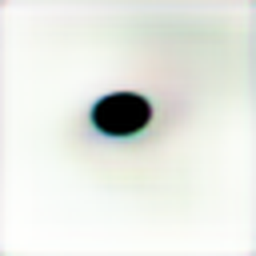

2017-08-26 15:10:26.092872: Step: 370, Generator: 0.058648
2017-08-26 15:10:30.399085: Step: 371, Generator: 0.052972
2017-08-26 15:10:34.753750: Step: 372, Generator: 0.057483
2017-08-26 15:10:39.000419: Step: 373, Generator: 0.061475
2017-08-26 15:10:43.329364: Step: 374, Generator: 0.057622
2017-08-26 15:10:45.066193: Step: 375, Generator: 0.059063
2017-08-26 15:10:49.334237: Step: 376, Generator: 0.053130
2017-08-26 15:10:53.581329: Step: 377, Generator: 0.053951
2017-08-26 15:10:59.022753: Step: 378, Generator: 0.056125
2017-08-26 15:11:04.864335: Step: 379, Generator: 0.050879


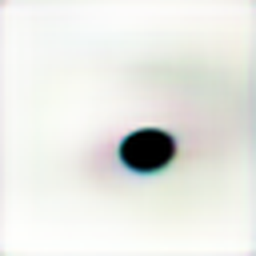

2017-08-26 15:11:12.229542: Step: 380, Generator: 0.061372
2017-08-26 15:11:17.271429: Step: 381, Generator: 0.055496
2017-08-26 15:11:21.952998: Step: 382, Generator: 0.057009
2017-08-26 15:11:23.886177: Step: 383, Generator: 0.061759
2017-08-26 15:11:28.897086: Step: 384, Generator: 0.056966
2017-08-26 15:11:33.384335: Step: 385, Generator: 0.062137
2017-08-26 15:11:38.021548: Step: 386, Generator: 0.061900
2017-08-26 15:11:43.217193: Step: 387, Generator: 0.052219
2017-08-26 15:11:48.500278: Step: 388, Generator: 0.056924
2017-08-26 15:11:53.386214: Step: 389, Generator: 0.057352


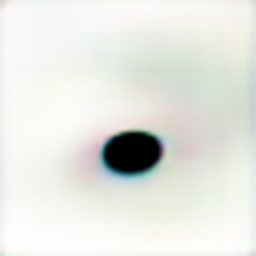

2017-08-26 15:12:00.526115: Step: 390, Generator: 0.058353
2017-08-26 15:12:02.508884: Step: 391, Generator: 0.055633
2017-08-26 15:12:08.012344: Step: 392, Generator: 0.055090
2017-08-26 15:12:12.997544: Step: 393, Generator: 0.054113
2017-08-26 15:12:18.027152: Step: 394, Generator: 0.054472
2017-08-26 15:12:22.752017: Step: 395, Generator: 0.058974
2017-08-26 15:12:28.737762: Step: 396, Generator: 0.059296
2017-08-26 15:12:34.086558: Step: 397, Generator: 0.056684
2017-08-26 15:12:39.166893: Step: 398, Generator: 0.058750
2017-08-26 15:12:41.423837: Step: 399, Generator: 0.047971


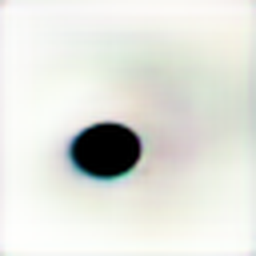

2017-08-26 15:12:49.329666: Step: 400, Generator: 0.055964
2017-08-26 15:12:54.427095: Step: 401, Generator: 0.058571
2017-08-26 15:12:59.442417: Step: 402, Generator: 0.056656
2017-08-26 15:13:05.183359: Step: 403, Generator: 0.057582
2017-08-26 15:13:11.797022: Step: 404, Generator: 0.056405
2017-08-26 15:13:17.882772: Step: 405, Generator: 0.056215
2017-08-26 15:13:24.409392: Step: 406, Generator: 0.058846
2017-08-26 15:13:26.868104: Step: 407, Generator: 0.067418
2017-08-26 15:13:32.700132: Step: 408, Generator: 0.064038
2017-08-26 15:13:39.061353: Step: 409, Generator: 0.060063


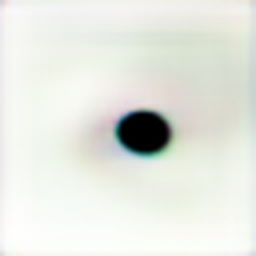

2017-08-26 15:13:46.788167: Step: 410, Generator: 0.056515
2017-08-26 15:13:52.066458: Step: 411, Generator: 0.060939
2017-08-26 15:13:57.279925: Step: 412, Generator: 0.052811
2017-08-26 15:14:02.414248: Step: 413, Generator: 0.050563
2017-08-26 15:14:08.151592: Step: 414, Generator: 0.055094
2017-08-26 15:14:10.280268: Step: 415, Generator: 0.055355
2017-08-26 15:14:16.067094: Step: 416, Generator: 0.053340
2017-08-26 15:14:21.640489: Step: 417, Generator: 0.053807
2017-08-26 15:14:26.757744: Step: 418, Generator: 0.055689
2017-08-26 15:14:31.682889: Step: 419, Generator: 0.052538


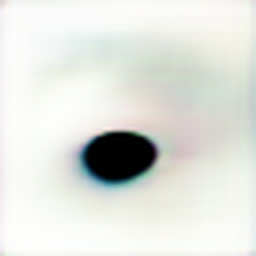

2017-08-26 15:14:38.090828: Step: 420, Generator: 0.055471
2017-08-26 15:14:42.843966: Step: 421, Generator: 0.051420
2017-08-26 15:14:47.513366: Step: 422, Generator: 0.055581
2017-08-26 15:14:49.386803: Step: 423, Generator: 0.055269
2017-08-26 15:14:54.590136: Step: 424, Generator: 0.060768
2017-08-26 15:14:59.689261: Step: 425, Generator: 0.051731
2017-08-26 15:15:04.970278: Step: 426, Generator: 0.052689
2017-08-26 15:15:09.973123: Step: 427, Generator: 0.051883
2017-08-26 15:15:15.125622: Step: 428, Generator: 0.051650
2017-08-26 15:15:20.085202: Step: 429, Generator: 0.060900


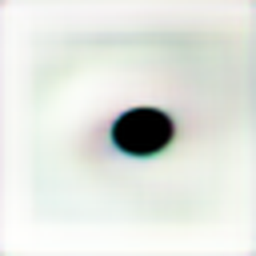

2017-08-26 15:15:26.807821: Step: 430, Generator: 0.050471
2017-08-26 15:15:28.898632: Step: 431, Generator: 0.051650
2017-08-26 15:15:33.983654: Step: 432, Generator: 0.057239
2017-08-26 15:15:39.010697: Step: 433, Generator: 0.053760
2017-08-26 15:15:44.423059: Step: 434, Generator: 0.056601
2017-08-26 15:15:49.352662: Step: 435, Generator: 0.050758
2017-08-26 15:15:54.832021: Step: 436, Generator: 0.058037
2017-08-26 15:15:59.957604: Step: 437, Generator: 0.056899
2017-08-26 15:16:04.615669: Step: 438, Generator: 0.057190
2017-08-26 15:16:06.443557: Step: 439, Generator: 0.057525


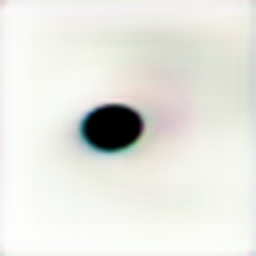

2017-08-26 15:16:12.531417: Step: 440, Generator: 0.054834
2017-08-26 15:16:16.938623: Step: 441, Generator: 0.051736
2017-08-26 15:16:21.331157: Step: 442, Generator: 0.053696
2017-08-26 15:16:25.734160: Step: 443, Generator: 0.057445
2017-08-26 15:16:30.135639: Step: 444, Generator: 0.051584
2017-08-26 15:16:34.533002: Step: 445, Generator: 0.050543
2017-08-26 15:16:38.751075: Step: 446, Generator: 0.054479
2017-08-26 15:16:40.462728: Step: 447, Generator: 0.057591
2017-08-26 15:16:44.842380: Step: 448, Generator: 0.053944
2017-08-26 15:16:49.085254: Step: 449, Generator: 0.052598


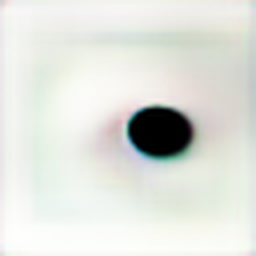

2017-08-26 15:16:55.030971: Step: 450, Generator: 0.057828
2017-08-26 15:16:59.291564: Step: 451, Generator: 0.060921
2017-08-26 15:17:03.652775: Step: 452, Generator: 0.054203
2017-08-26 15:17:07.952220: Step: 453, Generator: 0.052357
2017-08-26 15:17:12.168378: Step: 454, Generator: 0.052322
2017-08-26 15:17:13.834225: Step: 455, Generator: 0.055535
2017-08-26 15:17:18.045438: Step: 456, Generator: 0.053669
2017-08-26 15:17:22.302712: Step: 457, Generator: 0.052403
2017-08-26 15:17:26.603598: Step: 458, Generator: 0.054826
2017-08-26 15:17:30.829200: Step: 459, Generator: 0.052019


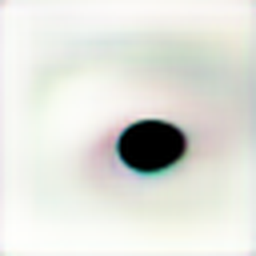

2017-08-26 15:17:36.600443: Step: 460, Generator: 0.054835
2017-08-26 15:17:40.822631: Step: 461, Generator: 0.051953
2017-08-26 15:17:45.042070: Step: 462, Generator: 0.053954
2017-08-26 15:17:46.714955: Step: 463, Generator: 0.048819
2017-08-26 15:17:50.835258: Step: 464, Generator: 0.050138
2017-08-26 15:17:55.069251: Step: 465, Generator: 0.053948
2017-08-26 15:17:59.298507: Step: 466, Generator: 0.053503
2017-08-26 15:18:03.560063: Step: 467, Generator: 0.057445
2017-08-26 15:18:07.638822: Step: 468, Generator: 0.048155
2017-08-26 15:18:11.801290: Step: 469, Generator: 0.057806


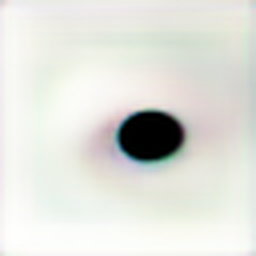

2017-08-26 15:18:17.570203: Step: 470, Generator: 0.051259
2017-08-26 15:18:19.225168: Step: 471, Generator: 0.058618
2017-08-26 15:18:23.316406: Step: 472, Generator: 0.053638
2017-08-26 15:18:27.549592: Step: 473, Generator: 0.054672
2017-08-26 15:18:31.786076: Step: 474, Generator: 0.059382
2017-08-26 15:18:35.987616: Step: 475, Generator: 0.050517
2017-08-26 15:18:40.087838: Step: 476, Generator: 0.056240
2017-08-26 15:18:44.241839: Step: 477, Generator: 0.054124
2017-08-26 15:18:48.485418: Step: 478, Generator: 0.049358
2017-08-26 15:18:50.139262: Step: 479, Generator: 0.052723


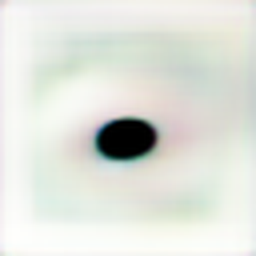

2017-08-26 15:18:55.894919: Step: 480, Generator: 0.053578
2017-08-26 15:19:00.052824: Step: 481, Generator: 0.058264
2017-08-26 15:19:04.351147: Step: 482, Generator: 0.054131
2017-08-26 15:19:08.571397: Step: 483, Generator: 0.050981
2017-08-26 15:19:12.806986: Step: 484, Generator: 0.054365
2017-08-26 15:19:17.043685: Step: 485, Generator: 0.048230
2017-08-26 15:19:21.183942: Step: 486, Generator: 0.050596
2017-08-26 15:19:22.852806: Step: 487, Generator: 0.056857
2017-08-26 15:19:27.119262: Step: 488, Generator: 0.060171
2017-08-26 15:19:31.383441: Step: 489, Generator: 0.046295


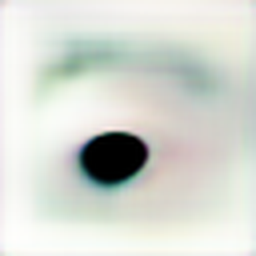

2017-08-26 15:19:37.121278: Step: 490, Generator: 0.047954
2017-08-26 15:19:41.195486: Step: 491, Generator: 0.050673
2017-08-26 15:19:45.352674: Step: 492, Generator: 0.058159
2017-08-26 15:19:49.583185: Step: 493, Generator: 0.053263
2017-08-26 15:19:53.798451: Step: 494, Generator: 0.056301
2017-08-26 15:19:55.472475: Step: 495, Generator: 0.054201
2017-08-26 15:19:59.708955: Step: 496, Generator: 0.047810
2017-08-26 15:20:03.989217: Step: 497, Generator: 0.050073
2017-08-26 15:20:08.223987: Step: 498, Generator: 0.054614
2017-08-26 15:20:12.435283: Step: 499, Generator: 0.055649


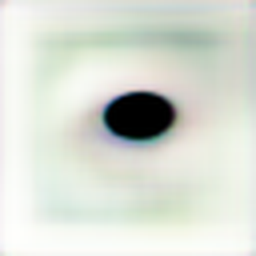

2017-08-26 15:20:18.192088: Step: 500, Generator: 0.054056
2017-08-26 15:20:22.335996: Step: 501, Generator: 0.053227
2017-08-26 15:20:26.621332: Step: 502, Generator: 0.050047
2017-08-26 15:20:28.272902: Step: 503, Generator: 0.057042
2017-08-26 15:20:32.507387: Step: 504, Generator: 0.055023
2017-08-26 15:20:36.723328: Step: 505, Generator: 0.047104
2017-08-26 15:20:40.948197: Step: 506, Generator: 0.052926
2017-08-26 15:20:45.177053: Step: 507, Generator: 0.053231
2017-08-26 15:20:49.407456: Step: 508, Generator: 0.052591
2017-08-26 15:20:53.616523: Step: 509, Generator: 0.052297


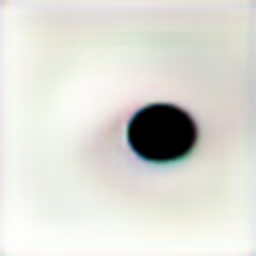

2017-08-26 15:20:59.409851: Step: 510, Generator: 0.052945
2017-08-26 15:21:01.088613: Step: 511, Generator: 0.050625
2017-08-26 15:21:05.367944: Step: 512, Generator: 0.055822
2017-08-26 15:21:09.603068: Step: 513, Generator: 0.050914
2017-08-26 15:21:13.822489: Step: 514, Generator: 0.051172
2017-08-26 15:21:18.030825: Step: 515, Generator: 0.051215
2017-08-26 15:21:22.159647: Step: 516, Generator: 0.049926
2017-08-26 15:21:26.356756: Step: 517, Generator: 0.050674
2017-08-26 15:21:30.590473: Step: 518, Generator: 0.052296
2017-08-26 15:21:32.247641: Step: 519, Generator: 0.049618


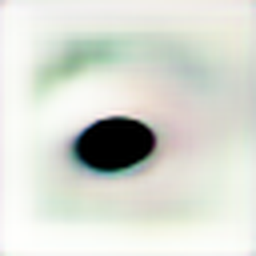

2017-08-26 15:21:38.008902: Step: 520, Generator: 0.056537
2017-08-26 15:21:42.230726: Step: 521, Generator: 0.051352
2017-08-26 15:21:46.451779: Step: 522, Generator: 0.054127
2017-08-26 15:21:50.660529: Step: 523, Generator: 0.057073
2017-08-26 15:21:54.891217: Step: 524, Generator: 0.057787
2017-08-26 15:21:59.108872: Step: 525, Generator: 0.051626
2017-08-26 15:22:03.345809: Step: 526, Generator: 0.051968
2017-08-26 15:22:05.032368: Step: 527, Generator: 0.059959
2017-08-26 15:22:09.285338: Step: 528, Generator: 0.053009
2017-08-26 15:22:13.524650: Step: 529, Generator: 0.051968


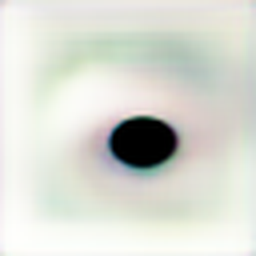

2017-08-26 15:22:19.281115: Step: 530, Generator: 0.054610
2017-08-26 15:22:23.397501: Step: 531, Generator: 0.046554
2017-08-26 15:22:27.614334: Step: 532, Generator: 0.048149
2017-08-26 15:22:31.818973: Step: 533, Generator: 0.052246
2017-08-26 15:22:36.057750: Step: 534, Generator: 0.049791
2017-08-26 15:22:37.717247: Step: 535, Generator: 0.048211
2017-08-26 15:22:41.932755: Step: 536, Generator: 0.051698
2017-08-26 15:22:46.063270: Step: 537, Generator: 0.049205
2017-08-26 15:22:50.242010: Step: 538, Generator: 0.054034
2017-08-26 15:22:54.458691: Step: 539, Generator: 0.050683


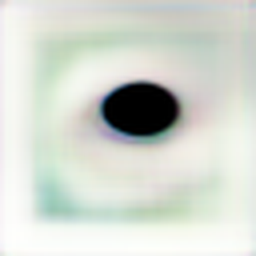

2017-08-26 15:23:00.312222: Step: 540, Generator: 0.052415
2017-08-26 15:23:04.600144: Step: 541, Generator: 0.048111
2017-08-26 15:23:08.686410: Step: 542, Generator: 0.051409
2017-08-26 15:23:10.308086: Step: 543, Generator: 0.055720
2017-08-26 15:23:14.532217: Step: 544, Generator: 0.051905
2017-08-26 15:23:18.748196: Step: 545, Generator: 0.045952
2017-08-26 15:23:22.974121: Step: 546, Generator: 0.047815
2017-08-26 15:23:27.114643: Step: 547, Generator: 0.051236
2017-08-26 15:23:31.275088: Step: 548, Generator: 0.057531
2017-08-26 15:23:35.483459: Step: 549, Generator: 0.047076


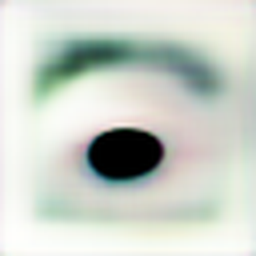

2017-08-26 15:23:41.264600: Step: 550, Generator: 0.053196
2017-08-26 15:23:42.888241: Step: 551, Generator: 0.056111
2017-08-26 15:23:47.004291: Step: 552, Generator: 0.049090
2017-08-26 15:23:51.216271: Step: 553, Generator: 0.050922
2017-08-26 15:23:55.461171: Step: 554, Generator: 0.047932
2017-08-26 15:23:59.577585: Step: 555, Generator: 0.056330
2017-08-26 15:24:03.781391: Step: 556, Generator: 0.048612
2017-08-26 15:24:07.989591: Step: 557, Generator: 0.053645
2017-08-26 15:24:12.231703: Step: 558, Generator: 0.053090
2017-08-26 15:24:13.883334: Step: 559, Generator: 0.052463


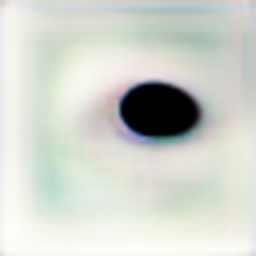

2017-08-26 15:24:19.642373: Step: 560, Generator: 0.047397
2017-08-26 15:24:23.701274: Step: 561, Generator: 0.047901
2017-08-26 15:24:27.883955: Step: 562, Generator: 0.055450
2017-08-26 15:24:32.105443: Step: 563, Generator: 0.049275
2017-08-26 15:24:36.327521: Step: 564, Generator: 0.043615
2017-08-26 15:24:40.538411: Step: 565, Generator: 0.054636
2017-08-26 15:24:44.637108: Step: 566, Generator: 0.054370
2017-08-26 15:24:46.253871: Step: 567, Generator: 0.047246
2017-08-26 15:24:50.492224: Step: 568, Generator: 0.049726
2017-08-26 15:24:54.729643: Step: 569, Generator: 0.052784


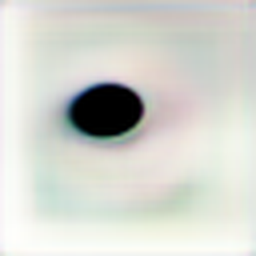

2017-08-26 15:25:00.553174: Step: 570, Generator: 0.052526
2017-08-26 15:25:04.684322: Step: 571, Generator: 0.049996
2017-08-26 15:25:08.918367: Step: 572, Generator: 0.047989
2017-08-26 15:25:13.129777: Step: 573, Generator: 0.053319
2017-08-26 15:25:17.282047: Step: 574, Generator: 0.048229
2017-08-26 15:25:18.921319: Step: 575, Generator: 0.048793
2017-08-26 15:25:23.154696: Step: 576, Generator: 0.051689
2017-08-26 15:25:27.391865: Step: 577, Generator: 0.047963
2017-08-26 15:25:31.497130: Step: 578, Generator: 0.051857
2017-08-26 15:25:35.663108: Step: 579, Generator: 0.046873


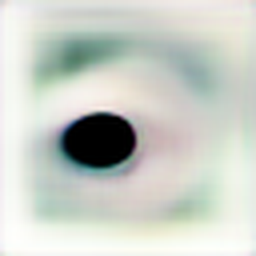

2017-08-26 15:25:41.442173: Step: 580, Generator: 0.054848
2017-08-26 15:25:45.505580: Step: 581, Generator: 0.049339
2017-08-26 15:25:49.715452: Step: 582, Generator: 0.046811
2017-08-26 15:25:51.354579: Step: 583, Generator: 0.043492
2017-08-26 15:25:55.501925: Step: 584, Generator: 0.051563
2017-08-26 15:25:59.647961: Step: 585, Generator: 0.050942
2017-08-26 15:26:03.924816: Step: 586, Generator: 0.047244
2017-08-26 15:26:08.144854: Step: 587, Generator: 0.053067
2017-08-26 15:26:12.277402: Step: 588, Generator: 0.051701
2017-08-26 15:26:16.424773: Step: 589, Generator: 0.047034


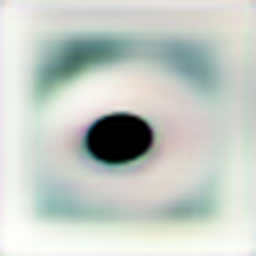

2017-08-26 15:26:22.204576: Step: 590, Generator: 0.048929
2017-08-26 15:26:23.878580: Step: 591, Generator: 0.044075
2017-08-26 15:26:27.971115: Step: 592, Generator: 0.049598
2017-08-26 15:26:32.126782: Step: 593, Generator: 0.048375
2017-08-26 15:26:36.362110: Step: 594, Generator: 0.050251
2017-08-26 15:26:40.595199: Step: 595, Generator: 0.049168
2017-08-26 15:26:44.691989: Step: 596, Generator: 0.052759
2017-08-26 15:26:48.897961: Step: 597, Generator: 0.049748
2017-08-26 15:26:53.105634: Step: 598, Generator: 0.051238
2017-08-26 15:26:54.771631: Step: 599, Generator: 0.044393


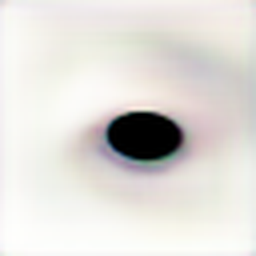

2017-08-26 15:27:00.464018: Step: 600, Generator: 0.052250
2017-08-26 15:27:04.732266: Step: 601, Generator: 0.050592
2017-08-26 15:27:08.962568: Step: 602, Generator: 0.050560
2017-08-26 15:27:13.074695: Step: 603, Generator: 0.049507
2017-08-26 15:27:17.227069: Step: 604, Generator: 0.048049
2017-08-26 15:27:21.464798: Step: 605, Generator: 0.048857
2017-08-26 15:27:25.695128: Step: 606, Generator: 0.049744
2017-08-26 15:27:27.351127: Step: 607, Generator: 0.062864
2017-08-26 15:27:31.498176: Step: 608, Generator: 0.049509
2017-08-26 15:27:35.656290: Step: 609, Generator: 0.047271


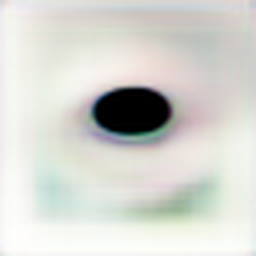

2017-08-26 15:27:41.398947: Step: 610, Generator: 0.047744
2017-08-26 15:27:45.629679: Step: 611, Generator: 0.055427
2017-08-26 15:27:49.716801: Step: 612, Generator: 0.050534
2017-08-26 15:27:53.859213: Step: 613, Generator: 0.050117
2017-08-26 15:27:58.109550: Step: 614, Generator: 0.044018
2017-08-26 15:27:59.765717: Step: 615, Generator: 0.052024
2017-08-26 15:28:04.031984: Step: 616, Generator: 0.050196
2017-08-26 15:28:08.246658: Step: 617, Generator: 0.052009
2017-08-26 15:28:12.320529: Step: 618, Generator: 0.051000
2017-08-26 15:28:16.565852: Step: 619, Generator: 0.043206


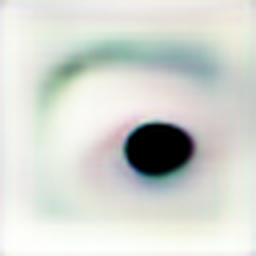

2017-08-26 15:28:22.349071: Step: 620, Generator: 0.046401
2017-08-26 15:28:26.442157: Step: 621, Generator: 0.047530
2017-08-26 15:28:30.591710: Step: 622, Generator: 0.047566
2017-08-26 15:28:32.258257: Step: 623, Generator: 0.047959
2017-08-26 15:28:36.465770: Step: 624, Generator: 0.048412
2017-08-26 15:28:40.721289: Step: 625, Generator: 0.046820
2017-08-26 15:28:44.821293: Step: 626, Generator: 0.049518
2017-08-26 15:28:48.972313: Step: 627, Generator: 0.050473
2017-08-26 15:28:53.193705: Step: 628, Generator: 0.046113
2017-08-26 15:28:57.439027: Step: 629, Generator: 0.047286


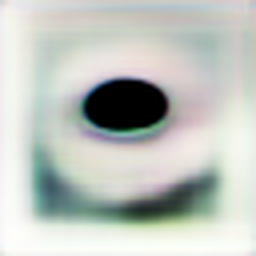

2017-08-26 15:29:03.322103: Step: 630, Generator: 0.048928
2017-08-26 15:29:04.998697: Step: 631, Generator: 0.039765
2017-08-26 15:29:09.211360: Step: 632, Generator: 0.052998
2017-08-26 15:29:13.326712: Step: 633, Generator: 0.048554
2017-08-26 15:29:17.550754: Step: 634, Generator: 0.047198
2017-08-26 15:29:21.776119: Step: 635, Generator: 0.045239
2017-08-26 15:29:26.019512: Step: 636, Generator: 0.042889
2017-08-26 15:29:30.170026: Step: 637, Generator: 0.048955
2017-08-26 15:29:34.357186: Step: 638, Generator: 0.047591
2017-08-26 15:29:36.014948: Step: 639, Generator: 0.052460


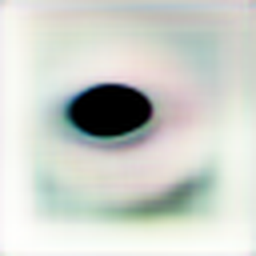

2017-08-26 15:29:41.738742: Step: 640, Generator: 0.049194
2017-08-26 15:29:45.912563: Step: 641, Generator: 0.047614
2017-08-26 15:29:50.022708: Step: 642, Generator: 0.049385
2017-08-26 15:29:54.259053: Step: 643, Generator: 0.047346
2017-08-26 15:29:58.492099: Step: 644, Generator: 0.046563
2017-08-26 15:30:02.634394: Step: 645, Generator: 0.042566
2017-08-26 15:30:06.845713: Step: 646, Generator: 0.044982
2017-08-26 15:30:08.502816: Step: 647, Generator: 0.045842
2017-08-26 15:30:12.727588: Step: 648, Generator: 0.052734
2017-08-26 15:30:16.964120: Step: 649, Generator: 0.049255


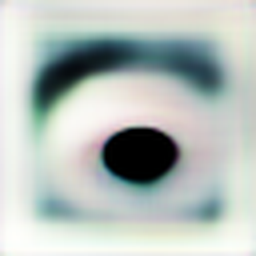

2017-08-26 15:30:22.615715: Step: 650, Generator: 0.048321
2017-08-26 15:30:26.844486: Step: 651, Generator: 0.049778
2017-08-26 15:30:31.060324: Step: 652, Generator: 0.043631
2017-08-26 15:30:35.176137: Step: 653, Generator: 0.045188
2017-08-26 15:30:39.398578: Step: 654, Generator: 0.046773
2017-08-26 15:30:41.052148: Step: 655, Generator: 0.046845
2017-08-26 15:30:45.274808: Step: 656, Generator: 0.049133
2017-08-26 15:30:49.489068: Step: 657, Generator: 0.045816
2017-08-26 15:30:53.587352: Step: 658, Generator: 0.042003
2017-08-26 15:30:57.904953: Step: 659, Generator: 0.047657


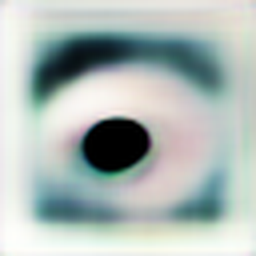

2017-08-26 15:31:03.837509: Step: 660, Generator: 0.045885
2017-08-26 15:31:08.054246: Step: 661, Generator: 0.048338
2017-08-26 15:31:12.209909: Step: 662, Generator: 0.045935
2017-08-26 15:31:13.815790: Step: 663, Generator: 0.047770
2017-08-26 15:31:18.060860: Step: 664, Generator: 0.047273
2017-08-26 15:31:22.272222: Step: 665, Generator: 0.049037
2017-08-26 15:31:26.515055: Step: 666, Generator: 0.048001
2017-08-26 15:31:30.647100: Step: 667, Generator: 0.047551
2017-08-26 15:31:34.809389: Step: 668, Generator: 0.043832
2017-08-26 15:31:39.011842: Step: 669, Generator: 0.044963


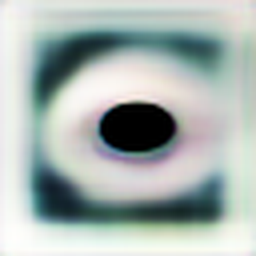

2017-08-26 15:31:44.790924: Step: 670, Generator: 0.044275
2017-08-26 15:31:46.458641: Step: 671, Generator: 0.039036
2017-08-26 15:31:50.580003: Step: 672, Generator: 0.047732
2017-08-26 15:31:54.818912: Step: 673, Generator: 0.045193
2017-08-26 15:31:59.042861: Step: 674, Generator: 0.044636
2017-08-26 15:32:03.302166: Step: 675, Generator: 0.046686
2017-08-26 15:32:07.520812: Step: 676, Generator: 0.050362
2017-08-26 15:32:11.586685: Step: 677, Generator: 0.049302
2017-08-26 15:32:15.821557: Step: 678, Generator: 0.045835
2017-08-26 15:32:17.484949: Step: 679, Generator: 0.050223


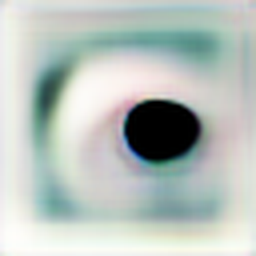

2017-08-26 15:32:23.270250: Step: 680, Generator: 0.045803
2017-08-26 15:32:27.372442: Step: 681, Generator: 0.045011
2017-08-26 15:32:31.504999: Step: 682, Generator: 0.051625
2017-08-26 15:32:35.754819: Step: 683, Generator: 0.048885
2017-08-26 15:32:39.954313: Step: 684, Generator: 0.048259
2017-08-26 15:32:44.053505: Step: 685, Generator: 0.049105
2017-08-26 15:32:48.193470: Step: 686, Generator: 0.045919
2017-08-26 15:32:49.858279: Step: 687, Generator: 0.047470
2017-08-26 15:32:54.079670: Step: 688, Generator: 0.047124
2017-08-26 15:32:58.307793: Step: 689, Generator: 0.049623


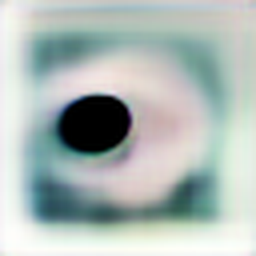

2017-08-26 15:33:04.106309: Step: 690, Generator: 0.045364
2017-08-26 15:33:08.337336: Step: 691, Generator: 0.044269
2017-08-26 15:33:12.472780: Step: 692, Generator: 0.044230
2017-08-26 15:33:16.585274: Step: 693, Generator: 0.052373
2017-08-26 15:33:20.833083: Step: 694, Generator: 0.045446
2017-08-26 15:33:22.481392: Step: 695, Generator: 0.044189
2017-08-26 15:33:26.713357: Step: 696, Generator: 0.052423
2017-08-26 15:33:30.802736: Step: 697, Generator: 0.042358
2017-08-26 15:33:34.930673: Step: 698, Generator: 0.041848
2017-08-26 15:33:39.168363: Step: 699, Generator: 0.040070


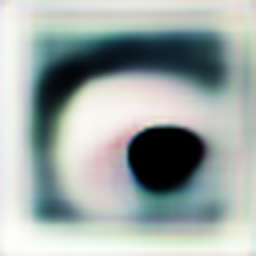

2017-08-26 15:33:44.938516: Step: 700, Generator: 0.046650
2017-08-26 15:33:49.007723: Step: 701, Generator: 0.043858
2017-08-26 15:33:53.128577: Step: 702, Generator: 0.045398
2017-08-26 15:33:54.797920: Step: 703, Generator: 0.045285
2017-08-26 15:33:59.020079: Step: 704, Generator: 0.046789
2017-08-26 15:34:03.260213: Step: 705, Generator: 0.048714
2017-08-26 15:34:07.376355: Step: 706, Generator: 0.040526
2017-08-26 15:34:11.530832: Step: 707, Generator: 0.048532
2017-08-26 15:34:15.762526: Step: 708, Generator: 0.040525
2017-08-26 15:34:19.991106: Step: 709, Generator: 0.046673


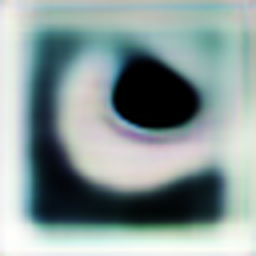

2017-08-26 15:34:25.792587: Step: 710, Generator: 0.045463
2017-08-26 15:34:27.401653: Step: 711, Generator: 0.045261
2017-08-26 15:34:31.491371: Step: 712, Generator: 0.047286
2017-08-26 15:34:35.724071: Step: 713, Generator: 0.042717
2017-08-26 15:34:39.938040: Step: 714, Generator: 0.043314
2017-08-26 15:34:44.142765: Step: 715, Generator: 0.048850
2017-08-26 15:34:48.373654: Step: 716, Generator: 0.047784
2017-08-26 15:34:52.469860: Step: 717, Generator: 0.047192
2017-08-26 15:34:56.628329: Step: 718, Generator: 0.045362
2017-08-26 15:34:58.292577: Step: 719, Generator: 0.042203


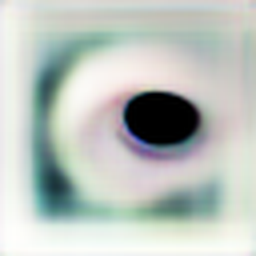

2017-08-26 15:35:04.204076: Step: 720, Generator: 0.046494
2017-08-26 15:35:08.422555: Step: 721, Generator: 0.044091
2017-08-26 15:35:12.524483: Step: 722, Generator: 0.042068
2017-08-26 15:35:16.707920: Step: 723, Generator: 0.047010
2017-08-26 15:35:20.948391: Step: 724, Generator: 0.049258
2017-08-26 15:35:25.193200: Step: 725, Generator: 0.045506
2017-08-26 15:35:29.430446: Step: 726, Generator: 0.047283
2017-08-26 15:35:31.091301: Step: 727, Generator: 0.040888
2017-08-26 15:35:35.566393: Step: 728, Generator: 0.044742
2017-08-26 15:35:40.471252: Step: 729, Generator: 0.045066


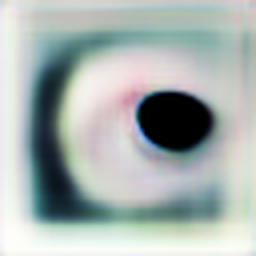

2017-08-26 15:35:47.818527: Step: 730, Generator: 0.045296
2017-08-26 15:35:52.128916: Step: 731, Generator: 0.043995
2017-08-26 15:35:56.359345: Step: 732, Generator: 0.042357
2017-08-26 15:36:00.583207: Step: 733, Generator: 0.044869
2017-08-26 15:36:04.807867: Step: 734, Generator: 0.046561
2017-08-26 15:36:06.466291: Step: 735, Generator: 0.050620
2017-08-26 15:36:10.616505: Step: 736, Generator: 0.049391
2017-08-26 15:36:14.837283: Step: 737, Generator: 0.047500
2017-08-26 15:36:19.043169: Step: 738, Generator: 0.045306
2017-08-26 15:36:23.249843: Step: 739, Generator: 0.042029


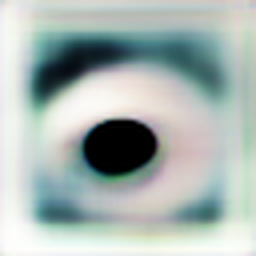

2017-08-26 15:36:28.931739: Step: 740, Generator: 0.046888
2017-08-26 15:36:33.151415: Step: 741, Generator: 0.044582
2017-08-26 15:36:37.281544: Step: 742, Generator: 0.047364
2017-08-26 15:36:38.900775: Step: 743, Generator: 0.045060
2017-08-26 15:36:43.103099: Step: 744, Generator: 0.046384
2017-08-26 15:36:47.329300: Step: 745, Generator: 0.040166
2017-08-26 15:36:51.411665: Step: 746, Generator: 0.050783
2017-08-26 15:36:55.552135: Step: 747, Generator: 0.046838
2017-08-26 15:36:59.851081: Step: 748, Generator: 0.044612
2017-08-26 15:37:04.120410: Step: 749, Generator: 0.044029


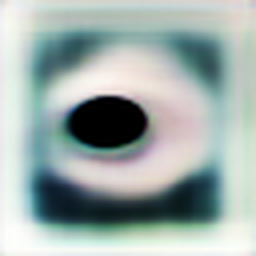

2017-08-26 15:37:09.721471: Step: 750, Generator: 0.043422
2017-08-26 15:37:11.320301: Step: 751, Generator: 0.041961
2017-08-26 15:37:15.570765: Step: 752, Generator: 0.044101
2017-08-26 15:37:19.723284: Step: 753, Generator: 0.045116
2017-08-26 15:37:23.855953: Step: 754, Generator: 0.043399
2017-08-26 15:37:28.094974: Step: 755, Generator: 0.045328
2017-08-26 15:37:32.245637: Step: 756, Generator: 0.045922
2017-08-26 15:37:36.345435: Step: 757, Generator: 0.041539
2017-08-26 15:37:40.548555: Step: 758, Generator: 0.041241
2017-08-26 15:37:42.213733: Step: 759, Generator: 0.043257


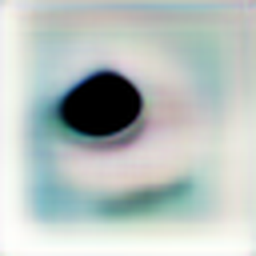

2017-08-26 15:37:47.807412: Step: 760, Generator: 0.041784
2017-08-26 15:37:51.968072: Step: 761, Generator: 0.046422
2017-08-26 15:37:56.199662: Step: 762, Generator: 0.041136
2017-08-26 15:38:00.312713: Step: 763, Generator: 0.046359
2017-08-26 15:38:04.475922: Step: 764, Generator: 0.043216
2017-08-26 15:38:08.678606: Step: 765, Generator: 0.047563
2017-08-26 15:38:12.906058: Step: 766, Generator: 0.043363
2017-08-26 15:38:14.520178: Step: 767, Generator: 0.045601
2017-08-26 15:38:18.625028: Step: 768, Generator: 0.046011
2017-08-26 15:38:22.776630: Step: 769, Generator: 0.040460


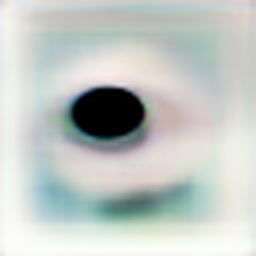

2017-08-26 15:38:28.540794: Step: 770, Generator: 0.042057
2017-08-26 15:38:32.652954: Step: 771, Generator: 0.043525
2017-08-26 15:38:36.781082: Step: 772, Generator: 0.044988
2017-08-26 15:38:41.035413: Step: 773, Generator: 0.043177
2017-08-26 15:38:45.259802: Step: 774, Generator: 0.041708
2017-08-26 15:38:46.915436: Step: 775, Generator: 0.047412
2017-08-26 15:38:50.998747: Step: 776, Generator: 0.044582
2017-08-26 15:38:55.227498: Step: 777, Generator: 0.042631
2017-08-26 15:38:59.487277: Step: 778, Generator: 0.046090
2017-08-26 15:39:03.796520: Step: 779, Generator: 0.040743


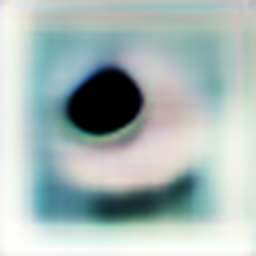

2017-08-26 15:39:09.576193: Step: 780, Generator: 0.038705
2017-08-26 15:39:13.833377: Step: 781, Generator: 0.043653
2017-08-26 15:39:18.102236: Step: 782, Generator: 0.040650
2017-08-26 15:39:19.763704: Step: 783, Generator: 0.041231
2017-08-26 15:39:23.860037: Step: 784, Generator: 0.047523
2017-08-26 15:39:28.101032: Step: 785, Generator: 0.043572
2017-08-26 15:39:32.324417: Step: 786, Generator: 0.043943
2017-08-26 15:39:36.566490: Step: 787, Generator: 0.049770
2017-08-26 15:39:40.680063: Step: 788, Generator: 0.043992
2017-08-26 15:39:44.840422: Step: 789, Generator: 0.045100


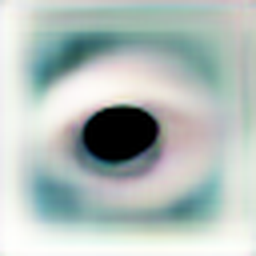

2017-08-26 15:39:50.616243: Step: 790, Generator: 0.045941
2017-08-26 15:39:52.282320: Step: 791, Generator: 0.046655
2017-08-26 15:39:56.528561: Step: 792, Generator: 0.043708
2017-08-26 15:40:00.616290: Step: 793, Generator: 0.039697
2017-08-26 15:40:04.894557: Step: 794, Generator: 0.041404
2017-08-26 15:40:09.102184: Step: 795, Generator: 0.042540
2017-08-26 15:40:13.342048: Step: 796, Generator: 0.042377
2017-08-26 15:40:17.457709: Step: 797, Generator: 0.041750
2017-08-26 15:40:21.688256: Step: 798, Generator: 0.043596
2017-08-26 15:40:23.325197: Step: 799, Generator: 0.044685


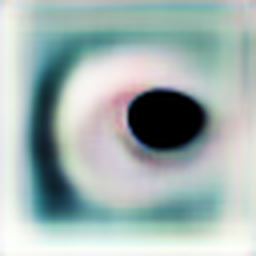

2017-08-26 15:40:29.081666: Step: 800, Generator: 0.042856
2017-08-26 15:40:33.163814: Step: 801, Generator: 0.041585
2017-08-26 15:40:37.305735: Step: 802, Generator: 0.046451
2017-08-26 15:40:41.533456: Step: 803, Generator: 0.043602
2017-08-26 15:40:45.750788: Step: 804, Generator: 0.041940
2017-08-26 15:40:49.847879: Step: 805, Generator: 0.040442
2017-08-26 15:40:54.084077: Step: 806, Generator: 0.043946
2017-08-26 15:40:55.752872: Step: 807, Generator: 0.037847
2017-08-26 15:40:59.965027: Step: 808, Generator: 0.041189
2017-08-26 15:41:04.239463: Step: 809, Generator: 0.045306


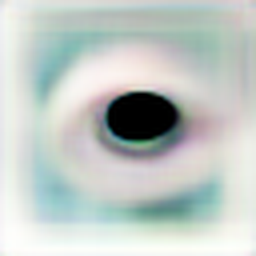

2017-08-26 15:41:10.046745: Step: 810, Generator: 0.040184
2017-08-26 15:41:14.126795: Step: 811, Generator: 0.042461
2017-08-26 15:41:18.346158: Step: 812, Generator: 0.041702
2017-08-26 15:41:22.585985: Step: 813, Generator: 0.042261
2017-08-26 15:41:26.721994: Step: 814, Generator: 0.050526
2017-08-26 15:41:28.333258: Step: 815, Generator: 0.040598
2017-08-26 15:41:32.583953: Step: 816, Generator: 0.045353
2017-08-26 15:41:36.792555: Step: 817, Generator: 0.041556
2017-08-26 15:41:41.021556: Step: 818, Generator: 0.045243
2017-08-26 15:41:45.113234: Step: 819, Generator: 0.043024


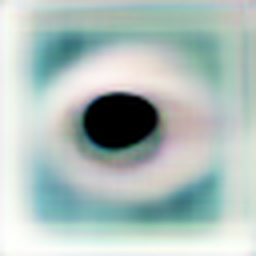

2017-08-26 15:41:50.911516: Step: 820, Generator: 0.039927
2017-08-26 15:41:55.127653: Step: 821, Generator: 0.046280
2017-08-26 15:41:59.240796: Step: 822, Generator: 0.040837
2017-08-26 15:42:00.867058: Step: 823, Generator: 0.042403
2017-08-26 15:42:05.135181: Step: 824, Generator: 0.041101
2017-08-26 15:42:09.359047: Step: 825, Generator: 0.043790
2017-08-26 15:42:13.505460: Step: 826, Generator: 0.044844
2017-08-26 15:42:17.647375: Step: 827, Generator: 0.042340
2017-08-26 15:42:21.877269: Step: 828, Generator: 0.041008
2017-08-26 15:42:26.098603: Step: 829, Generator: 0.042194


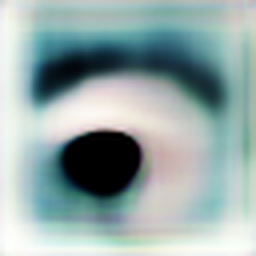

2017-08-26 15:42:31.913204: Step: 830, Generator: 0.041338
2017-08-26 15:42:33.516534: Step: 831, Generator: 0.039086
2017-08-26 15:42:37.628288: Step: 832, Generator: 0.043530
2017-08-26 15:42:41.839355: Step: 833, Generator: 0.039908
2017-08-26 15:42:46.058133: Step: 834, Generator: 0.043289
2017-08-26 15:42:50.301743: Step: 835, Generator: 0.042003
2017-08-26 15:42:54.536441: Step: 836, Generator: 0.045910
2017-08-26 15:42:58.742171: Step: 837, Generator: 0.037188
2017-08-26 15:43:03.010602: Step: 838, Generator: 0.040586
2017-08-26 15:43:04.701338: Step: 839, Generator: 0.043999


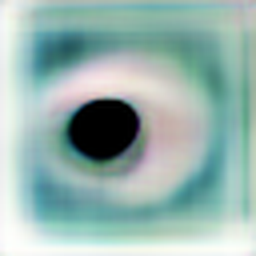

2017-08-26 15:43:10.455930: Step: 840, Generator: 0.041744
2017-08-26 15:43:14.685992: Step: 841, Generator: 0.043789
2017-08-26 15:43:18.931216: Step: 842, Generator: 0.039475
2017-08-26 15:43:23.038249: Step: 843, Generator: 0.043614
2017-08-26 15:43:27.324051: Step: 844, Generator: 0.041017
2017-08-26 15:43:31.562313: Step: 845, Generator: 0.041323
2017-08-26 15:43:35.781434: Step: 846, Generator: 0.040231
2017-08-26 15:43:37.433681: Step: 847, Generator: 0.045947
2017-08-26 15:43:41.703997: Step: 848, Generator: 0.041753
2017-08-26 15:43:45.793753: Step: 849, Generator: 0.040645


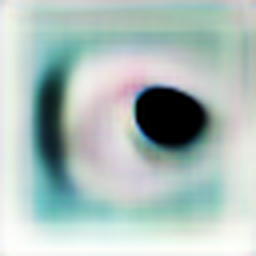

2017-08-26 15:43:51.613135: Step: 850, Generator: 0.039058
2017-08-26 15:43:55.914139: Step: 851, Generator: 0.042461
2017-08-26 15:44:00.065237: Step: 852, Generator: 0.042227
2017-08-26 15:44:04.357314: Step: 853, Generator: 0.045232
2017-08-26 15:44:08.573614: Step: 854, Generator: 0.044372
2017-08-26 15:44:10.242758: Step: 855, Generator: 0.042722
2017-08-26 15:44:14.352223: Step: 856, Generator: 0.040719
2017-08-26 15:44:18.483731: Step: 857, Generator: 0.038949
2017-08-26 15:44:22.710435: Step: 858, Generator: 0.040365
2017-08-26 15:44:26.970673: Step: 859, Generator: 0.041533


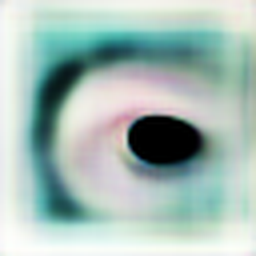

2017-08-26 15:44:32.766145: Step: 860, Generator: 0.038817
2017-08-26 15:44:36.880145: Step: 861, Generator: 0.041920
2017-08-26 15:44:41.032938: Step: 862, Generator: 0.041670
2017-08-26 15:44:42.683986: Step: 863, Generator: 0.041670
2017-08-26 15:44:46.922728: Step: 864, Generator: 0.047553
2017-08-26 15:44:51.170134: Step: 865, Generator: 0.036429
2017-08-26 15:44:55.316127: Step: 866, Generator: 0.047340
2017-08-26 15:44:59.546411: Step: 867, Generator: 0.040386
2017-08-26 15:45:03.823875: Step: 868, Generator: 0.041767
2017-08-26 15:45:08.081709: Step: 869, Generator: 0.039075


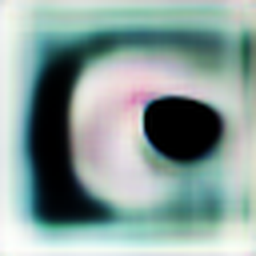

2017-08-26 15:45:13.870021: Step: 870, Generator: 0.038036
2017-08-26 15:45:15.524081: Step: 871, Generator: 0.041346
2017-08-26 15:45:19.613731: Step: 872, Generator: 0.047815
2017-08-26 15:45:23.820657: Step: 873, Generator: 0.039352
2017-08-26 15:45:28.055397: Step: 874, Generator: 0.040750
2017-08-26 15:45:32.283784: Step: 875, Generator: 0.039183
2017-08-26 15:45:36.416343: Step: 876, Generator: 0.041678
2017-08-26 15:45:40.629538: Step: 877, Generator: 0.042968
2017-08-26 15:45:44.883881: Step: 878, Generator: 0.039287
2017-08-26 15:45:46.558764: Step: 879, Generator: 0.036593


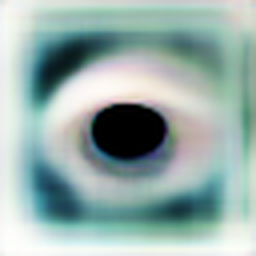

2017-08-26 15:45:52.349249: Step: 880, Generator: 0.041067
2017-08-26 15:45:56.635033: Step: 881, Generator: 0.041116
2017-08-26 15:46:00.732210: Step: 882, Generator: 0.042178
2017-08-26 15:46:04.982511: Step: 883, Generator: 0.040166
2017-08-26 15:46:09.222631: Step: 884, Generator: 0.041271
2017-08-26 15:46:13.480052: Step: 885, Generator: 0.040607
2017-08-26 15:46:17.714380: Step: 886, Generator: 0.041959
2017-08-26 15:46:19.386186: Step: 887, Generator: 0.040562
2017-08-26 15:46:23.598799: Step: 888, Generator: 0.038695
2017-08-26 15:46:27.710781: Step: 889, Generator: 0.038550


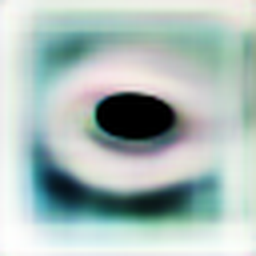

2017-08-26 15:46:33.505628: Step: 890, Generator: 0.041383
2017-08-26 15:46:37.726846: Step: 891, Generator: 0.039887
2017-08-26 15:46:41.826495: Step: 892, Generator: 0.042026
2017-08-26 15:46:45.990992: Step: 893, Generator: 0.041519
2017-08-26 15:46:50.227207: Step: 894, Generator: 0.039044
2017-08-26 15:46:51.897559: Step: 895, Generator: 0.045050
2017-08-26 15:46:56.148872: Step: 896, Generator: 0.040336
2017-08-26 15:47:00.495639: Step: 897, Generator: 0.038467
2017-08-26 15:47:04.769949: Step: 898, Generator: 0.040175
2017-08-26 15:47:08.999184: Step: 899, Generator: 0.039169


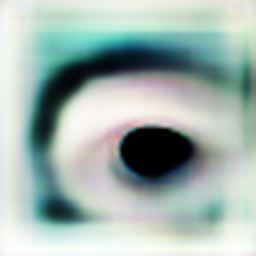

2017-08-26 15:47:14.795099: Step: 900, Generator: 0.041160
2017-08-26 15:47:18.909148: Step: 901, Generator: 0.037454
2017-08-26 15:47:23.090953: Step: 902, Generator: 0.044159
2017-08-26 15:47:24.762628: Step: 903, Generator: 0.043451
2017-08-26 15:47:28.988690: Step: 904, Generator: 0.040834
2017-08-26 15:47:33.220007: Step: 905, Generator: 0.040857
2017-08-26 15:47:37.436033: Step: 906, Generator: 0.042482
2017-08-26 15:47:41.638206: Step: 907, Generator: 0.039929
2017-08-26 15:47:45.894250: Step: 908, Generator: 0.037466
2017-08-26 15:47:50.133955: Step: 909, Generator: 0.038917


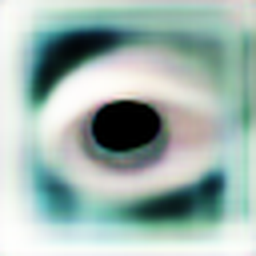

2017-08-26 15:47:55.854582: Step: 910, Generator: 0.039033
2017-08-26 15:47:57.515668: Step: 911, Generator: 0.039325
2017-08-26 15:48:01.768548: Step: 912, Generator: 0.044368
2017-08-26 15:48:06.011051: Step: 913, Generator: 0.038689
2017-08-26 15:48:10.138164: Step: 914, Generator: 0.040191
2017-08-26 15:48:14.325678: Step: 915, Generator: 0.039458
2017-08-26 15:48:18.541230: Step: 916, Generator: 0.037038
2017-08-26 15:48:22.773570: Step: 917, Generator: 0.042492
2017-08-26 15:48:27.015810: Step: 918, Generator: 0.039030
2017-08-26 15:48:28.672273: Step: 919, Generator: 0.038736


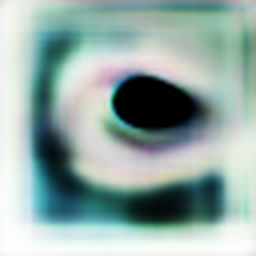

2017-08-26 15:48:34.444330: Step: 920, Generator: 0.042391
2017-08-26 15:48:38.502783: Step: 921, Generator: 0.042557
2017-08-26 15:48:42.684675: Step: 922, Generator: 0.037804
2017-08-26 15:48:46.921210: Step: 923, Generator: 0.036678
2017-08-26 15:48:51.138315: Step: 924, Generator: 0.040711
2017-08-26 15:48:55.368814: Step: 925, Generator: 0.037150
2017-08-26 15:48:59.547708: Step: 926, Generator: 0.039498
2017-08-26 15:49:01.241812: Step: 927, Generator: 0.041455
2017-08-26 15:49:05.500860: Step: 928, Generator: 0.040602
2017-08-26 15:49:09.719411: Step: 929, Generator: 0.037672


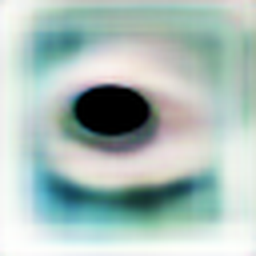

2017-08-26 15:49:15.512985: Step: 930, Generator: 0.040296
2017-08-26 15:49:19.723801: Step: 931, Generator: 0.036891
2017-08-26 15:49:23.806025: Step: 932, Generator: 0.038253
2017-08-26 15:49:28.035211: Step: 933, Generator: 0.038964
2017-08-26 15:49:32.244810: Step: 934, Generator: 0.036296
2017-08-26 15:49:33.895531: Step: 935, Generator: 0.040930
2017-08-26 15:49:37.987088: Step: 936, Generator: 0.043046
2017-08-26 15:49:42.274014: Step: 937, Generator: 0.040161
2017-08-26 15:49:46.505566: Step: 938, Generator: 0.041318
2017-08-26 15:49:50.625384: Step: 939, Generator: 0.037834


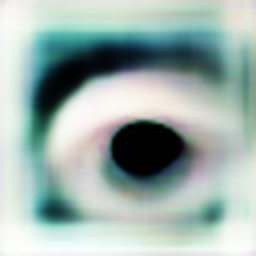

2017-08-26 15:49:56.354649: Step: 940, Generator: 0.036430
2017-08-26 15:50:00.572800: Step: 941, Generator: 0.039208
2017-08-26 15:50:04.735775: Step: 942, Generator: 0.038706
2017-08-26 15:50:06.356355: Step: 943, Generator: 0.039383
2017-08-26 15:50:10.567480: Step: 944, Generator: 0.038486
2017-08-26 15:50:14.789561: Step: 945, Generator: 0.036382
2017-08-26 15:50:18.846831: Step: 946, Generator: 0.039022
2017-08-26 15:50:23.007515: Step: 947, Generator: 0.038697
2017-08-26 15:50:27.245747: Step: 948, Generator: 0.040549
2017-08-26 15:50:31.469010: Step: 949, Generator: 0.041425


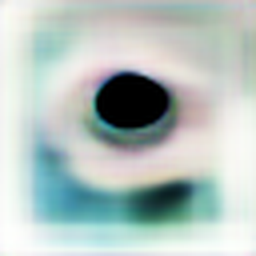

2017-08-26 15:50:37.231428: Step: 950, Generator: 0.038640
2017-08-26 15:50:38.835429: Step: 951, Generator: 0.039219
2017-08-26 15:50:42.924586: Step: 952, Generator: 0.038098
2017-08-26 15:50:47.144497: Step: 953, Generator: 0.040262
2017-08-26 15:50:51.378475: Step: 954, Generator: 0.039329
2017-08-26 15:50:55.505425: Step: 955, Generator: 0.038257
2017-08-26 15:50:59.787827: Step: 956, Generator: 0.039066
2017-08-26 15:51:04.078227: Step: 957, Generator: 0.038049
2017-08-26 15:51:08.296134: Step: 958, Generator: 0.038845
2017-08-26 15:51:09.977673: Step: 959, Generator: 0.041219


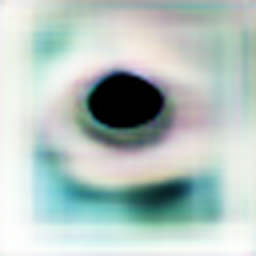

2017-08-26 15:51:15.772185: Step: 960, Generator: 0.042415
2017-08-26 15:51:19.849222: Step: 961, Generator: 0.042122
2017-08-26 15:51:24.091406: Step: 962, Generator: 0.042545
2017-08-26 15:51:28.328104: Step: 963, Generator: 0.038259
2017-08-26 15:51:32.559862: Step: 964, Generator: 0.038880
2017-08-26 15:51:36.779696: Step: 965, Generator: 0.037011
2017-08-26 15:51:40.899268: Step: 966, Generator: 0.037403
2017-08-26 15:51:42.548132: Step: 967, Generator: 0.039906
2017-08-26 15:51:46.762873: Step: 968, Generator: 0.042982
2017-08-26 15:51:50.971783: Step: 969, Generator: 0.035267


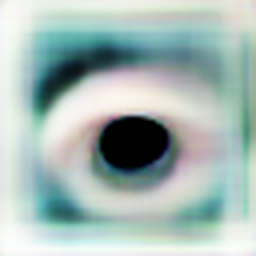

2017-08-26 15:51:56.769071: Step: 970, Generator: 0.039615
2017-08-26 15:52:00.865477: Step: 971, Generator: 0.040003
2017-08-26 15:52:05.147217: Step: 972, Generator: 0.038884
2017-08-26 15:52:09.378402: Step: 973, Generator: 0.039809
2017-08-26 15:52:13.577796: Step: 974, Generator: 0.040659
2017-08-26 15:52:15.225095: Step: 975, Generator: 0.030544
2017-08-26 15:52:19.457339: Step: 976, Generator: 0.037769
2017-08-26 15:52:23.683645: Step: 977, Generator: 0.038406
2017-08-26 15:52:27.807020: Step: 978, Generator: 0.038514
2017-08-26 15:52:32.151989: Step: 979, Generator: 0.040890


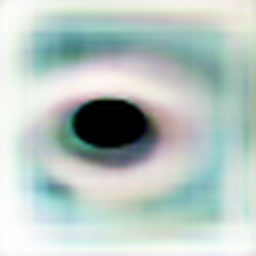

2017-08-26 15:52:37.929594: Step: 980, Generator: 0.040191
2017-08-26 15:52:42.195556: Step: 981, Generator: 0.037806
2017-08-26 15:52:46.301037: Step: 982, Generator: 0.037705
2017-08-26 15:52:47.927847: Step: 983, Generator: 0.037300
2017-08-26 15:52:52.160406: Step: 984, Generator: 0.037358
2017-08-26 15:52:56.394100: Step: 985, Generator: 0.040314
2017-08-26 15:53:00.754277: Step: 986, Generator: 0.036817
2017-08-26 15:53:05.033276: Step: 987, Generator: 0.040906
2017-08-26 15:53:09.240519: Step: 988, Generator: 0.037126
2017-08-26 15:53:13.352695: Step: 989, Generator: 0.037924


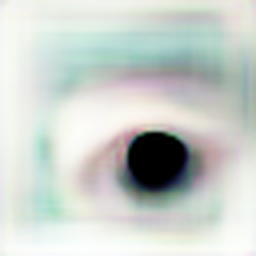

2017-08-26 15:53:19.077067: Step: 990, Generator: 0.038142
2017-08-26 15:53:20.737459: Step: 991, Generator: 0.038687
2017-08-26 15:53:24.977076: Step: 992, Generator: 0.036453
2017-08-26 15:53:29.212813: Step: 993, Generator: 0.038203
2017-08-26 15:53:33.285652: Step: 994, Generator: 0.039582
2017-08-26 15:53:37.499601: Step: 995, Generator: 0.040050
2017-08-26 15:53:41.716657: Step: 996, Generator: 0.037583
2017-08-26 15:53:45.971838: Step: 997, Generator: 0.036138
2017-08-26 15:53:50.094541: Step: 998, Generator: 0.038727
2017-08-26 15:53:51.762518: Step: 999, Generator: 0.037734


In [4]:
# from simple gan
def get_descriminator():
    m = Sequential()
    m.add(Conv2D(32,3, input_shape=(64,64,3,), activation = LeakyReLU(), padding='same'))
    m.add(MaxPooling2D(2,2))
    m.add(Dropout(0.5))
    m.add(Conv2D(32,3, activation = LeakyReLU(), padding='same'))
    m.add(MaxPooling2D(2,2))
    m.add(Dropout(0.5))
    m.add(Conv2D(64,3, activation = LeakyReLU(), padding='same'))
    m.add(MaxPooling2D(2,2))
    m.add(Dropout(0.5))
    m.add(Flatten())
    m.add(Dense(1, activation = 'sigmoid'))
    return m

generator = compile_generator(get_generator())

fit_generator(generator, 1000)


/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/site-packages/keras/activations.py:103: UserWarning: Do not pass a layer instance (such as LeakyReLU) as the activation argument of another layer. Instead, advanced activation layers should be used just like any other layer in a model.
  ).format(identifier=identifier.__class__.__name__))


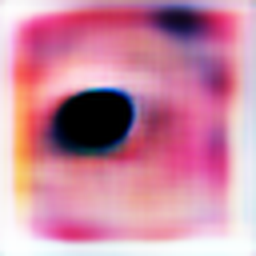

2017-08-26 16:25:25.844650: Step: 0, Descriminator: 0.695066, Generator: 1.158543, Pass Through: 0.206129
2017-08-26 16:25:37.908296: Step: 1, Descriminator: 0.636794, Generator: 1.801197, Pass Through: 0.239176
2017-08-26 16:25:50.154663: Step: 2, Descriminator: 0.653622, Generator: 0.340228, Pass Through: 0.202583
2017-08-26 16:25:55.051734: Step: 3, Descriminator: 0.866438, Generator: 1.762955, Pass Through: 0.239560
2017-08-26 16:26:07.600353: Step: 4, Descriminator: 0.756219, Generator: 0.839842, Pass Through: 0.229438
2017-08-26 16:26:20.360920: Step: 5, Descriminator: 0.595814, Generator: 1.007835, Pass Through: 0.223599
2017-08-26 16:26:32.988619: Step: 6, Descriminator: 0.664112, Generator: 0.823341, Pass Through: 0.219570
2017-08-26 16:26:45.456342: Step: 7, Descriminator: 0.647232, Generator: 1.146487, Pass Through: 0.225500
2017-08-26 16:26:57.863357: Step: 8, Descriminator: 0.627311, Generator: 0.715526, Pass Through: 0.223404
2017-08-26 16:27:10.381016: Step: 9, Descrimin

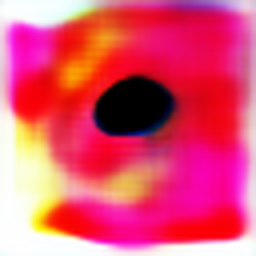

2017-08-26 16:36:09.422545: Step: 50, Descriminator: 0.314881, Generator: 0.093630, Pass Through: 0.274339
2017-08-26 16:36:16.103595: Step: 51, Descriminator: 0.707655, Generator: 0.202519, Pass Through: 0.312198
2017-08-26 16:36:31.329324: Step: 52, Descriminator: 0.548810, Generator: 0.018671, Pass Through: 0.281601
2017-08-26 16:36:45.842898: Step: 53, Descriminator: 0.298124, Generator: 0.067517, Pass Through: 0.280819
2017-08-26 16:37:00.520508: Step: 54, Descriminator: 0.345454, Generator: 0.017085, Pass Through: 0.267350
2017-08-26 16:37:15.221423: Step: 55, Descriminator: 0.283987, Generator: 0.048301, Pass Through: 0.268298
2017-08-26 16:37:29.941756: Step: 56, Descriminator: 0.318842, Generator: 0.013302, Pass Through: 0.253788
2017-08-26 16:37:44.650440: Step: 57, Descriminator: 0.244560, Generator: 0.041519, Pass Through: 0.261791
2017-08-26 16:37:59.384160: Step: 58, Descriminator: 0.269658, Generator: 0.015345, Pass Through: 0.247931
2017-08-26 16:38:05.355811: Step: 59,

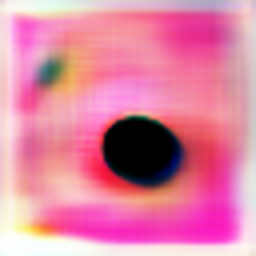

2017-08-26 16:47:27.028801: Step: 100, Descriminator: 0.473686, Generator: 0.026547, Pass Through: 0.178181
2017-08-26 16:47:41.838577: Step: 101, Descriminator: 0.211058, Generator: 0.011059, Pass Through: 0.161011
2017-08-26 16:47:56.605898: Step: 102, Descriminator: 0.083146, Generator: 0.014954, Pass Through: 0.148930
2017-08-26 16:48:11.459602: Step: 103, Descriminator: 0.113703, Generator: 0.018456, Pass Through: 0.142449
2017-08-26 16:48:26.318229: Step: 104, Descriminator: 0.097824, Generator: 0.036594, Pass Through: 0.138788
2017-08-26 16:48:41.206184: Step: 105, Descriminator: 0.154867, Generator: 0.017681, Pass Through: 0.127262
2017-08-26 16:48:56.131805: Step: 106, Descriminator: 0.102780, Generator: 0.161550, Pass Through: 0.147962
2017-08-26 16:49:02.106901: Step: 107, Descriminator: 1.227767, Generator: 1.994833, Pass Through: 0.192864
2017-08-26 16:49:17.024411: Step: 108, Descriminator: 0.644152, Generator: 0.035703, Pass Through: 0.165777
2017-08-26 16:49:32.074804: 

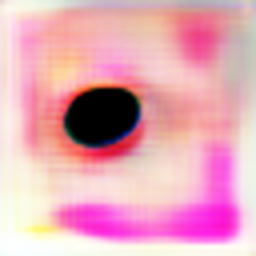

2017-08-26 16:58:49.478559: Step: 150, Descriminator: 0.060643, Generator: 0.072837, Pass Through: 0.134486
2017-08-26 16:59:04.201823: Step: 151, Descriminator: 0.085778, Generator: 0.051449, Pass Through: 0.129674
2017-08-26 16:59:18.676336: Step: 152, Descriminator: 0.106327, Generator: 0.051065, Pass Through: 0.122350
2017-08-26 16:59:33.282706: Step: 153, Descriminator: 0.082106, Generator: 0.067817, Pass Through: 0.120607
2017-08-26 16:59:47.724627: Step: 154, Descriminator: 0.128046, Generator: 0.045766, Pass Through: 0.116941
2017-08-26 16:59:54.332001: Step: 155, Descriminator: 1.504329, Generator: 1.589108, Pass Through: 0.184515
2017-08-26 17:00:10.171577: Step: 156, Descriminator: 0.583154, Generator: 0.023719, Pass Through: 0.142318
2017-08-26 17:00:24.696209: Step: 157, Descriminator: 0.136491, Generator: 0.044469, Pass Through: 0.133177
2017-08-26 17:00:39.283197: Step: 158, Descriminator: 0.122626, Generator: 0.057828, Pass Through: 0.123616
2017-08-26 17:00:53.777384: 

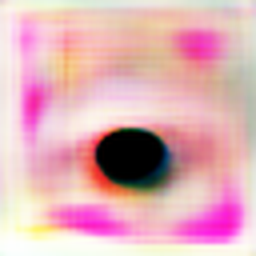

2017-08-26 17:10:09.308408: Step: 200, Descriminator: 0.067130, Generator: 0.065711, Pass Through: 0.126866
2017-08-26 17:10:23.859109: Step: 201, Descriminator: 0.098237, Generator: 0.044769, Pass Through: 0.123410
2017-08-26 17:10:38.426863: Step: 202, Descriminator: 0.092179, Generator: 0.053064, Pass Through: 0.123243
2017-08-26 17:10:44.236736: Step: 203, Descriminator: 1.211628, Generator: 1.530432, Pass Through: 0.174019
2017-08-26 17:10:58.882093: Step: 204, Descriminator: 0.270747, Generator: 0.072637, Pass Through: 0.154277
2017-08-26 17:11:13.767915: Step: 205, Descriminator: 0.175031, Generator: 0.029990, Pass Through: 0.135207
2017-08-26 17:11:28.284091: Step: 206, Descriminator: 0.108195, Generator: 0.044654, Pass Through: 0.126622
2017-08-26 17:11:42.813552: Step: 207, Descriminator: 0.070538, Generator: 0.059294, Pass Through: 0.121897
2017-08-26 17:11:57.384123: Step: 208, Descriminator: 0.068766, Generator: 0.076533, Pass Through: 0.122139
2017-08-26 17:12:12.054062: 

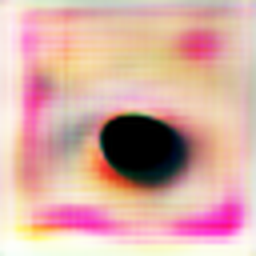

2017-08-26 17:21:26.645731: Step: 250, Descriminator: 0.101928, Generator: 0.046310, Pass Through: 0.117360
2017-08-26 17:21:32.413066: Step: 251, Descriminator: 1.442604, Generator: 1.261401, Pass Through: 0.164166
2017-08-26 17:21:46.813501: Step: 252, Descriminator: 0.152785, Generator: 0.095219, Pass Through: 0.144715
2017-08-26 17:22:01.409585: Step: 253, Descriminator: 0.135096, Generator: 0.035721, Pass Through: 0.129431
2017-08-26 17:22:15.910219: Step: 254, Descriminator: 0.078463, Generator: 0.062169, Pass Through: 0.123761
2017-08-26 17:22:30.468342: Step: 255, Descriminator: 0.095019, Generator: 0.043085, Pass Through: 0.117945
2017-08-26 17:22:45.016689: Step: 256, Descriminator: 0.082257, Generator: 0.057181, Pass Through: 0.114014
2017-08-26 17:22:59.582322: Step: 257, Descriminator: 0.077091, Generator: 0.057748, Pass Through: 0.112988
2017-08-26 17:23:14.294599: Step: 258, Descriminator: 0.065877, Generator: 0.062142, Pass Through: 0.114417
2017-08-26 17:23:20.063181: 

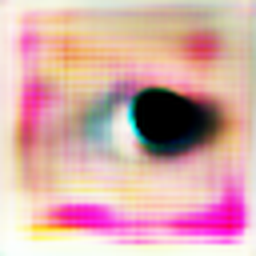

2017-08-26 17:32:33.734201: Step: 300, Descriminator: 0.158594, Generator: 0.097658, Pass Through: 0.129167
2017-08-26 17:32:48.168940: Step: 301, Descriminator: 0.096833, Generator: 0.044542, Pass Through: 0.115450
2017-08-26 17:33:02.953752: Step: 302, Descriminator: 0.059868, Generator: 0.066606, Pass Through: 0.111616
2017-08-26 17:33:17.575970: Step: 303, Descriminator: 0.058473, Generator: 0.087366, Pass Through: 0.111712
2017-08-26 17:33:32.025611: Step: 304, Descriminator: 0.067517, Generator: 0.076576, Pass Through: 0.109628
2017-08-26 17:33:46.590725: Step: 305, Descriminator: 0.082901, Generator: 0.035064, Pass Through: 0.102655
2017-08-26 17:34:01.192964: Step: 306, Descriminator: 0.054666, Generator: 0.088722, Pass Through: 0.103468
2017-08-26 17:34:06.983774: Step: 307, Descriminator: 1.166158, Generator: 1.841585, Pass Through: 0.176649
2017-08-26 17:34:21.461929: Step: 308, Descriminator: 0.237366, Generator: 0.036725, Pass Through: 0.128247
2017-08-26 17:34:36.056682: 

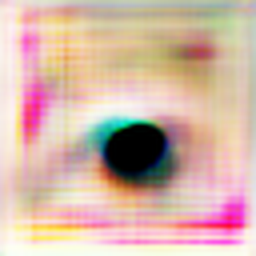

2017-08-26 17:43:52.166226: Step: 350, Descriminator: 0.061070, Generator: 0.031942, Pass Through: 0.115133
2017-08-26 17:44:06.655276: Step: 351, Descriminator: 0.131243, Generator: 0.019904, Pass Through: 0.105455
2017-08-26 17:44:21.220586: Step: 352, Descriminator: 0.107340, Generator: 0.174676, Pass Through: 0.130869
2017-08-26 17:44:35.793205: Step: 353, Descriminator: 0.082213, Generator: 0.024195, Pass Through: 0.116922
2017-08-26 17:44:50.333308: Step: 354, Descriminator: 0.053267, Generator: 0.025554, Pass Through: 0.110397
2017-08-26 17:44:56.085165: Step: 355, Descriminator: 1.240801, Generator: 0.828811, Pass Through: 0.162159
2017-08-26 17:45:10.865269: Step: 356, Descriminator: 0.102804, Generator: 0.070506, Pass Through: 0.137636
2017-08-26 17:45:25.531638: Step: 357, Descriminator: 0.138804, Generator: 0.029569, Pass Through: 0.122268
2017-08-26 17:45:40.039713: Step: 358, Descriminator: 0.114548, Generator: 0.017270, Pass Through: 0.113404
2017-08-26 17:45:54.591623: 

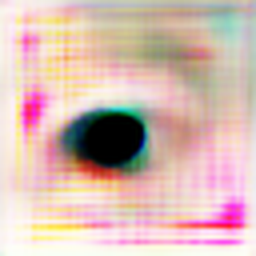

2017-08-26 17:55:18.304443: Step: 400, Descriminator: 0.066850, Generator: 0.033611, Pass Through: 0.103739
2017-08-26 17:55:33.067330: Step: 401, Descriminator: 0.053134, Generator: 0.042670, Pass Through: 0.104977
2017-08-26 17:55:47.822284: Step: 402, Descriminator: 0.067705, Generator: 0.019925, Pass Through: 0.099541
2017-08-26 17:55:53.596353: Step: 403, Descriminator: 1.309840, Generator: 0.523946, Pass Through: 0.145738
2017-08-26 17:56:08.388476: Step: 404, Descriminator: 0.113884, Generator: 0.052149, Pass Through: 0.119327
2017-08-26 17:56:23.233142: Step: 405, Descriminator: 1.748222, Generator: 0.004262, Pass Through: 0.107377
2017-08-26 17:56:37.970842: Step: 406, Descriminator: 0.580329, Generator: 0.028907, Pass Through: 0.102602
2017-08-26 17:56:52.915703: Step: 407, Descriminator: 0.107776, Generator: 0.043609, Pass Through: 0.103256
2017-08-26 17:57:10.272926: Step: 408, Descriminator: 0.099096, Generator: 0.049662, Pass Through: 0.104383
2017-08-26 17:57:25.356499: 

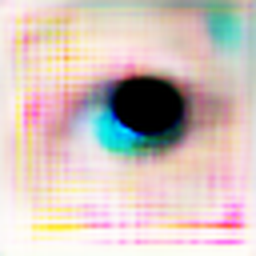

2017-08-26 18:06:45.934545: Step: 450, Descriminator: 0.050660, Generator: 0.021414, Pass Through: 0.097757
2017-08-26 18:06:51.624293: Step: 451, Descriminator: 0.667233, Generator: 0.077138, Pass Through: 0.114505
2017-08-26 18:07:06.408914: Step: 452, Descriminator: 0.133713, Generator: 0.005003, Pass Through: 0.101422
2017-08-26 18:07:21.208683: Step: 453, Descriminator: 0.086293, Generator: 0.057207, Pass Through: 0.113556
2017-08-26 18:07:35.746873: Step: 454, Descriminator: 0.067809, Generator: 0.010469, Pass Through: 0.101100
2017-08-26 18:07:50.420572: Step: 455, Descriminator: 0.058732, Generator: 0.006709, Pass Through: 0.093616
2017-08-26 18:08:05.157024: Step: 456, Descriminator: 0.046351, Generator: 0.033207, Pass Through: 0.101158
2017-08-26 18:08:19.775218: Step: 457, Descriminator: 0.033292, Generator: 0.018495, Pass Through: 0.100362
2017-08-26 18:08:34.454392: Step: 458, Descriminator: 0.083340, Generator: 0.003499, Pass Through: 0.090761
2017-08-26 18:08:40.218770: 

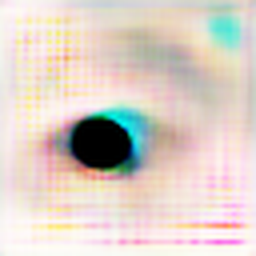

2017-08-26 18:17:58.383541: Step: 500, Descriminator: 0.116010, Generator: 0.049981, Pass Through: 0.080246
2017-08-26 18:18:12.947858: Step: 501, Descriminator: 0.101303, Generator: 0.073928, Pass Through: 0.078015
2017-08-26 18:18:27.467995: Step: 502, Descriminator: 0.081965, Generator: 0.032736, Pass Through: 0.078870
2017-08-26 18:18:42.131864: Step: 503, Descriminator: 0.087088, Generator: 0.055425, Pass Through: 0.082981
2017-08-26 18:18:56.735642: Step: 504, Descriminator: 0.122454, Generator: 0.031063, Pass Through: 0.077036
2017-08-26 18:19:11.629296: Step: 505, Descriminator: 0.068264, Generator: 0.040602, Pass Through: 0.079865
2017-08-26 18:19:26.336732: Step: 506, Descriminator: 0.066349, Generator: 0.061278, Pass Through: 0.084470
2017-08-26 18:19:32.114721: Step: 507, Descriminator: 1.169718, Generator: 0.088333, Pass Through: 0.097676
2017-08-26 18:19:46.704552: Step: 508, Descriminator: 0.088992, Generator: 0.039219, Pass Through: 0.089694
2017-08-26 18:20:01.319663: 

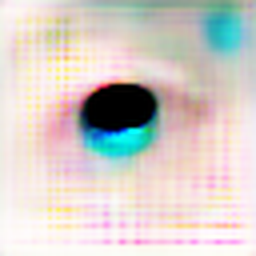

2017-08-26 18:29:19.137211: Step: 550, Descriminator: 0.113310, Generator: 0.026450, Pass Through: 0.081202
2017-08-26 18:29:33.701735: Step: 551, Descriminator: 0.083625, Generator: 0.041895, Pass Through: 0.078347
2017-08-26 18:29:48.201446: Step: 552, Descriminator: 0.075749, Generator: 0.028929, Pass Through: 0.078882
2017-08-26 18:30:02.883302: Step: 553, Descriminator: 0.071246, Generator: 0.025322, Pass Through: 0.084321
2017-08-26 18:30:17.411989: Step: 554, Descriminator: 0.090939, Generator: 0.025223, Pass Through: 0.082761
2017-08-26 18:30:23.164871: Step: 555, Descriminator: 1.062931, Generator: 0.045233, Pass Through: 0.091981
2017-08-26 18:30:37.812771: Step: 556, Descriminator: 0.089104, Generator: 0.037487, Pass Through: 0.086237
2017-08-26 18:30:52.470225: Step: 557, Descriminator: 0.103794, Generator: 0.009396, Pass Through: 0.081691
2017-08-26 18:31:07.467472: Step: 558, Descriminator: 0.098805, Generator: 0.010775, Pass Through: 0.080868
2017-08-26 18:31:22.109787: 

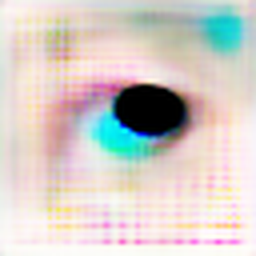

2017-08-26 18:40:41.646515: Step: 600, Descriminator: 0.064870, Generator: 0.018939, Pass Through: 0.074219
2017-08-26 18:40:56.170710: Step: 601, Descriminator: 0.060788, Generator: 0.014271, Pass Through: 0.085418
2017-08-26 18:41:11.053736: Step: 602, Descriminator: 0.080424, Generator: 0.020452, Pass Through: 0.075512
2017-08-26 18:41:16.816401: Step: 603, Descriminator: 1.168414, Generator: 0.107185, Pass Through: 0.097883
2017-08-26 18:41:31.418469: Step: 604, Descriminator: 0.080650, Generator: 0.041926, Pass Through: 0.090809
2017-08-26 18:41:45.920020: Step: 605, Descriminator: 0.119442, Generator: 0.011211, Pass Through: 0.083240
2017-08-26 18:42:00.647088: Step: 606, Descriminator: 0.082451, Generator: 0.012067, Pass Through: 0.078432
2017-08-26 18:42:15.244286: Step: 607, Descriminator: 0.075881, Generator: 0.014948, Pass Through: 0.075636
2017-08-26 18:42:29.856311: Step: 608, Descriminator: 0.079104, Generator: 0.014451, Pass Through: 0.076617
2017-08-26 18:42:44.513065: 

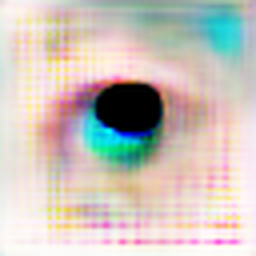

2017-08-26 18:52:03.281758: Step: 650, Descriminator: 0.036598, Generator: 0.008955, Pass Through: 0.076852
2017-08-26 18:52:09.074203: Step: 651, Descriminator: 1.322790, Generator: 0.108258, Pass Through: 0.124755
2017-08-26 18:52:23.632681: Step: 652, Descriminator: 0.098186, Generator: 0.004383, Pass Through: 0.092595
2017-08-26 18:52:38.152584: Step: 653, Descriminator: 0.125420, Generator: 0.002502, Pass Through: 0.080090
2017-08-26 18:52:52.785020: Step: 654, Descriminator: 0.070797, Generator: 0.035924, Pass Through: 0.082153
2017-08-26 18:53:07.565908: Step: 655, Descriminator: 0.054079, Generator: 0.005994, Pass Through: 0.079092
2017-08-26 18:53:22.134666: Step: 656, Descriminator: 0.067638, Generator: 0.001197, Pass Through: 0.077658
2017-08-26 18:53:36.613565: Step: 657, Descriminator: 0.054902, Generator: 0.005323, Pass Through: 0.078207
2017-08-26 18:53:51.101719: Step: 658, Descriminator: 0.043148, Generator: 0.006471, Pass Through: 0.074797
2017-08-26 18:53:56.902867: 

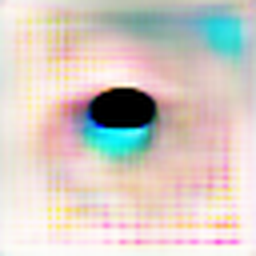

2017-08-26 19:03:12.165559: Step: 700, Descriminator: 0.082785, Generator: 0.003606, Pass Through: 0.084441
2017-08-26 19:03:26.702006: Step: 701, Descriminator: 0.083753, Generator: 0.017439, Pass Through: 0.081353
2017-08-26 19:03:41.032481: Step: 702, Descriminator: 0.071668, Generator: 0.001720, Pass Through: 0.078964
2017-08-26 19:03:55.437670: Step: 703, Descriminator: 0.057591, Generator: 0.002034, Pass Through: 0.078218
2017-08-26 19:04:09.976433: Step: 704, Descriminator: 0.052627, Generator: 0.006420, Pass Through: 0.075734
2017-08-26 19:04:24.391053: Step: 705, Descriminator: 0.050908, Generator: 0.007871, Pass Through: 0.077350
2017-08-26 19:04:38.885700: Step: 706, Descriminator: 0.064524, Generator: 0.002164, Pass Through: 0.074926
2017-08-26 19:04:44.654265: Step: 707, Descriminator: 1.191439, Generator: 0.026727, Pass Through: 0.108653
2017-08-26 19:04:59.007834: Step: 708, Descriminator: 0.111891, Generator: 0.003151, Pass Through: 0.084309
2017-08-26 19:05:13.592511: 

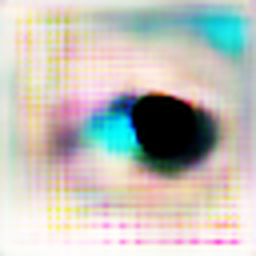

2017-08-26 19:14:24.427001: Step: 750, Descriminator: 0.066083, Generator: 0.001117, Pass Through: 0.080921
2017-08-26 19:14:38.899324: Step: 751, Descriminator: 0.068160, Generator: 0.000822, Pass Through: 0.086343
2017-08-26 19:14:53.272085: Step: 752, Descriminator: 0.064474, Generator: 0.002946, Pass Through: 0.086571
2017-08-26 19:15:08.097230: Step: 753, Descriminator: 0.048975, Generator: 0.000567, Pass Through: 0.079103
2017-08-26 19:15:22.874167: Step: 754, Descriminator: 0.056144, Generator: 0.000830, Pass Through: 0.078585
2017-08-26 19:15:28.743882: Step: 755, Descriminator: 1.209370, Generator: 0.009286, Pass Through: 0.107670
2017-08-26 19:15:43.470003: Step: 756, Descriminator: 0.099968, Generator: 0.000705, Pass Through: 0.086839
2017-08-26 19:15:58.167137: Step: 757, Descriminator: 0.085034, Generator: 0.000493, Pass Through: 0.078077
2017-08-26 19:16:12.794660: Step: 758, Descriminator: 0.078126, Generator: 0.000752, Pass Through: 0.077477
2017-08-26 19:16:27.273963: 

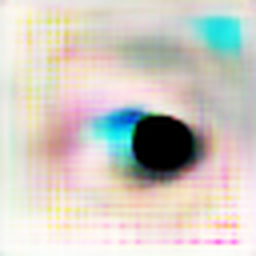

2017-08-26 19:25:37.972857: Step: 800, Descriminator: 0.062512, Generator: 0.001639, Pass Through: 0.074300
2017-08-26 19:25:52.251969: Step: 801, Descriminator: 0.054941, Generator: 0.000393, Pass Through: 0.076606
2017-08-26 19:26:06.759116: Step: 802, Descriminator: 0.042633, Generator: 0.003460, Pass Through: 0.076928
2017-08-26 19:26:12.410547: Step: 803, Descriminator: 1.141058, Generator: 0.049587, Pass Through: 0.113766
2017-08-26 19:26:27.750154: Step: 804, Descriminator: 0.095183, Generator: 0.005283, Pass Through: 0.085882
2017-08-26 19:26:42.238314: Step: 805, Descriminator: 0.070213, Generator: 0.001124, Pass Through: 0.078587
2017-08-26 19:26:57.321653: Step: 806, Descriminator: 0.089521, Generator: 0.000492, Pass Through: 0.073419
2017-08-26 19:27:11.942893: Step: 807, Descriminator: 0.059057, Generator: 0.001705, Pass Through: 0.075130
2017-08-26 19:27:26.413761: Step: 808, Descriminator: 0.053578, Generator: 0.002004, Pass Through: 0.074118
2017-08-26 19:27:40.745054: 

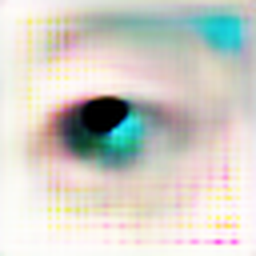

2017-08-26 19:36:50.346511: Step: 850, Descriminator: 0.039419, Generator: 0.013750, Pass Through: 0.064270
2017-08-26 19:36:55.929348: Step: 851, Descriminator: 1.246550, Generator: 0.208727, Pass Through: 0.106040
2017-08-26 19:37:10.535050: Step: 852, Descriminator: 0.136104, Generator: 0.000128, Pass Through: 0.081743
2017-08-26 19:37:25.005367: Step: 853, Descriminator: 0.066787, Generator: 0.001184, Pass Through: 0.073319
2017-08-26 19:37:39.242708: Step: 854, Descriminator: 0.108203, Generator: 0.000433, Pass Through: 0.067328
2017-08-26 19:37:53.578122: Step: 855, Descriminator: 0.054448, Generator: 0.005413, Pass Through: 0.064577
2017-08-26 19:38:07.988169: Step: 856, Descriminator: 0.055066, Generator: 0.003408, Pass Through: 0.060529
2017-08-26 19:38:22.283471: Step: 857, Descriminator: 0.047294, Generator: 0.007502, Pass Through: 0.060721
2017-08-26 19:38:36.597950: Step: 858, Descriminator: 0.037596, Generator: 0.005855, Pass Through: 0.061543
2017-08-26 19:38:42.364935: 

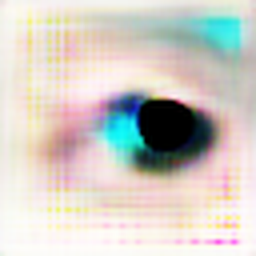

2017-08-26 19:47:50.766218: Step: 900, Descriminator: 0.087061, Generator: 0.004989, Pass Through: 0.072367
2017-08-26 19:48:05.080852: Step: 901, Descriminator: 0.109316, Generator: 0.000176, Pass Through: 0.068731
2017-08-26 19:48:19.417067: Step: 902, Descriminator: 0.071073, Generator: 0.001872, Pass Through: 0.073316
2017-08-26 19:48:33.658875: Step: 903, Descriminator: 0.054298, Generator: 0.000801, Pass Through: 0.066249
2017-08-26 19:48:48.000477: Step: 904, Descriminator: 0.049361, Generator: 0.001958, Pass Through: 0.072694
2017-08-26 19:49:02.486238: Step: 905, Descriminator: 0.051755, Generator: 0.003486, Pass Through: 0.070759
2017-08-26 19:49:16.824884: Step: 906, Descriminator: 0.039896, Generator: 0.000227, Pass Through: 0.069521
2017-08-26 19:49:22.418685: Step: 907, Descriminator: 1.226524, Generator: 0.049311, Pass Through: 0.108687
2017-08-26 19:49:36.725555: Step: 908, Descriminator: 0.120530, Generator: 0.000073, Pass Through: 0.079456
2017-08-26 19:49:50.850796: 

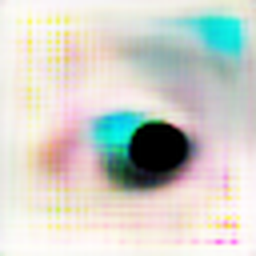

2017-08-26 19:59:00.071446: Step: 950, Descriminator: 0.056969, Generator: 0.001180, Pass Through: 0.077270
2017-08-26 19:59:14.568987: Step: 951, Descriminator: 0.058442, Generator: 0.000419, Pass Through: 0.068163
2017-08-26 19:59:28.940546: Step: 952, Descriminator: 0.059082, Generator: 0.000744, Pass Through: 0.069921
2017-08-26 19:59:43.328118: Step: 953, Descriminator: 0.075673, Generator: 0.000060, Pass Through: 0.066502
2017-08-26 19:59:58.330985: Step: 954, Descriminator: 0.050165, Generator: 0.003465, Pass Through: 0.072650
2017-08-26 20:00:04.101779: Step: 955, Descriminator: 1.192346, Generator: 0.076562, Pass Through: 0.107983
2017-08-26 20:00:18.396540: Step: 956, Descriminator: 0.067260, Generator: 0.002482, Pass Through: 0.084890
2017-08-26 20:00:32.607425: Step: 957, Descriminator: 2.705465, Generator: 0.000069, Pass Through: 0.073301
2017-08-26 20:00:46.780113: Step: 958, Descriminator: 0.159086, Generator: 0.000418, Pass Through: 0.079485
2017-08-26 20:01:01.199022: 

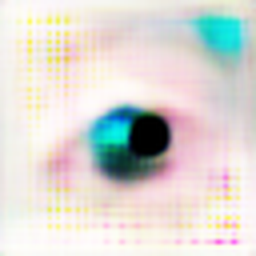

2017-08-26 20:10:09.153082: Step: 1000, Descriminator: 0.045878, Generator: 0.000401, Pass Through: 0.073867
2017-08-26 20:10:23.315793: Step: 1001, Descriminator: 0.054046, Generator: 0.000243, Pass Through: 0.070681
2017-08-26 20:10:37.572678: Step: 1002, Descriminator: 0.039026, Generator: 0.000717, Pass Through: 0.070364
2017-08-26 20:10:43.123060: Step: 1003, Descriminator: 0.605984, Generator: 0.002866, Pass Through: 0.091215
2017-08-26 20:10:57.424338: Step: 1004, Descriminator: 0.057177, Generator: 0.000931, Pass Through: 0.077532
2017-08-26 20:11:11.968185: Step: 1005, Descriminator: 0.041599, Generator: 0.000612, Pass Through: 0.072551
2017-08-26 20:11:26.334380: Step: 1006, Descriminator: 0.054657, Generator: 0.000658, Pass Through: 0.067681
2017-08-26 20:11:40.610408: Step: 1007, Descriminator: 0.049816, Generator: 0.000901, Pass Through: 0.069547
2017-08-26 20:11:54.846672: Step: 1008, Descriminator: 0.081184, Generator: 0.000046, Pass Through: 0.067628
2017-08-26 20:12:09

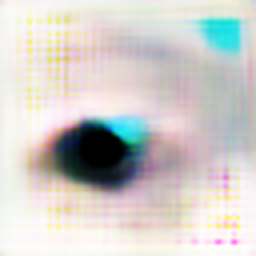

2017-08-26 20:21:14.586463: Step: 1050, Descriminator: 0.942466, Generator: 0.001024, Pass Through: 0.055751
2017-08-26 20:21:20.173861: Step: 1051, Descriminator: 1.242634, Generator: 0.001503, Pass Through: 0.058765
2017-08-26 20:21:34.478679: Step: 1052, Descriminator: 0.112483, Generator: 0.007335, Pass Through: 0.059492
2017-08-26 20:21:48.865188: Step: 1053, Descriminator: 0.093499, Generator: 0.002346, Pass Through: 0.062732
2017-08-26 20:22:03.381664: Step: 1054, Descriminator: 0.090566, Generator: 0.004390, Pass Through: 0.063766
2017-08-26 20:22:17.662849: Step: 1055, Descriminator: 0.086985, Generator: 0.006129, Pass Through: 0.061460
2017-08-26 20:22:32.052687: Step: 1056, Descriminator: 0.102790, Generator: 0.002071, Pass Through: 0.059105
2017-08-26 20:22:46.507360: Step: 1057, Descriminator: 0.063098, Generator: 0.004198, Pass Through: 0.060980
2017-08-26 20:23:00.929933: Step: 1058, Descriminator: 0.060127, Generator: 0.006904, Pass Through: 0.064251
2017-08-26 20:23:06

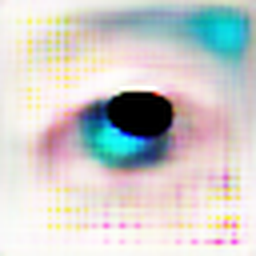

2017-08-26 20:32:16.579440: Step: 1100, Descriminator: 0.113986, Generator: 0.000811, Pass Through: 0.072163
2017-08-26 20:32:31.128446: Step: 1101, Descriminator: 0.118050, Generator: 0.000253, Pass Through: 0.068747
2017-08-26 20:32:45.633038: Step: 1102, Descriminator: 0.093995, Generator: 0.000136, Pass Through: 0.077922
2017-08-26 20:33:00.149399: Step: 1103, Descriminator: 0.083093, Generator: 0.000695, Pass Through: 0.076178
2017-08-26 20:33:14.662877: Step: 1104, Descriminator: 0.086617, Generator: 0.000238, Pass Through: 0.067995
2017-08-26 20:33:29.153091: Step: 1105, Descriminator: 0.065847, Generator: 0.000151, Pass Through: 0.067205
2017-08-26 20:33:43.623195: Step: 1106, Descriminator: 0.059177, Generator: 0.000844, Pass Through: 0.068876
2017-08-26 20:33:49.353501: Step: 1107, Descriminator: 1.142006, Generator: 0.002289, Pass Through: 0.086992
2017-08-26 20:34:03.680065: Step: 1108, Descriminator: 0.089655, Generator: 0.000111, Pass Through: 0.072043
2017-08-26 20:34:18

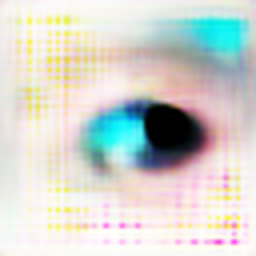

2017-08-26 20:43:32.722453: Step: 1150, Descriminator: 0.070055, Generator: 0.000147, Pass Through: 0.081168
2017-08-26 20:43:47.232710: Step: 1151, Descriminator: 0.072344, Generator: 0.000085, Pass Through: 0.075482
2017-08-26 20:44:01.881559: Step: 1152, Descriminator: 0.065084, Generator: 0.000142, Pass Through: 0.079130
2017-08-26 20:44:16.353561: Step: 1153, Descriminator: 0.056050, Generator: 0.000071, Pass Through: 0.079011
2017-08-26 20:44:30.895474: Step: 1154, Descriminator: 0.060416, Generator: 0.000060, Pass Through: 0.081849
2017-08-26 20:44:36.676786: Step: 1155, Descriminator: 1.177506, Generator: 0.000485, Pass Through: 0.115441
2017-08-26 20:44:51.225890: Step: 1156, Descriminator: 0.115552, Generator: 0.000008, Pass Through: 0.089817
2017-08-26 20:45:06.435610: Step: 1157, Descriminator: 0.073154, Generator: 0.000035, Pass Through: 0.079736
2017-08-26 20:45:21.359021: Step: 1158, Descriminator: 0.072137, Generator: 0.000035, Pass Through: 0.077336
2017-08-26 20:45:36

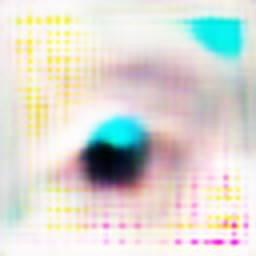

2017-08-26 20:54:48.092070: Step: 1200, Descriminator: 0.198637, Generator: 0.000003, Pass Through: 0.074902
2017-08-26 20:55:02.639625: Step: 1201, Descriminator: 0.034596, Generator: 0.000014, Pass Through: 0.075709
2017-08-26 20:55:17.285764: Step: 1202, Descriminator: 0.036632, Generator: 0.000013, Pass Through: 0.070518
2017-08-26 20:55:23.082146: Step: 1203, Descriminator: 1.273653, Generator: 0.000074, Pass Through: 0.073008
2017-08-26 20:55:37.657666: Step: 1204, Descriminator: 0.058492, Generator: 0.000116, Pass Through: 0.071568
2017-08-26 20:55:52.716926: Step: 1205, Descriminator: 0.061650, Generator: 0.000171, Pass Through: 0.075492
2017-08-26 20:56:07.556870: Step: 1206, Descriminator: 0.053076, Generator: 0.000017, Pass Through: 0.069193
2017-08-26 20:56:22.191286: Step: 1207, Descriminator: 0.045184, Generator: 0.000142, Pass Through: 0.075747
2017-08-26 20:56:36.757541: Step: 1208, Descriminator: 0.043629, Generator: 0.000183, Pass Through: 0.070876
2017-08-26 20:56:51

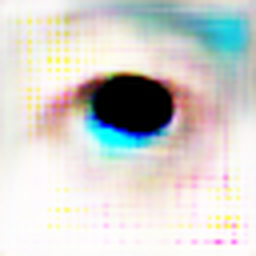

2017-08-26 21:06:24.701453: Step: 1250, Descriminator: 0.050950, Generator: 0.002436, Pass Through: 0.066972
2017-08-26 21:06:31.204950: Step: 1251, Descriminator: 1.185583, Generator: 0.045430, Pass Through: 0.092227
2017-08-26 21:06:47.141880: Step: 1252, Descriminator: 0.068511, Generator: 0.000945, Pass Through: 0.068781
2017-08-26 21:07:05.007374: Step: 1253, Descriminator: 0.065801, Generator: 0.000835, Pass Through: 0.064358
2017-08-26 21:07:22.531417: Step: 1254, Descriminator: 0.075964, Generator: 0.000423, Pass Through: 0.061087
2017-08-26 21:07:38.173735: Step: 1255, Descriminator: 0.064361, Generator: 0.000784, Pass Through: 0.063499
2017-08-26 21:07:54.034822: Step: 1256, Descriminator: 0.053842, Generator: 0.001322, Pass Through: 0.063241
2017-08-26 21:08:09.381216: Step: 1257, Descriminator: 0.049515, Generator: 0.001945, Pass Through: 0.064002
2017-08-26 21:08:26.299331: Step: 1258, Descriminator: 0.064761, Generator: 0.001350, Pass Through: 0.064679
2017-08-26 21:08:32

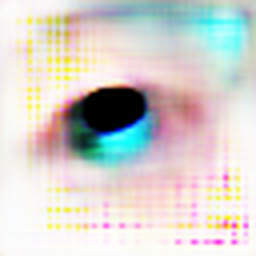

2017-08-26 21:18:40.247619: Step: 1300, Descriminator: 0.084521, Generator: 0.000422, Pass Through: 0.077853
2017-08-26 21:18:56.007842: Step: 1301, Descriminator: 0.065898, Generator: 0.000633, Pass Through: 0.074018
2017-08-26 21:19:11.039250: Step: 1302, Descriminator: 0.076046, Generator: 0.000033, Pass Through: 0.069139
2017-08-26 21:19:25.725138: Step: 1303, Descriminator: 0.051104, Generator: 0.000119, Pass Through: 0.068941
2017-08-26 21:19:40.344058: Step: 1304, Descriminator: 0.049613, Generator: 0.000105, Pass Through: 0.064547
2017-08-26 21:19:54.881434: Step: 1305, Descriminator: 0.073538, Generator: 0.000687, Pass Through: 0.066887
2017-08-26 21:20:09.501828: Step: 1306, Descriminator: 0.048254, Generator: 0.000111, Pass Through: 0.068012
2017-08-26 21:20:15.366946: Step: 1307, Descriminator: 1.237019, Generator: 0.000517, Pass Through: 0.072304
2017-08-26 21:20:29.882834: Step: 1308, Descriminator: 0.066643, Generator: 0.000248, Pass Through: 0.067928
2017-08-26 21:20:44

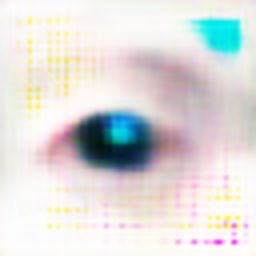

2017-08-26 21:30:33.936690: Step: 1350, Descriminator: 0.079918, Generator: 0.000149, Pass Through: 0.060085
2017-08-26 21:30:49.331383: Step: 1351, Descriminator: 0.060534, Generator: 0.000515, Pass Through: 0.064604
2017-08-26 21:31:04.413591: Step: 1352, Descriminator: 0.053779, Generator: 0.001459, Pass Through: 0.058579
2017-08-26 21:31:19.273544: Step: 1353, Descriminator: 0.047798, Generator: 0.000763, Pass Through: 0.059470
2017-08-26 21:31:34.039163: Step: 1354, Descriminator: 0.045369, Generator: 0.001682, Pass Through: 0.064104
2017-08-26 21:31:39.819017: Step: 1355, Descriminator: 1.190519, Generator: 0.001790, Pass Through: 0.065964
2017-08-26 21:31:54.555440: Step: 1356, Descriminator: 0.062650, Generator: 0.002817, Pass Through: 0.065699
2017-08-26 21:32:09.281916: Step: 1357, Descriminator: 0.066842, Generator: 0.002195, Pass Through: 0.064261
2017-08-26 21:32:23.967157: Step: 1358, Descriminator: 0.060288, Generator: 0.000312, Pass Through: 0.061047
2017-08-26 21:32:38

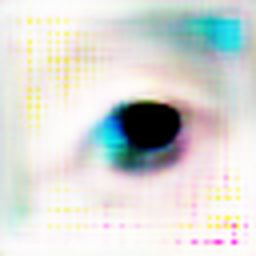

2017-08-26 21:41:53.093288: Step: 1400, Descriminator: 0.046366, Generator: 0.006164, Pass Through: 0.060203
2017-08-26 21:42:07.649123: Step: 1401, Descriminator: 0.043786, Generator: 0.009927, Pass Through: 0.064845
2017-08-26 21:42:22.274290: Step: 1402, Descriminator: 0.045918, Generator: 0.000805, Pass Through: 0.061274
2017-08-26 21:42:28.030085: Step: 1403, Descriminator: 1.309724, Generator: 0.014407, Pass Through: 0.077733
2017-08-26 21:42:42.503376: Step: 1404, Descriminator: 0.079873, Generator: 0.002642, Pass Through: 0.059632
2017-08-26 21:42:57.135343: Step: 1405, Descriminator: 0.076508, Generator: 0.001216, Pass Through: 0.055787
2017-08-26 21:43:11.929022: Step: 1406, Descriminator: 0.054425, Generator: 0.002380, Pass Through: 0.057077
2017-08-26 21:43:26.563045: Step: 1407, Descriminator: 0.058265, Generator: 0.004550, Pass Through: 0.058234
2017-08-26 21:43:41.061445: Step: 1408, Descriminator: 0.051358, Generator: 0.004108, Pass Through: 0.058404
2017-08-26 21:43:55

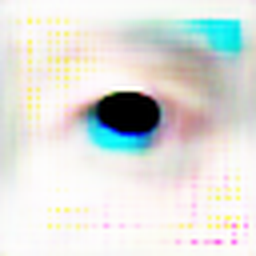

2017-08-26 21:53:05.051801: Step: 1450, Descriminator: 0.037417, Generator: 0.000480, Pass Through: 0.062358
2017-08-26 21:53:10.701034: Step: 1451, Descriminator: 1.290690, Generator: 0.016578, Pass Through: 0.090153
2017-08-26 21:53:25.134226: Step: 1452, Descriminator: 0.070147, Generator: 0.002341, Pass Through: 0.071286
2017-08-26 21:53:39.362185: Step: 1453, Descriminator: 0.061812, Generator: 0.000053, Pass Through: 0.073961
2017-08-26 21:53:53.687603: Step: 1454, Descriminator: 0.105916, Generator: 0.000296, Pass Through: 0.066388
2017-08-26 21:54:08.004776: Step: 1455, Descriminator: 0.059605, Generator: 0.000300, Pass Through: 0.060205
2017-08-26 21:54:22.281086: Step: 1456, Descriminator: 0.049087, Generator: 0.000860, Pass Through: 0.064186
2017-08-26 21:54:36.554483: Step: 1457, Descriminator: 0.045119, Generator: 0.000303, Pass Through: 0.061558
2017-08-26 21:54:50.880706: Step: 1458, Descriminator: 0.035966, Generator: 0.002009, Pass Through: 0.067918
2017-08-26 21:54:56

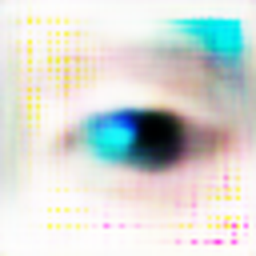

2017-08-26 22:04:07.574658: Step: 1500, Descriminator: 0.062253, Generator: 0.000710, Pass Through: 0.073519
2017-08-26 22:04:22.987239: Step: 1501, Descriminator: 0.056163, Generator: 0.000058, Pass Through: 0.068744
2017-08-26 22:04:39.301630: Step: 1502, Descriminator: 0.043565, Generator: 0.000246, Pass Through: 0.069512
2017-08-26 22:04:56.290357: Step: 1503, Descriminator: 0.046507, Generator: 0.000363, Pass Through: 0.066185
2017-08-26 22:05:14.253055: Step: 1504, Descriminator: 0.047487, Generator: 0.000253, Pass Through: 0.066760
2017-08-26 22:05:31.720740: Step: 1505, Descriminator: 0.041539, Generator: 0.000103, Pass Through: 0.064442
2017-08-26 22:05:50.349957: Step: 1506, Descriminator: 0.030829, Generator: 0.000195, Pass Through: 0.073775
2017-08-26 22:05:57.494196: Step: 1507, Descriminator: 1.350793, Generator: 0.001850, Pass Through: 0.116071
2017-08-26 22:06:16.058421: Step: 1508, Descriminator: 0.108976, Generator: 0.000023, Pass Through: 0.072776
2017-08-26 22:06:33

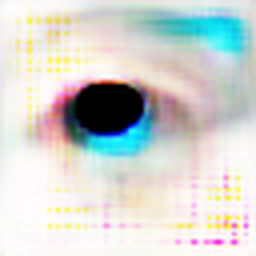

2017-08-26 22:16:05.031748: Step: 1550, Descriminator: 0.059393, Generator: 0.000127, Pass Through: 0.068596
2017-08-26 22:16:19.571021: Step: 1551, Descriminator: 0.058278, Generator: 0.000116, Pass Through: 0.065117
2017-08-26 22:16:36.041958: Step: 1552, Descriminator: 0.045611, Generator: 0.000280, Pass Through: 0.067866
2017-08-26 22:16:50.800443: Step: 1553, Descriminator: 0.047490, Generator: 0.000252, Pass Through: 0.064813
2017-08-26 22:17:05.831220: Step: 1554, Descriminator: 0.038889, Generator: 0.000172, Pass Through: 0.065988
2017-08-26 22:17:11.579795: Step: 1555, Descriminator: 0.505844, Generator: 0.061294, Pass Through: 0.111996
2017-08-26 22:17:26.283387: Step: 1556, Descriminator: 0.065509, Generator: 0.000084, Pass Through: 0.073187
2017-08-26 22:17:40.971787: Step: 1557, Descriminator: 0.046209, Generator: 0.000276, Pass Through: 0.071146
2017-08-26 22:17:55.608580: Step: 1558, Descriminator: 0.037501, Generator: 0.000619, Pass Through: 0.065334
2017-08-26 22:18:10

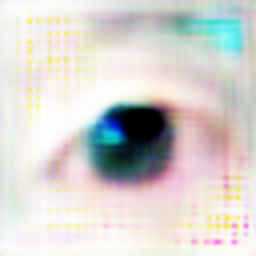

2017-08-26 22:27:40.228665: Step: 1600, Descriminator: 0.055087, Generator: 0.003403, Pass Through: 0.057023
2017-08-26 22:27:54.786429: Step: 1601, Descriminator: 1.664404, Generator: 0.000036, Pass Through: 0.054309
2017-08-26 22:28:09.612337: Step: 1602, Descriminator: 0.514706, Generator: 0.006865, Pass Through: 0.058797
2017-08-26 22:28:15.403645: Step: 1603, Descriminator: 1.130335, Generator: 0.006362, Pass Through: 0.057836
2017-08-26 22:28:31.233414: Step: 1604, Descriminator: 0.086760, Generator: 0.000454, Pass Through: 0.050982
2017-08-26 22:28:46.297967: Step: 1605, Descriminator: 0.089310, Generator: 0.001355, Pass Through: 0.054771
2017-08-26 22:29:01.258261: Step: 1606, Descriminator: 0.067070, Generator: 0.005202, Pass Through: 0.058110
2017-08-26 22:29:15.998322: Step: 1607, Descriminator: 0.071315, Generator: 0.002983, Pass Through: 0.057445
2017-08-26 22:29:30.929557: Step: 1608, Descriminator: 0.061326, Generator: 0.000755, Pass Through: 0.060460
2017-08-26 22:29:45

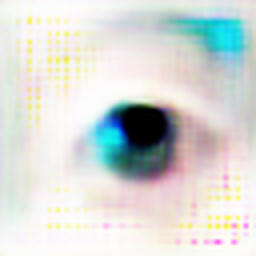

2017-08-26 22:39:18.558263: Step: 1650, Descriminator: 0.072012, Generator: 0.000331, Pass Through: 0.058318
2017-08-26 22:39:25.468912: Step: 1651, Descriminator: 1.111246, Generator: 0.000683, Pass Through: 0.062473
2017-08-26 22:39:40.314532: Step: 1652, Descriminator: 0.087231, Generator: 0.000536, Pass Through: 0.060742
2017-08-26 22:39:54.965400: Step: 1653, Descriminator: 0.088972, Generator: 0.000270, Pass Through: 0.061204
2017-08-26 22:40:09.704726: Step: 1654, Descriminator: 0.073813, Generator: 0.000605, Pass Through: 0.063710
2017-08-26 22:40:24.319480: Step: 1655, Descriminator: 0.079971, Generator: 0.000164, Pass Through: 0.060976
2017-08-26 22:40:39.046223: Step: 1656, Descriminator: 0.071128, Generator: 0.000675, Pass Through: 0.065619
2017-08-26 22:40:53.668896: Step: 1657, Descriminator: 0.060646, Generator: 0.000372, Pass Through: 0.066021
2017-08-26 22:41:10.436836: Step: 1658, Descriminator: 0.061781, Generator: 0.000134, Pass Through: 0.061151
2017-08-26 22:41:16

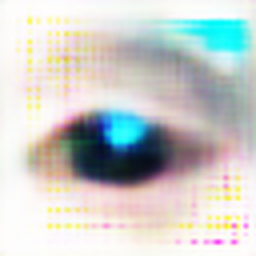

2017-08-26 22:50:45.407688: Step: 1700, Descriminator: 0.087731, Generator: 0.000085, Pass Through: 0.074930
2017-08-26 22:51:00.269395: Step: 1701, Descriminator: 0.080531, Generator: 0.000058, Pass Through: 0.075683
2017-08-26 22:51:15.061236: Step: 1702, Descriminator: 0.075598, Generator: 0.000078, Pass Through: 0.075508
2017-08-26 22:51:29.781004: Step: 1703, Descriminator: 0.080167, Generator: 0.000035, Pass Through: 0.067880
2017-08-26 22:51:44.454560: Step: 1704, Descriminator: 0.061456, Generator: 0.000079, Pass Through: 0.071051
2017-08-26 22:51:59.180953: Step: 1705, Descriminator: 0.056329, Generator: 0.000047, Pass Through: 0.069713
2017-08-26 22:52:13.907551: Step: 1706, Descriminator: 0.051278, Generator: 0.000049, Pass Through: 0.067058
2017-08-26 22:52:20.588088: Step: 1707, Descriminator: 1.181383, Generator: 0.000063, Pass Through: 0.079231
2017-08-26 22:52:35.835420: Step: 1708, Descriminator: 0.072498, Generator: 0.000626, Pass Through: 0.121726
2017-08-26 22:52:50

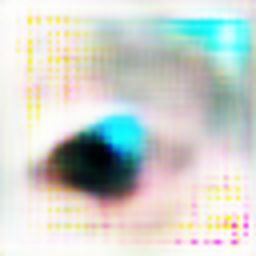

2017-08-26 23:02:17.640800: Step: 1750, Descriminator: 0.053412, Generator: 0.000147, Pass Through: 0.069416
2017-08-26 23:02:32.184747: Step: 1751, Descriminator: 0.053458, Generator: 0.000024, Pass Through: 0.066530
2017-08-26 23:02:46.872922: Step: 1752, Descriminator: 0.037711, Generator: 0.000285, Pass Through: 0.072104
2017-08-26 23:03:01.757512: Step: 1753, Descriminator: 0.031834, Generator: 0.000038, Pass Through: 0.073254
2017-08-26 23:03:16.461446: Step: 1754, Descriminator: 0.035706, Generator: 0.000050, Pass Through: 0.069275
2017-08-26 23:03:22.226909: Step: 1755, Descriminator: 1.307355, Generator: 0.000191, Pass Through: 0.073648
2017-08-26 23:03:36.900258: Step: 1756, Descriminator: 0.067286, Generator: 0.000008, Pass Through: 0.075984
2017-08-26 23:03:51.504573: Step: 1757, Descriminator: 0.055387, Generator: 0.000178, Pass Through: 0.070809
2017-08-26 23:04:06.227316: Step: 1758, Descriminator: 0.054072, Generator: 0.000010, Pass Through: 0.069142
2017-08-26 23:04:20

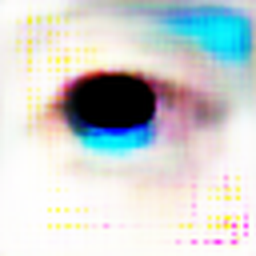

2017-08-26 23:13:45.742976: Step: 1800, Descriminator: 0.049189, Generator: 0.000009, Pass Through: 0.071147
2017-08-26 23:14:00.455306: Step: 1801, Descriminator: 0.046971, Generator: 0.000011, Pass Through: 0.073862
2017-08-26 23:14:15.064884: Step: 1802, Descriminator: 0.045093, Generator: 0.000004, Pass Through: 0.072815
2017-08-26 23:14:20.882271: Step: 1803, Descriminator: 1.154276, Generator: 0.000519, Pass Through: 0.106266
2017-08-26 23:14:35.695631: Step: 1804, Descriminator: 0.080351, Generator: 0.000018, Pass Through: 0.081557
2017-08-26 23:14:50.403349: Step: 1805, Descriminator: 0.071565, Generator: 0.000009, Pass Through: 0.075863
2017-08-26 23:15:05.368100: Step: 1806, Descriminator: 0.062916, Generator: 0.000033, Pass Through: 0.079398
2017-08-26 23:15:20.117842: Step: 1807, Descriminator: 0.084781, Generator: 0.000001, Pass Through: 0.072756
2017-08-26 23:15:34.811911: Step: 1808, Descriminator: 0.049871, Generator: 0.000020, Pass Through: 0.075665
2017-08-26 23:15:49

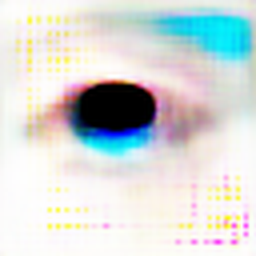

2017-08-26 23:25:33.841818: Step: 1850, Descriminator: 0.050546, Generator: 0.000005, Pass Through: 0.067133
2017-08-26 23:25:39.622908: Step: 1851, Descriminator: 1.261444, Generator: 0.000335, Pass Through: 0.103526
2017-08-26 23:25:54.300224: Step: 1852, Descriminator: 0.069467, Generator: 0.000095, Pass Through: 0.090991
2017-08-26 23:26:09.002539: Step: 1853, Descriminator: 0.086863, Generator: 0.000018, Pass Through: 0.078235
2017-08-26 23:26:23.563792: Step: 1854, Descriminator: 0.088438, Generator: 0.000004, Pass Through: 0.073064
2017-08-26 23:26:38.198821: Step: 1855, Descriminator: 0.051690, Generator: 0.000013, Pass Through: 0.066593
2017-08-26 23:26:52.748851: Step: 1856, Descriminator: 0.061210, Generator: 0.000010, Pass Through: 0.068573
2017-08-26 23:27:07.638573: Step: 1857, Descriminator: 0.045714, Generator: 0.000032, Pass Through: 0.070036
2017-08-26 23:27:22.316582: Step: 1858, Descriminator: 0.056556, Generator: 0.000009, Pass Through: 0.068973
2017-08-26 23:27:28

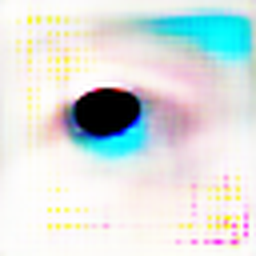

2017-08-26 23:36:54.168571: Step: 1900, Descriminator: 0.068854, Generator: 0.000001, Pass Through: 0.083537
2017-08-26 23:37:09.062558: Step: 1901, Descriminator: 0.075514, Generator: 0.000021, Pass Through: 0.080874
2017-08-26 23:37:23.702292: Step: 1902, Descriminator: 0.065834, Generator: 0.000006, Pass Through: 0.072560
2017-08-26 23:37:38.337302: Step: 1903, Descriminator: 0.066982, Generator: 0.000009, Pass Through: 0.072563
2017-08-26 23:37:53.387311: Step: 1904, Descriminator: 0.089619, Generator: 0.000006, Pass Through: 0.066581
2017-08-26 23:38:08.111641: Step: 1905, Descriminator: 0.047632, Generator: 0.000002, Pass Through: 0.066789
2017-08-26 23:38:22.690225: Step: 1906, Descriminator: 0.052174, Generator: 0.000007, Pass Through: 0.067149
2017-08-26 23:38:28.473286: Step: 1907, Descriminator: 1.276257, Generator: 0.000088, Pass Through: 0.094625
2017-08-26 23:38:43.102320: Step: 1908, Descriminator: 0.075726, Generator: 0.000011, Pass Through: 0.075367
2017-08-26 23:38:57

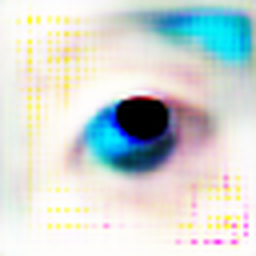

2017-08-26 23:48:16.037333: Step: 1950, Descriminator: 0.057780, Generator: 0.000001, Pass Through: 0.071950
2017-08-26 23:48:30.532423: Step: 1951, Descriminator: 0.051333, Generator: 0.000006, Pass Through: 0.071713
2017-08-26 23:48:45.074277: Step: 1952, Descriminator: 0.043760, Generator: 0.000008, Pass Through: 0.067599
2017-08-26 23:48:59.847385: Step: 1953, Descriminator: 0.041833, Generator: 0.000002, Pass Through: 0.072791
2017-08-26 23:49:14.650599: Step: 1954, Descriminator: 0.034593, Generator: 0.000016, Pass Through: 0.077721
2017-08-26 23:49:20.432767: Step: 1955, Descriminator: 1.366571, Generator: 0.000996, Pass Through: 0.112619
2017-08-26 23:49:34.991592: Step: 1956, Descriminator: 0.073053, Generator: 0.000678, Pass Through: 0.093039
2017-08-26 23:49:49.547381: Step: 1957, Descriminator: 0.107098, Generator: 0.000000, Pass Through: 0.079698
2017-08-26 23:50:04.201751: Step: 1958, Descriminator: 0.057593, Generator: 0.000002, Pass Through: 0.075546
2017-08-26 23:50:18

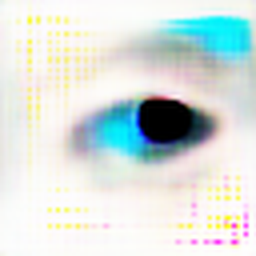

2017-08-26 23:59:34.052050: Step: 2000, Descriminator: 0.052983, Generator: 0.000052, Pass Through: 0.067360
2017-08-26 23:59:48.585081: Step: 2001, Descriminator: 0.063729, Generator: 0.000029, Pass Through: 0.066275
2017-08-27 00:00:03.791536: Step: 2002, Descriminator: 0.039049, Generator: 0.000042, Pass Through: 0.071220
2017-08-27 00:00:09.630613: Step: 2003, Descriminator: 1.281547, Generator: 0.000103, Pass Through: 0.080064
2017-08-27 00:00:24.126261: Step: 2004, Descriminator: 0.068567, Generator: 0.000087, Pass Through: 0.073746
2017-08-27 00:00:38.762521: Step: 2005, Descriminator: 0.061420, Generator: 0.000047, Pass Through: 0.074762
2017-08-27 00:00:53.308723: Step: 2006, Descriminator: 0.053644, Generator: 0.000006, Pass Through: 0.076772
2017-08-27 00:01:08.233440: Step: 2007, Descriminator: 0.056819, Generator: 0.000053, Pass Through: 0.079614
2017-08-27 00:01:22.811104: Step: 2008, Descriminator: 0.051271, Generator: 0.000014, Pass Through: 0.066354
2017-08-27 00:01:37

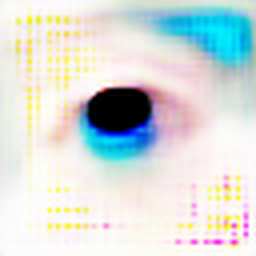

2017-08-27 00:11:00.089022: Step: 2050, Descriminator: 0.040309, Generator: 0.000005, Pass Through: 0.073886
2017-08-27 00:11:05.901527: Step: 2051, Descriminator: 1.200125, Generator: 0.000005, Pass Through: 0.082756
2017-08-27 00:11:20.549386: Step: 2052, Descriminator: 0.076062, Generator: 0.000021, Pass Through: 0.079511
2017-08-27 00:11:35.057999: Step: 2053, Descriminator: 0.059854, Generator: 0.000004, Pass Through: 0.073893
2017-08-27 00:11:49.556421: Step: 2054, Descriminator: 0.064650, Generator: 0.000015, Pass Through: 0.079724
2017-08-27 00:12:04.245074: Step: 2055, Descriminator: 0.054015, Generator: 0.000000, Pass Through: 0.078625
2017-08-27 00:12:18.700691: Step: 2056, Descriminator: 0.045635, Generator: 0.000001, Pass Through: 0.074294
2017-08-27 00:12:33.325635: Step: 2057, Descriminator: 0.045549, Generator: 0.000005, Pass Through: 0.069979
2017-08-27 00:12:47.820104: Step: 2058, Descriminator: 0.034845, Generator: 0.000014, Pass Through: 0.078074
2017-08-27 00:12:53

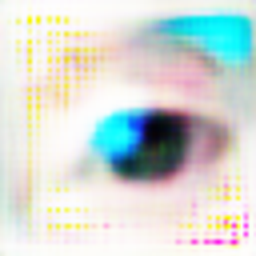

2017-08-27 00:22:10.160893: Step: 2100, Descriminator: 0.087954, Generator: 0.000014, Pass Through: 0.090911
2017-08-27 00:22:24.713042: Step: 2101, Descriminator: 0.124554, Generator: 0.000003, Pass Through: 0.074284
2017-08-27 00:22:39.201876: Step: 2102, Descriminator: 0.053798, Generator: 0.000042, Pass Through: 0.073731
2017-08-27 00:22:53.790423: Step: 2103, Descriminator: 0.056131, Generator: 0.000106, Pass Through: 0.069722
2017-08-27 00:23:08.481739: Step: 2104, Descriminator: 0.048011, Generator: 0.000074, Pass Through: 0.072291
2017-08-27 00:23:23.086823: Step: 2105, Descriminator: 0.057037, Generator: 0.000005, Pass Through: 0.072251
2017-08-27 00:23:37.544057: Step: 2106, Descriminator: 0.039126, Generator: 0.000010, Pass Through: 0.070251
2017-08-27 00:23:43.217002: Step: 2107, Descriminator: 0.578249, Generator: 0.000162, Pass Through: 0.068526
2017-08-27 00:23:57.781983: Step: 2108, Descriminator: 0.058471, Generator: 0.000832, Pass Through: 0.076065
2017-08-27 00:24:12

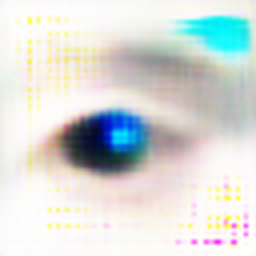

2017-08-27 00:33:30.003147: Step: 2150, Descriminator: 0.048857, Generator: 0.000805, Pass Through: 0.061702
2017-08-27 00:33:44.445692: Step: 2151, Descriminator: 0.055027, Generator: 0.001098, Pass Through: 0.061067
2017-08-27 00:33:59.030011: Step: 2152, Descriminator: 0.046505, Generator: 0.000138, Pass Through: 0.061518
2017-08-27 00:34:13.520274: Step: 2153, Descriminator: 2.033148, Generator: 0.000010, Pass Through: 0.059631
2017-08-27 00:34:27.936475: Step: 2154, Descriminator: 0.506365, Generator: 0.000034, Pass Through: 0.061288
2017-08-27 00:34:33.760677: Step: 2155, Descriminator: 1.145548, Generator: 0.000071, Pass Through: 0.060315
2017-08-27 00:34:48.244019: Step: 2156, Descriminator: 0.092417, Generator: 0.001201, Pass Through: 0.067972
2017-08-27 00:35:03.014760: Step: 2157, Descriminator: 0.094894, Generator: 0.000406, Pass Through: 0.058687
2017-08-27 00:35:17.468514: Step: 2158, Descriminator: 0.094172, Generator: 0.000483, Pass Through: 0.057397
2017-08-27 00:35:31

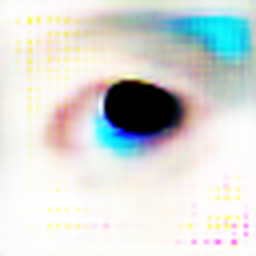

2017-08-27 00:44:46.009014: Step: 2200, Descriminator: 0.244131, Generator: 0.000099, Pass Through: 0.062521
2017-08-27 00:45:00.497615: Step: 2201, Descriminator: 0.063648, Generator: 0.000079, Pass Through: 0.066516
2017-08-27 00:45:15.301141: Step: 2202, Descriminator: 0.062938, Generator: 0.000072, Pass Through: 0.068446
2017-08-27 00:45:21.056715: Step: 2203, Descriminator: 1.258670, Generator: 0.000435, Pass Through: 0.073180
2017-08-27 00:45:35.433777: Step: 2204, Descriminator: 0.092612, Generator: 0.000202, Pass Through: 0.069424
2017-08-27 00:45:49.934388: Step: 2205, Descriminator: 0.066889, Generator: 0.000244, Pass Through: 0.061103
2017-08-27 00:46:04.481456: Step: 2206, Descriminator: 0.072642, Generator: 0.000087, Pass Through: 0.063392
2017-08-27 00:46:18.910632: Step: 2207, Descriminator: 0.059147, Generator: 0.000232, Pass Through: 0.066066
2017-08-27 00:46:33.268461: Step: 2208, Descriminator: 0.062459, Generator: 0.000149, Pass Through: 0.063864
2017-08-27 00:46:47

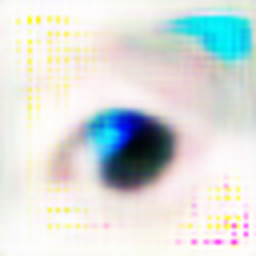

2017-08-27 00:55:56.082707: Step: 2250, Descriminator: 0.067892, Generator: 0.000007, Pass Through: 0.069705
2017-08-27 00:56:01.649529: Step: 2251, Descriminator: 1.165406, Generator: 0.000051, Pass Through: 0.086884
2017-08-27 00:56:15.963672: Step: 2252, Descriminator: 0.082378, Generator: 0.000042, Pass Through: 0.074268
2017-08-27 00:56:30.144669: Step: 2253, Descriminator: 0.077402, Generator: 0.000003, Pass Through: 0.074631
2017-08-27 00:56:44.624620: Step: 2254, Descriminator: 0.078513, Generator: 0.000017, Pass Through: 0.070945
2017-08-27 00:56:59.055341: Step: 2255, Descriminator: 0.067376, Generator: 0.000012, Pass Through: 0.072301
2017-08-27 00:57:13.406228: Step: 2256, Descriminator: 0.066550, Generator: 0.000016, Pass Through: 0.074742
2017-08-27 00:57:27.673053: Step: 2257, Descriminator: 0.060004, Generator: 0.000012, Pass Through: 0.070367
2017-08-27 00:57:41.935700: Step: 2258, Descriminator: 0.049585, Generator: 0.000017, Pass Through: 0.071503
2017-08-27 00:57:47

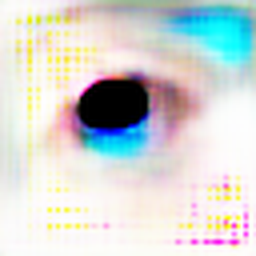

2017-08-27 01:06:53.214359: Step: 2300, Descriminator: 0.061407, Generator: 0.000003, Pass Through: 0.080944
2017-08-27 01:07:07.621550: Step: 2301, Descriminator: 0.063472, Generator: 0.000014, Pass Through: 0.071991
2017-08-27 01:07:21.797798: Step: 2302, Descriminator: 0.057948, Generator: 0.000001, Pass Through: 0.068002
2017-08-27 01:07:36.014119: Step: 2303, Descriminator: 0.070403, Generator: 0.000012, Pass Through: 0.066131
2017-08-27 01:07:50.245021: Step: 2304, Descriminator: 0.039351, Generator: 0.000005, Pass Through: 0.070682
2017-08-27 01:08:04.508879: Step: 2305, Descriminator: 0.030059, Generator: 0.000021, Pass Through: 0.069808
2017-08-27 01:08:18.664575: Step: 2306, Descriminator: 0.026084, Generator: 0.000028, Pass Through: 0.064670
2017-08-27 01:08:24.247662: Step: 2307, Descriminator: 1.407493, Generator: 0.000257, Pass Through: 0.082547
2017-08-27 01:08:38.430888: Step: 2308, Descriminator: 0.081172, Generator: 0.000048, Pass Through: 0.070646
2017-08-27 01:08:52

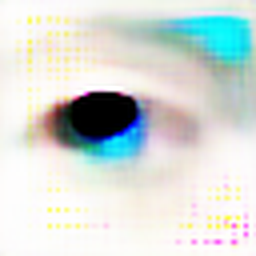

2017-08-27 01:17:54.824318: Step: 2350, Descriminator: 0.076576, Generator: 0.000027, Pass Through: 0.062688
2017-08-27 01:18:08.997739: Step: 2351, Descriminator: 0.053520, Generator: 0.000035, Pass Through: 0.063157
2017-08-27 01:18:23.234087: Step: 2352, Descriminator: 0.055295, Generator: 0.000016, Pass Through: 0.061840
2017-08-27 01:18:38.190477: Step: 2353, Descriminator: 0.045915, Generator: 0.000007, Pass Through: 0.067030
2017-08-27 01:18:52.491512: Step: 2354, Descriminator: 0.040706, Generator: 0.000030, Pass Through: 0.063933
2017-08-27 01:18:58.103766: Step: 2355, Descriminator: 1.221034, Generator: 0.000064, Pass Through: 0.077617
2017-08-27 01:19:12.648102: Step: 2356, Descriminator: 0.084417, Generator: 0.000007, Pass Through: 0.066301
2017-08-27 01:19:26.812617: Step: 2357, Descriminator: 0.079462, Generator: 0.000004, Pass Through: 0.066918
2017-08-27 01:19:40.934055: Step: 2358, Descriminator: 0.061991, Generator: 0.000029, Pass Through: 0.069030
2017-08-27 01:19:55

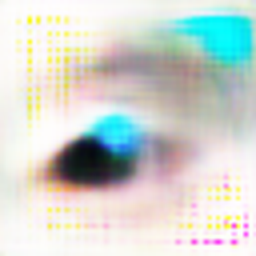

2017-08-27 01:28:54.872555: Step: 2400, Descriminator: 0.051920, Generator: 0.000002, Pass Through: 0.073357
2017-08-27 01:29:09.363048: Step: 2401, Descriminator: 0.046740, Generator: 0.000007, Pass Through: 0.071618
2017-08-27 01:29:23.555075: Step: 2402, Descriminator: 0.043437, Generator: 0.000002, Pass Through: 0.070798
2017-08-27 01:29:29.135345: Step: 2403, Descriminator: 1.216793, Generator: 0.000023, Pass Through: 0.093295
2017-08-27 01:29:43.253684: Step: 2404, Descriminator: 0.080833, Generator: 0.000004, Pass Through: 0.077191
2017-08-27 01:29:57.444304: Step: 2405, Descriminator: 0.107778, Generator: 0.000005, Pass Through: 0.076468
2017-08-27 01:30:11.657138: Step: 2406, Descriminator: 0.058612, Generator: 0.000001, Pass Through: 0.071990
2017-08-27 01:30:25.733749: Step: 2407, Descriminator: 0.059179, Generator: 0.000003, Pass Through: 0.072219
2017-08-27 01:30:39.961873: Step: 2408, Descriminator: 0.070056, Generator: 0.000002, Pass Through: 0.071433
2017-08-27 01:30:54

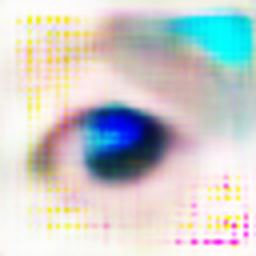

2017-08-27 01:39:52.778352: Step: 2450, Descriminator: 0.047364, Generator: 0.000001, Pass Through: 0.078946
2017-08-27 01:39:58.396889: Step: 2451, Descriminator: 1.190493, Generator: 0.000027, Pass Through: 0.099517
2017-08-27 01:40:12.495482: Step: 2452, Descriminator: 0.083798, Generator: 0.000001, Pass Through: 0.080834
2017-08-27 01:40:26.481876: Step: 2453, Descriminator: 0.076274, Generator: 0.000012, Pass Through: 0.084476
2017-08-27 01:40:40.499467: Step: 2454, Descriminator: 0.067137, Generator: 0.000004, Pass Through: 0.076235
2017-08-27 01:40:54.498686: Step: 2455, Descriminator: 0.049236, Generator: 0.000008, Pass Through: 0.081399
2017-08-27 01:41:08.951533: Step: 2456, Descriminator: 0.051247, Generator: 0.000002, Pass Through: 0.076827
2017-08-27 01:41:23.019849: Step: 2457, Descriminator: 0.048072, Generator: 0.000001, Pass Through: 0.075448
2017-08-27 01:41:37.025495: Step: 2458, Descriminator: 0.083992, Generator: 0.000002, Pass Through: 0.076498
2017-08-27 01:41:42

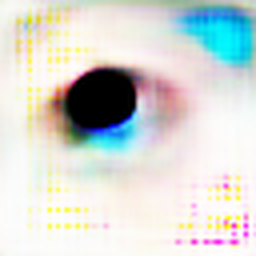

2017-08-27 01:50:39.025930: Step: 2500, Descriminator: 0.071291, Generator: 0.000008, Pass Through: 0.077653
2017-08-27 01:50:52.971111: Step: 2501, Descriminator: 0.062972, Generator: 0.000020, Pass Through: 0.080644
2017-08-27 01:51:07.297896: Step: 2502, Descriminator: 0.057296, Generator: 0.000002, Pass Through: 0.070226
2017-08-27 01:51:21.366618: Step: 2503, Descriminator: 0.046805, Generator: 0.000047, Pass Through: 0.085695
2017-08-27 01:51:35.319936: Step: 2504, Descriminator: 0.047982, Generator: 0.000001, Pass Through: 0.076539
2017-08-27 01:51:49.363206: Step: 2505, Descriminator: 0.044000, Generator: 0.000002, Pass Through: 0.072458
2017-08-27 01:52:03.499778: Step: 2506, Descriminator: 0.038959, Generator: 0.000006, Pass Through: 0.069034
2017-08-27 01:52:09.065721: Step: 2507, Descriminator: 1.282203, Generator: 0.000036, Pass Through: 0.086631
2017-08-27 01:52:22.936899: Step: 2508, Descriminator: 0.074821, Generator: 0.000002, Pass Through: 0.069590
2017-08-27 01:52:36

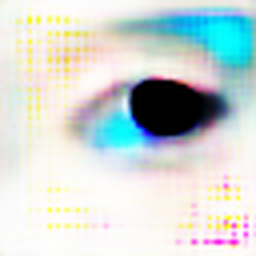

2017-08-27 02:01:34.797338: Step: 2550, Descriminator: 0.063465, Generator: 0.000002, Pass Through: 0.073750
2017-08-27 02:01:49.073822: Step: 2551, Descriminator: 0.061088, Generator: 0.000002, Pass Through: 0.075028
2017-08-27 02:02:03.159319: Step: 2552, Descriminator: 0.057893, Generator: 0.000013, Pass Through: 0.092868
2017-08-27 02:02:17.127118: Step: 2553, Descriminator: 0.040203, Generator: 0.000002, Pass Through: 0.077082
2017-08-27 02:02:31.092056: Step: 2554, Descriminator: 0.036737, Generator: 0.000011, Pass Through: 0.088244
2017-08-27 02:02:36.750835: Step: 2555, Descriminator: 1.250966, Generator: 0.000001, Pass Through: 0.081242
2017-08-27 02:02:50.783795: Step: 2556, Descriminator: 0.078252, Generator: 0.000002, Pass Through: 0.080704
2017-08-27 02:03:05.088206: Step: 2557, Descriminator: 0.069177, Generator: 0.000003, Pass Through: 0.075865
2017-08-27 02:03:19.231545: Step: 2558, Descriminator: 0.055925, Generator: 0.000002, Pass Through: 0.077800
2017-08-27 02:03:33

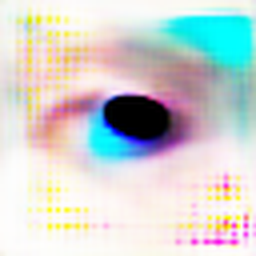

2017-08-27 02:12:27.964256: Step: 2600, Descriminator: 0.056428, Generator: 0.000005, Pass Through: 0.086848
2017-08-27 02:12:41.948332: Step: 2601, Descriminator: 0.047141, Generator: 0.000000, Pass Through: 0.076870
2017-08-27 02:12:55.868291: Step: 2602, Descriminator: 0.044938, Generator: 0.000003, Pass Through: 0.079737
2017-08-27 02:13:01.631515: Step: 2603, Descriminator: 1.261354, Generator: 0.000002, Pass Through: 0.089482
2017-08-27 02:13:15.735236: Step: 2604, Descriminator: 0.069479, Generator: 0.000001, Pass Through: 0.089165
2017-08-27 02:13:29.676522: Step: 2605, Descriminator: 0.093566, Generator: 0.000000, Pass Through: 0.081937
2017-08-27 02:13:43.610422: Step: 2606, Descriminator: 0.053514, Generator: 0.000000, Pass Through: 0.096441
2017-08-27 02:13:57.672037: Step: 2607, Descriminator: 0.048538, Generator: 0.000000, Pass Through: 0.091690
2017-08-27 02:14:11.674191: Step: 2608, Descriminator: 0.039351, Generator: 0.000001, Pass Through: 0.077460
2017-08-27 02:14:25

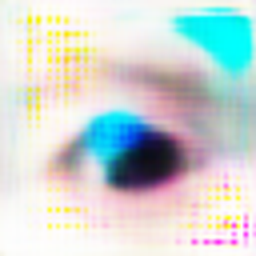

2017-08-27 02:23:20.576232: Step: 2650, Descriminator: 0.054081, Generator: 0.000001, Pass Through: 0.082754
2017-08-27 02:23:26.171245: Step: 2651, Descriminator: 1.206423, Generator: 0.000013, Pass Through: 0.101394
2017-08-27 02:23:40.048273: Step: 2652, Descriminator: 0.078596, Generator: 0.000008, Pass Through: 0.100592
2017-08-27 02:23:54.050540: Step: 2653, Descriminator: 0.074692, Generator: 0.000000, Pass Through: 0.084003
2017-08-27 02:24:08.040597: Step: 2654, Descriminator: 0.133907, Generator: 0.000000, Pass Through: 0.076858
2017-08-27 02:24:22.171709: Step: 2655, Descriminator: 0.049834, Generator: 0.000001, Pass Through: 0.078175
2017-08-27 02:24:36.266475: Step: 2656, Descriminator: 0.052905, Generator: 0.000004, Pass Through: 0.087271
2017-08-27 02:24:50.333808: Step: 2657, Descriminator: 0.041601, Generator: 0.000003, Pass Through: 0.087913
2017-08-27 02:25:04.522742: Step: 2658, Descriminator: 0.042634, Generator: 0.000001, Pass Through: 0.076792
2017-08-27 02:25:10

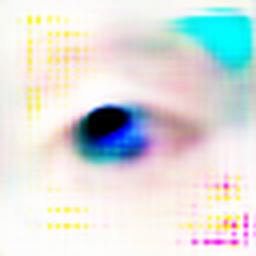

2017-08-27 02:34:02.320767: Step: 2700, Descriminator: 0.071632, Generator: 0.000068, Pass Through: 0.078014
2017-08-27 02:34:16.062871: Step: 2701, Descriminator: 0.098609, Generator: 0.000010, Pass Through: 0.076076
2017-08-27 02:34:29.999782: Step: 2702, Descriminator: 0.059895, Generator: 0.000003, Pass Through: 0.070181
2017-08-27 02:34:43.848398: Step: 2703, Descriminator: 0.060100, Generator: 0.000014, Pass Through: 0.072355
2017-08-27 02:34:57.799475: Step: 2704, Descriminator: 0.041549, Generator: 0.000012, Pass Through: 0.073873
2017-08-27 02:35:11.969232: Step: 2705, Descriminator: 1.843903, Generator: 0.000001, Pass Through: 0.070254
2017-08-27 02:35:25.922509: Step: 2706, Descriminator: 0.232435, Generator: 0.000002, Pass Through: 0.068066
2017-08-27 02:35:31.505745: Step: 2707, Descriminator: 1.222713, Generator: 0.000048, Pass Through: 0.071778
2017-08-27 02:35:45.280648: Step: 2708, Descriminator: 0.096085, Generator: 0.000047, Pass Through: 0.071874
2017-08-27 02:35:59

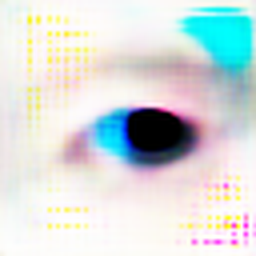

2017-08-27 02:44:50.484092: Step: 2750, Descriminator: 0.059651, Generator: 0.000001, Pass Through: 0.071484
2017-08-27 02:45:04.517935: Step: 2751, Descriminator: 1.566525, Generator: 0.000000, Pass Through: 0.072032
2017-08-27 02:45:18.459477: Step: 2752, Descriminator: 0.324101, Generator: 0.000002, Pass Through: 0.070295
2017-08-27 02:45:32.322920: Step: 2753, Descriminator: 0.067511, Generator: 0.000004, Pass Through: 0.074970
2017-08-27 02:45:46.175208: Step: 2754, Descriminator: 0.065935, Generator: 0.000001, Pass Through: 0.071792
2017-08-27 02:45:51.741206: Step: 2755, Descriminator: 1.248467, Generator: 0.000030, Pass Through: 0.091210
2017-08-27 02:46:05.599942: Step: 2756, Descriminator: 0.070095, Generator: 0.000001, Pass Through: 0.073443
2017-08-27 02:46:19.562386: Step: 2757, Descriminator: 0.077630, Generator: 0.000004, Pass Through: 0.074177
2017-08-27 02:46:33.396398: Step: 2758, Descriminator: 0.077406, Generator: 0.000004, Pass Through: 0.070628
2017-08-27 02:46:47

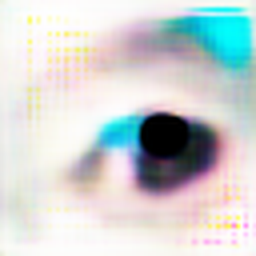

2017-08-27 02:55:37.634552: Step: 2800, Descriminator: 0.061766, Generator: 0.000009, Pass Through: 0.065788
2017-08-27 02:55:51.379911: Step: 2801, Descriminator: 0.066622, Generator: 0.000019, Pass Through: 0.062916
2017-08-27 02:56:05.390341: Step: 2802, Descriminator: 0.062670, Generator: 0.000050, Pass Through: 0.067551
2017-08-27 02:56:10.961025: Step: 2803, Descriminator: 1.244017, Generator: 0.000043, Pass Through: 0.074796
2017-08-27 02:56:24.754704: Step: 2804, Descriminator: 0.094929, Generator: 0.000138, Pass Through: 0.074373
2017-08-27 02:56:38.681855: Step: 2805, Descriminator: 0.075939, Generator: 0.000015, Pass Through: 0.069655
2017-08-27 02:56:52.417707: Step: 2806, Descriminator: 0.070764, Generator: 0.000094, Pass Through: 0.075020
2017-08-27 02:57:06.665060: Step: 2807, Descriminator: 0.067199, Generator: 0.000025, Pass Through: 0.073310
2017-08-27 02:57:20.769002: Step: 2808, Descriminator: 0.064128, Generator: 0.000033, Pass Through: 0.067794
2017-08-27 02:57:34

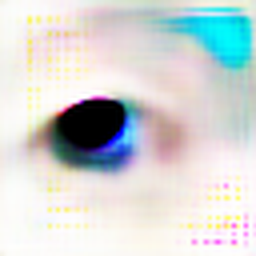

2017-08-27 03:06:26.299108: Step: 2850, Descriminator: 0.022947, Generator: 0.000015, Pass Through: 0.061883
2017-08-27 03:06:31.746300: Step: 2851, Descriminator: 1.434487, Generator: 0.000144, Pass Through: 0.066610
2017-08-27 03:06:45.641584: Step: 2852, Descriminator: 0.056055, Generator: 0.000582, Pass Through: 0.077883
2017-08-27 03:06:59.560672: Step: 2853, Descriminator: 0.054421, Generator: 0.000002, Pass Through: 0.065100
2017-08-27 03:07:13.614128: Step: 2854, Descriminator: 0.046410, Generator: 0.000010, Pass Through: 0.060744
2017-08-27 03:07:27.403367: Step: 2855, Descriminator: 0.040037, Generator: 0.000088, Pass Through: 0.065106
2017-08-27 03:07:41.242832: Step: 2856, Descriminator: 0.037580, Generator: 0.000059, Pass Through: 0.066595
2017-08-27 03:07:55.128552: Step: 2857, Descriminator: 0.033641, Generator: 0.000027, Pass Through: 0.064531
2017-08-27 03:08:09.130169: Step: 2858, Descriminator: 0.036709, Generator: 0.000013, Pass Through: 0.063253
2017-08-27 03:08:14

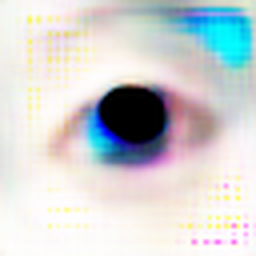

2017-08-27 03:17:03.704946: Step: 2900, Descriminator: 0.083619, Generator: 0.000090, Pass Through: 0.062535
2017-08-27 03:17:17.696669: Step: 2901, Descriminator: 0.074850, Generator: 0.000009, Pass Through: 0.061066
2017-08-27 03:17:31.514756: Step: 2902, Descriminator: 0.055112, Generator: 0.000011, Pass Through: 0.060680
2017-08-27 03:17:45.379418: Step: 2903, Descriminator: 0.049901, Generator: 0.000063, Pass Through: 0.060554
2017-08-27 03:17:59.345102: Step: 2904, Descriminator: 0.052624, Generator: 0.000028, Pass Through: 0.059669
2017-08-27 03:18:13.171363: Step: 2905, Descriminator: 0.042834, Generator: 0.000032, Pass Through: 0.058176
2017-08-27 03:18:27.066208: Step: 2906, Descriminator: 0.044521, Generator: 0.000064, Pass Through: 0.061978
2017-08-27 03:18:32.974498: Step: 2907, Descriminator: 1.175961, Generator: 0.000005, Pass Through: 0.073272
2017-08-27 03:18:47.139679: Step: 2908, Descriminator: 0.065150, Generator: 0.000056, Pass Through: 0.070531
2017-08-27 03:19:01

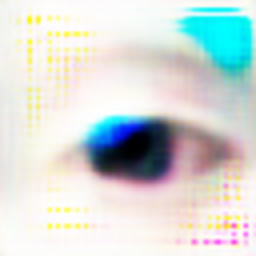

2017-08-27 03:27:52.523937: Step: 2950, Descriminator: 0.066901, Generator: 0.000014, Pass Through: 0.074609
2017-08-27 03:28:06.369699: Step: 2951, Descriminator: 0.063592, Generator: 0.000002, Pass Through: 0.069045
2017-08-27 03:28:20.198493: Step: 2952, Descriminator: 0.055410, Generator: 0.000003, Pass Through: 0.065866
2017-08-27 03:28:34.074976: Step: 2953, Descriminator: 0.057573, Generator: 0.000003, Pass Through: 0.068262
2017-08-27 03:28:47.939437: Step: 2954, Descriminator: 0.045876, Generator: 0.000007, Pass Through: 0.069172
2017-08-27 03:28:53.419687: Step: 2955, Descriminator: 1.173887, Generator: 0.000031, Pass Through: 0.088732
2017-08-27 03:29:07.673464: Step: 2956, Descriminator: 0.075892, Generator: 0.000001, Pass Through: 0.078020
2017-08-27 03:29:21.516252: Step: 2957, Descriminator: 0.058535, Generator: 0.000017, Pass Through: 0.077186
2017-08-27 03:29:35.440431: Step: 2958, Descriminator: 0.065175, Generator: 0.000001, Pass Through: 0.070082
2017-08-27 03:29:49

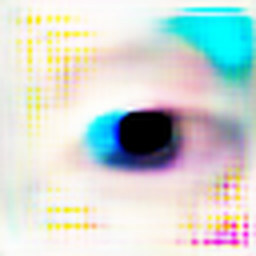

2017-08-27 03:38:38.289288: Step: 3000, Descriminator: 0.052180, Generator: 0.000000, Pass Through: 0.086975
2017-08-27 03:38:52.055603: Step: 3001, Descriminator: 0.059909, Generator: 0.000002, Pass Through: 0.083041
2017-08-27 03:39:06.237116: Step: 3002, Descriminator: 0.052559, Generator: 0.000000, Pass Through: 0.076567
2017-08-27 03:39:11.840674: Step: 3003, Descriminator: 1.149332, Generator: 0.000014, Pass Through: 0.094794
2017-08-27 03:39:25.658039: Step: 3004, Descriminator: 0.081836, Generator: 0.000001, Pass Through: 0.083789
2017-08-27 03:39:39.461654: Step: 3005, Descriminator: 0.064666, Generator: 0.000002, Pass Through: 0.083386
2017-08-27 03:39:53.342435: Step: 3006, Descriminator: 0.092970, Generator: 0.000003, Pass Through: 0.080370
2017-08-27 03:40:07.226518: Step: 3007, Descriminator: 0.049907, Generator: 0.000001, Pass Through: 0.076058
2017-08-27 03:40:21.002172: Step: 3008, Descriminator: 0.045039, Generator: 0.000001, Pass Through: 0.075515
2017-08-27 03:40:34

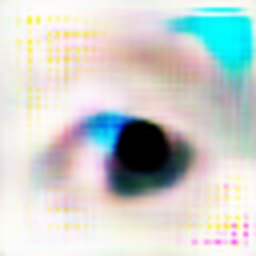

2017-08-27 03:49:23.594048: Step: 3050, Descriminator: 0.039336, Generator: 0.000002, Pass Through: 0.071552
2017-08-27 03:49:28.998511: Step: 3051, Descriminator: 1.191629, Generator: 0.000200, Pass Through: 0.107658
2017-08-27 03:49:42.795830: Step: 3052, Descriminator: 0.260139, Generator: 0.000000, Pass Through: 0.083238
2017-08-27 03:49:56.558128: Step: 3053, Descriminator: 0.056726, Generator: 0.000000, Pass Through: 0.075831
2017-08-27 03:50:10.583655: Step: 3054, Descriminator: 0.059646, Generator: 0.000000, Pass Through: 0.071621
2017-08-27 03:50:24.313813: Step: 3055, Descriminator: 0.052477, Generator: 0.000005, Pass Through: 0.072414
2017-08-27 03:50:38.192454: Step: 3056, Descriminator: 0.042688, Generator: 0.000006, Pass Through: 0.070664
2017-08-27 03:50:51.934327: Step: 3057, Descriminator: 0.041182, Generator: 0.000007, Pass Through: 0.068205
2017-08-27 03:51:06.068287: Step: 3058, Descriminator: 0.040729, Generator: 0.000007, Pass Through: 0.066047
2017-08-27 03:51:11

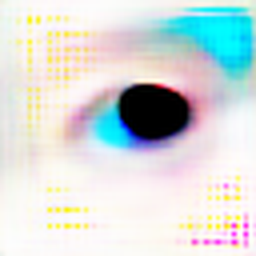

2017-08-27 03:59:59.069562: Step: 3100, Descriminator: 0.071373, Generator: 0.000000, Pass Through: 0.075376
2017-08-27 04:00:12.894195: Step: 3101, Descriminator: 0.064927, Generator: 0.000001, Pass Through: 0.073390
2017-08-27 04:00:26.643357: Step: 3102, Descriminator: 0.088522, Generator: 0.000001, Pass Through: 0.068885
2017-08-27 04:00:40.461088: Step: 3103, Descriminator: 0.047302, Generator: 0.000035, Pass Through: 0.081678
2017-08-27 04:00:54.257927: Step: 3104, Descriminator: 0.046099, Generator: 0.000003, Pass Through: 0.067458
2017-08-27 04:01:08.459073: Step: 3105, Descriminator: 0.040598, Generator: 0.000001, Pass Through: 0.071897
2017-08-27 04:01:22.240563: Step: 3106, Descriminator: 0.055803, Generator: 0.000001, Pass Through: 0.071178
2017-08-27 04:01:27.654445: Step: 3107, Descriminator: 1.233336, Generator: 0.000006, Pass Through: 0.072595
2017-08-27 04:01:42.045795: Step: 3108, Descriminator: 0.075606, Generator: 0.000015, Pass Through: 0.074974
2017-08-27 04:01:55

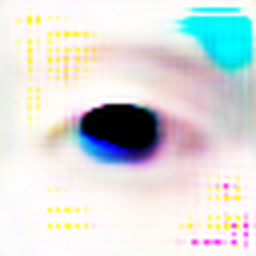

2017-08-27 04:10:41.674619: Step: 3150, Descriminator: 0.051429, Generator: 0.000001, Pass Through: 0.073854
2017-08-27 04:10:55.306633: Step: 3151, Descriminator: 0.068354, Generator: 0.000001, Pass Through: 0.067777
2017-08-27 04:11:09.545742: Step: 3152, Descriminator: 0.049895, Generator: 0.000007, Pass Through: 0.068866
2017-08-27 04:11:23.311686: Step: 3153, Descriminator: 0.054023, Generator: 0.000009, Pass Through: 0.068679
2017-08-27 04:11:37.014816: Step: 3154, Descriminator: 0.060700, Generator: 0.000005, Pass Through: 0.062976
2017-08-27 04:11:42.414316: Step: 3155, Descriminator: 1.305125, Generator: 0.000005, Pass Through: 0.058355
2017-08-27 04:11:56.278527: Step: 3156, Descriminator: 0.075468, Generator: 0.000007, Pass Through: 0.059172
2017-08-27 04:12:10.072633: Step: 3157, Descriminator: 0.066532, Generator: 0.000015, Pass Through: 0.059883
2017-08-27 04:12:23.756256: Step: 3158, Descriminator: 0.055028, Generator: 0.000049, Pass Through: 0.063085
2017-08-27 04:12:37

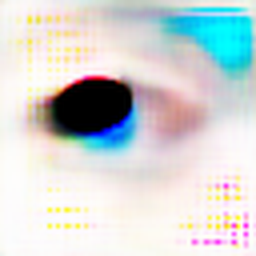

2017-08-27 04:21:22.747076: Step: 3200, Descriminator: 0.041294, Generator: 0.000002, Pass Through: 0.067577
2017-08-27 04:21:36.408597: Step: 3201, Descriminator: 0.054346, Generator: 0.000002, Pass Through: 0.068762
2017-08-27 04:21:50.128279: Step: 3202, Descriminator: 0.033671, Generator: 0.000003, Pass Through: 0.068451
2017-08-27 04:21:55.521552: Step: 3203, Descriminator: 1.278387, Generator: 0.000010, Pass Through: 0.079683
2017-08-27 04:22:09.319435: Step: 3204, Descriminator: 0.075319, Generator: 0.000001, Pass Through: 0.072149
2017-08-27 04:22:22.945112: Step: 3205, Descriminator: 0.070518, Generator: 0.000002, Pass Through: 0.077518
2017-08-27 04:22:36.699005: Step: 3206, Descriminator: 0.064007, Generator: 0.000007, Pass Through: 0.078153
2017-08-27 04:22:50.396394: Step: 3207, Descriminator: 0.049352, Generator: 0.000006, Pass Through: 0.077902
2017-08-27 04:23:04.350319: Step: 3208, Descriminator: 0.051947, Generator: 0.000002, Pass Through: 0.072257
2017-08-27 04:23:18

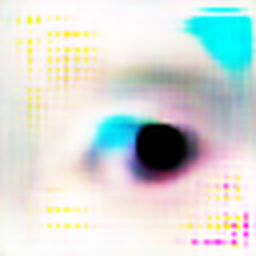

2017-08-27 04:32:02.450262: Step: 3250, Descriminator: 0.080729, Generator: 0.000000, Pass Through: 0.068919
2017-08-27 04:32:07.861150: Step: 3251, Descriminator: 1.226584, Generator: 0.000002, Pass Through: 0.066402
2017-08-27 04:32:21.565282: Step: 3252, Descriminator: 0.068171, Generator: 0.000005, Pass Through: 0.068382
2017-08-27 04:32:35.233676: Step: 3253, Descriminator: 0.058156, Generator: 0.000012, Pass Through: 0.071883
2017-08-27 04:32:48.996399: Step: 3254, Descriminator: 0.059690, Generator: 0.000005, Pass Through: 0.070897
2017-08-27 04:33:02.930186: Step: 3255, Descriminator: 0.053573, Generator: 0.000003, Pass Through: 0.068611
2017-08-27 04:33:16.735555: Step: 3256, Descriminator: 0.045657, Generator: 0.000029, Pass Through: 0.075932
2017-08-27 04:33:30.483410: Step: 3257, Descriminator: 2.072920, Generator: 0.000000, Pass Through: 0.067996
2017-08-27 04:33:44.090403: Step: 3258, Descriminator: 0.300872, Generator: 0.000001, Pass Through: 0.064385
2017-08-27 04:33:49

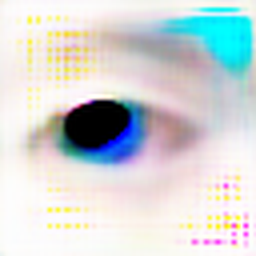

2017-08-27 04:42:33.231808: Step: 3300, Descriminator: 0.076264, Generator: 0.000088, Pass Through: 0.066200
2017-08-27 04:42:46.910251: Step: 3301, Descriminator: 0.060735, Generator: 0.000020, Pass Through: 0.062209
2017-08-27 04:43:00.818436: Step: 3302, Descriminator: 0.055255, Generator: 0.000440, Pass Through: 0.073088
2017-08-27 04:43:14.664646: Step: 3303, Descriminator: 2.190409, Generator: 0.000001, Pass Through: 0.064402
2017-08-27 04:43:28.408460: Step: 3304, Descriminator: 0.187915, Generator: 0.000001, Pass Through: 0.062723
2017-08-27 04:43:42.148987: Step: 3305, Descriminator: 0.069670, Generator: 0.000025, Pass Through: 0.061762
2017-08-27 04:43:55.868079: Step: 3306, Descriminator: 0.058299, Generator: 0.000027, Pass Through: 0.063450
2017-08-27 04:44:01.341616: Step: 3307, Descriminator: 1.305601, Generator: 0.000072, Pass Through: 0.062404
2017-08-27 04:44:15.077568: Step: 3308, Descriminator: 0.073641, Generator: 0.000056, Pass Through: 0.062353
2017-08-27 04:44:28

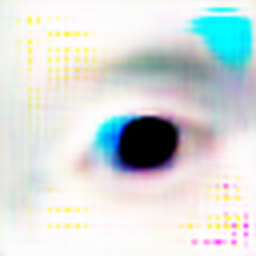

2017-08-27 04:53:12.219413: Step: 3350, Descriminator: 0.116376, Generator: 0.000018, Pass Through: 0.060711
2017-08-27 04:53:25.846870: Step: 3351, Descriminator: 0.095037, Generator: 0.000012, Pass Through: 0.060704
2017-08-27 04:53:39.464396: Step: 3352, Descriminator: 0.091206, Generator: 0.000008, Pass Through: 0.064224
2017-08-27 04:53:53.209771: Step: 3353, Descriminator: 0.064839, Generator: 0.000005, Pass Through: 0.061675
2017-08-27 04:54:06.927589: Step: 3354, Descriminator: 0.075096, Generator: 0.000015, Pass Through: 0.062245
2017-08-27 04:54:12.321938: Step: 3355, Descriminator: 1.161469, Generator: 0.000005, Pass Through: 0.062096
2017-08-27 04:54:25.914349: Step: 3356, Descriminator: 0.090479, Generator: 0.000028, Pass Through: 0.067320
2017-08-27 04:54:39.657206: Step: 3357, Descriminator: 0.073277, Generator: 0.000012, Pass Through: 0.063084
2017-08-27 04:54:53.382432: Step: 3358, Descriminator: 0.070749, Generator: 0.000017, Pass Through: 0.064224
2017-08-27 04:55:07

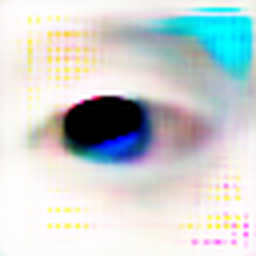

2017-08-27 05:03:51.674884: Step: 3400, Descriminator: 0.035437, Generator: 0.000039, Pass Through: 0.067954
2017-08-27 05:04:05.315496: Step: 3401, Descriminator: 0.023832, Generator: 0.000012, Pass Through: 0.065567
2017-08-27 05:04:18.874180: Step: 3402, Descriminator: 0.034336, Generator: 0.000005, Pass Through: 0.063691
2017-08-27 05:04:24.306363: Step: 3403, Descriminator: 1.640881, Generator: 0.000438, Pass Through: 0.082955
2017-08-27 05:04:38.061502: Step: 3404, Descriminator: 0.049946, Generator: 0.000055, Pass Through: 0.068493
2017-08-27 05:04:51.747961: Step: 3405, Descriminator: 0.047479, Generator: 0.000004, Pass Through: 0.065775
2017-08-27 05:05:05.716462: Step: 3406, Descriminator: 0.046327, Generator: 0.000127, Pass Through: 0.067572
2017-08-27 05:05:19.342551: Step: 3407, Descriminator: 0.035377, Generator: 0.000028, Pass Through: 0.065115
2017-08-27 05:05:33.037935: Step: 3408, Descriminator: 0.034867, Generator: 0.002344, Pass Through: 0.090000
2017-08-27 05:05:46

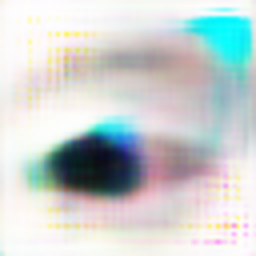

2017-08-27 05:14:28.390232: Step: 3450, Descriminator: 0.055529, Generator: 0.000084, Pass Through: 0.068222
2017-08-27 05:14:33.794820: Step: 3451, Descriminator: 1.183852, Generator: 0.000382, Pass Through: 0.077423
2017-08-27 05:14:47.349537: Step: 3452, Descriminator: 0.073498, Generator: 0.000006, Pass Through: 0.067576
2017-08-27 05:15:01.294847: Step: 3453, Descriminator: 0.088269, Generator: 0.000026, Pass Through: 0.062250
2017-08-27 05:15:15.104449: Step: 3454, Descriminator: 0.068255, Generator: 0.000011, Pass Through: 0.060896
2017-08-27 05:15:28.845533: Step: 3455, Descriminator: 0.081754, Generator: 0.000037, Pass Through: 0.060192
2017-08-27 05:15:42.477774: Step: 3456, Descriminator: 0.056623, Generator: 0.000016, Pass Through: 0.059907
2017-08-27 05:15:56.179706: Step: 3457, Descriminator: 0.047310, Generator: 0.000102, Pass Through: 0.062934
2017-08-27 05:16:09.821181: Step: 3458, Descriminator: 0.046002, Generator: 0.000003, Pass Through: 0.062054
2017-08-27 05:16:15

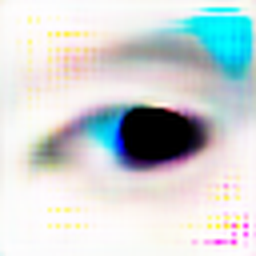

2017-08-27 05:24:56.554169: Step: 3500, Descriminator: 0.076301, Generator: 0.000034, Pass Through: 0.065402
2017-08-27 05:25:10.452510: Step: 3501, Descriminator: 0.056439, Generator: 0.000030, Pass Through: 0.061194
2017-08-27 05:25:24.105844: Step: 3502, Descriminator: 0.059511, Generator: 0.000059, Pass Through: 0.062052
2017-08-27 05:25:37.727554: Step: 3503, Descriminator: 0.072973, Generator: 0.000036, Pass Through: 0.062986
2017-08-27 05:25:51.295531: Step: 3504, Descriminator: 0.059636, Generator: 0.000079, Pass Through: 0.065473
2017-08-27 05:26:04.955547: Step: 3505, Descriminator: 0.045853, Generator: 0.000041, Pass Through: 0.064214
2017-08-27 05:26:18.564203: Step: 3506, Descriminator: 0.050959, Generator: 0.000006, Pass Through: 0.061846
2017-08-27 05:26:24.110514: Step: 3507, Descriminator: 1.355282, Generator: 0.000723, Pass Through: 0.086583
2017-08-27 05:26:37.814168: Step: 3508, Descriminator: 0.063313, Generator: 0.000007, Pass Through: 0.071863
2017-08-27 05:26:51

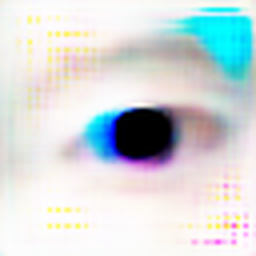

2017-08-27 05:35:32.083219: Step: 3550, Descriminator: 0.068037, Generator: 0.000006, Pass Through: 0.060652
2017-08-27 05:35:45.754414: Step: 3551, Descriminator: 0.062275, Generator: 0.000023, Pass Through: 0.064322
2017-08-27 05:35:59.434408: Step: 3552, Descriminator: 0.055565, Generator: 0.000020, Pass Through: 0.066752
2017-08-27 05:36:13.088211: Step: 3553, Descriminator: 0.048678, Generator: 0.000048, Pass Through: 0.070735
2017-08-27 05:36:26.709694: Step: 3554, Descriminator: 0.045098, Generator: 0.000025, Pass Through: 0.069122
2017-08-27 05:36:32.135684: Step: 3555, Descriminator: 1.281567, Generator: 0.000027, Pass Through: 0.073616
2017-08-27 05:36:45.765331: Step: 3556, Descriminator: 0.080739, Generator: 0.000004, Pass Through: 0.068143
2017-08-27 05:36:59.602737: Step: 3557, Descriminator: 0.068041, Generator: 0.000005, Pass Through: 0.065471
2017-08-27 05:37:13.260125: Step: 3558, Descriminator: 0.104863, Generator: 0.000016, Pass Through: 0.066366
2017-08-27 05:37:26

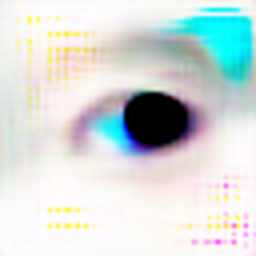

2017-08-27 05:46:06.265892: Step: 3600, Descriminator: 0.038047, Generator: 0.000003, Pass Through: 0.062905
2017-08-27 05:46:19.763556: Step: 3601, Descriminator: 0.073204, Generator: 0.000000, Pass Through: 0.061616
2017-08-27 05:46:33.413312: Step: 3602, Descriminator: 0.041855, Generator: 0.000002, Pass Through: 0.061099
2017-08-27 05:46:38.828826: Step: 3603, Descriminator: 1.341834, Generator: 0.000019, Pass Through: 0.062920
2017-08-27 05:46:52.412540: Step: 3604, Descriminator: 0.066109, Generator: 0.000005, Pass Through: 0.076632
2017-08-27 05:47:06.419809: Step: 3605, Descriminator: 0.057542, Generator: 0.000008, Pass Through: 0.064819
2017-08-27 05:47:20.090053: Step: 3606, Descriminator: 0.058113, Generator: 0.000005, Pass Through: 0.060577
2017-08-27 05:47:33.707059: Step: 3607, Descriminator: 0.050507, Generator: 0.000018, Pass Through: 0.061777
2017-08-27 05:47:47.305915: Step: 3608, Descriminator: 0.048958, Generator: 0.000012, Pass Through: 0.061517
2017-08-27 05:48:00

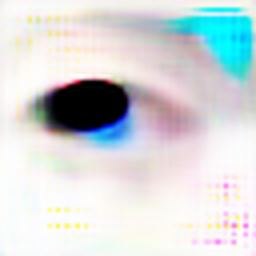

2017-08-27 05:56:40.372039: Step: 3650, Descriminator: 0.034611, Generator: 0.000091, Pass Through: 0.060798
2017-08-27 05:56:45.658148: Step: 3651, Descriminator: 1.264532, Generator: 0.000292, Pass Through: 0.068908
2017-08-27 05:56:59.496766: Step: 3652, Descriminator: 0.090135, Generator: 0.000018, Pass Through: 0.062809
2017-08-27 05:57:13.310931: Step: 3653, Descriminator: 0.067759, Generator: 0.000014, Pass Through: 0.061654
2017-08-27 05:57:26.928185: Step: 3654, Descriminator: 0.063636, Generator: 0.000017, Pass Through: 0.058861
2017-08-27 05:57:40.422192: Step: 3655, Descriminator: 0.050908, Generator: 0.000032, Pass Through: 0.062302
2017-08-27 05:57:54.104540: Step: 3656, Descriminator: 0.117439, Generator: 0.000005, Pass Through: 0.062069
2017-08-27 05:58:07.821900: Step: 3657, Descriminator: 0.046683, Generator: 0.000016, Pass Through: 0.058875
2017-08-27 05:58:21.443524: Step: 3658, Descriminator: 0.035571, Generator: 0.000027, Pass Through: 0.057039
2017-08-27 05:58:26

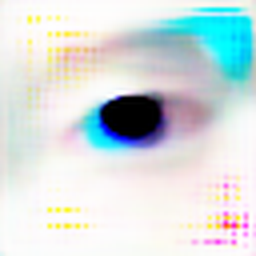

2017-08-27 06:07:08.717801: Step: 3700, Descriminator: 0.065962, Generator: 0.000088, Pass Through: 0.077113
2017-08-27 06:07:22.270790: Step: 3701, Descriminator: 0.065813, Generator: 0.000009, Pass Through: 0.067357
2017-08-27 06:07:35.786912: Step: 3702, Descriminator: 0.048446, Generator: 0.000001, Pass Through: 0.062786
2017-08-27 06:07:49.277501: Step: 3703, Descriminator: 0.048877, Generator: 0.000002, Pass Through: 0.061685
2017-08-27 06:08:03.060229: Step: 3704, Descriminator: 0.043378, Generator: 0.000021, Pass Through: 0.065424
2017-08-27 06:08:16.607283: Step: 3705, Descriminator: 0.044956, Generator: 0.000047, Pass Through: 0.072562
2017-08-27 06:08:30.192817: Step: 3706, Descriminator: 0.031932, Generator: 0.000003, Pass Through: 0.064802
2017-08-27 06:08:35.589241: Step: 3707, Descriminator: 1.195047, Generator: 0.000024, Pass Through: 0.069518
2017-08-27 06:08:49.217200: Step: 3708, Descriminator: 0.060716, Generator: 0.000016, Pass Through: 0.068155
2017-08-27 06:09:03

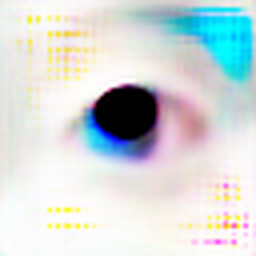

2017-08-27 06:17:43.057703: Step: 3750, Descriminator: 0.067332, Generator: 0.000001, Pass Through: 0.063341
2017-08-27 06:17:56.761437: Step: 3751, Descriminator: 0.054796, Generator: 0.000004, Pass Through: 0.067353
2017-08-27 06:18:10.409575: Step: 3752, Descriminator: 0.056062, Generator: 0.000003, Pass Through: 0.072851
2017-08-27 06:18:24.044718: Step: 3753, Descriminator: 0.046286, Generator: 0.000000, Pass Through: 0.066850
2017-08-27 06:18:37.670339: Step: 3754, Descriminator: 0.039921, Generator: 0.000004, Pass Through: 0.072079
2017-08-27 06:18:43.093719: Step: 3755, Descriminator: 1.188205, Generator: 0.000013, Pass Through: 0.084609
2017-08-27 06:18:56.656816: Step: 3756, Descriminator: 0.065582, Generator: 0.000000, Pass Through: 0.072799
2017-08-27 06:19:10.605597: Step: 3757, Descriminator: 0.071898, Generator: 0.000001, Pass Through: 0.069743
2017-08-27 06:19:24.283187: Step: 3758, Descriminator: 0.060122, Generator: 0.000003, Pass Through: 0.068959
2017-08-27 06:19:37

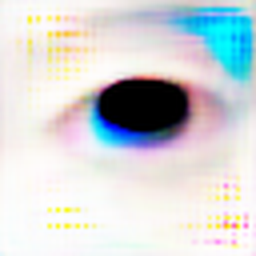

2017-08-27 06:28:14.961549: Step: 3800, Descriminator: 0.047000, Generator: 0.000009, Pass Through: 0.063413
2017-08-27 06:28:28.480197: Step: 3801, Descriminator: 0.036335, Generator: 0.000037, Pass Through: 0.065929
2017-08-27 06:28:42.009433: Step: 3802, Descriminator: 0.036732, Generator: 0.000035, Pass Through: 0.068910
2017-08-27 06:28:47.381001: Step: 3803, Descriminator: 1.368312, Generator: 0.000045, Pass Through: 0.067594
2017-08-27 06:29:01.290857: Step: 3804, Descriminator: 0.063356, Generator: 0.000004, Pass Through: 0.062770
2017-08-27 06:29:14.999001: Step: 3805, Descriminator: 0.064797, Generator: 0.000005, Pass Through: 0.061099
2017-08-27 06:29:28.513775: Step: 3806, Descriminator: 0.047315, Generator: 0.000023, Pass Through: 0.062456
2017-08-27 06:29:42.054806: Step: 3807, Descriminator: 0.045524, Generator: 0.000063, Pass Through: 0.064385
2017-08-27 06:29:55.619768: Step: 3808, Descriminator: 0.039621, Generator: 0.000001, Pass Through: 0.059663
2017-08-27 06:30:09

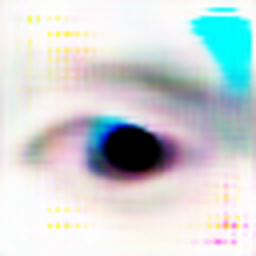

2017-08-27 06:38:46.006042: Step: 3850, Descriminator: 0.042462, Generator: 0.000002, Pass Through: 0.064440
2017-08-27 06:38:51.386288: Step: 3851, Descriminator: 1.103622, Generator: 0.048921, Pass Through: 0.095822
2017-08-27 06:39:05.269717: Step: 3852, Descriminator: 0.085088, Generator: 0.000021, Pass Through: 0.076349
2017-08-27 06:39:18.845755: Step: 3853, Descriminator: 0.103403, Generator: 0.000003, Pass Through: 0.066818
2017-08-27 06:39:32.499992: Step: 3854, Descriminator: 0.072947, Generator: 0.000010, Pass Through: 0.062874
2017-08-27 06:39:45.924006: Step: 3855, Descriminator: 2.442877, Generator: 0.000000, Pass Through: 0.063493
2017-08-27 06:39:59.419275: Step: 3856, Descriminator: 0.220882, Generator: 0.000002, Pass Through: 0.057125
2017-08-27 06:40:13.079638: Step: 3857, Descriminator: 0.076810, Generator: 0.000008, Pass Through: 0.056375
2017-08-27 06:40:26.549332: Step: 3858, Descriminator: 0.070697, Generator: 0.000047, Pass Through: 0.056234
2017-08-27 06:40:31

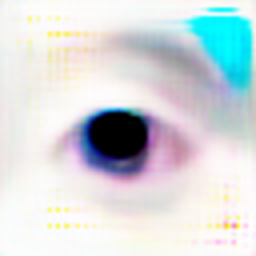

2017-08-27 06:49:13.958918: Step: 3900, Descriminator: 0.071703, Generator: 0.000418, Pass Through: 0.059509
2017-08-27 06:49:27.371687: Step: 3901, Descriminator: 1.793850, Generator: 0.000001, Pass Through: 0.055005
2017-08-27 06:49:40.872186: Step: 3902, Descriminator: 0.138918, Generator: 0.000006, Pass Through: 0.055765
2017-08-27 06:49:54.446304: Step: 3903, Descriminator: 0.176834, Generator: 0.000170, Pass Through: 0.056991
2017-08-27 06:50:09.637724: Step: 3904, Descriminator: 0.067580, Generator: 0.000073, Pass Through: 0.054160
2017-08-27 06:50:23.202792: Step: 3905, Descriminator: 0.055419, Generator: 0.000167, Pass Through: 0.053931
2017-08-27 06:50:36.887049: Step: 3906, Descriminator: 0.058885, Generator: 0.000144, Pass Through: 0.053922
2017-08-27 06:50:42.318529: Step: 3907, Descriminator: 1.108683, Generator: 0.000143, Pass Through: 0.063642
2017-08-27 06:50:55.899249: Step: 3908, Descriminator: 0.075736, Generator: 0.000630, Pass Through: 0.061021
2017-08-27 06:51:09

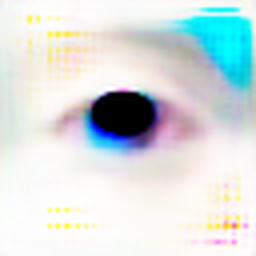

2017-08-27 06:59:57.224659: Step: 3950, Descriminator: 0.041495, Generator: 0.000113, Pass Through: 0.063903
2017-08-27 07:00:10.946381: Step: 3951, Descriminator: 0.028505, Generator: 0.000014, Pass Through: 0.065863
2017-08-27 07:00:24.529215: Step: 3952, Descriminator: 0.033248, Generator: 0.000009, Pass Through: 0.061595
2017-08-27 07:00:39.220382: Step: 3953, Descriminator: 0.024158, Generator: 0.000017, Pass Through: 0.062966
2017-08-27 07:00:52.830821: Step: 3954, Descriminator: 0.022488, Generator: 0.000012, Pass Through: 0.061871
2017-08-27 07:00:58.384841: Step: 3955, Descriminator: 1.455439, Generator: 0.001755, Pass Through: 0.087484
2017-08-27 07:01:12.134350: Step: 3956, Descriminator: 0.051069, Generator: 0.000029, Pass Through: 0.078783
2017-08-27 07:01:25.825693: Step: 3957, Descriminator: 0.052591, Generator: 0.000009, Pass Through: 0.066003
2017-08-27 07:01:40.085145: Step: 3958, Descriminator: 0.053171, Generator: 0.000041, Pass Through: 0.062166
2017-08-27 07:01:55

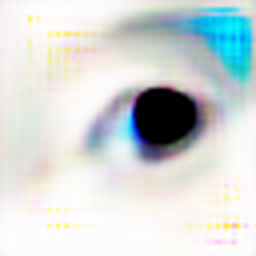

2017-08-27 07:10:40.883559: Step: 4000, Descriminator: 0.062363, Generator: 0.000154, Pass Through: 0.056635
2017-08-27 07:10:54.334765: Step: 4001, Descriminator: 0.048276, Generator: 0.000320, Pass Through: 0.055857
2017-08-27 07:11:09.487148: Step: 4002, Descriminator: 0.035074, Generator: 0.000029, Pass Through: 0.052719
2017-08-27 07:11:14.931025: Step: 4003, Descriminator: 1.133458, Generator: 0.000347, Pass Through: 0.056074
2017-08-27 07:11:28.495485: Step: 4004, Descriminator: 0.078856, Generator: 0.000451, Pass Through: 0.058228
2017-08-27 07:11:42.057275: Step: 4005, Descriminator: 0.072232, Generator: 0.000171, Pass Through: 0.056374
2017-08-27 07:11:55.575948: Step: 4006, Descriminator: 0.055236, Generator: 0.000119, Pass Through: 0.057034
2017-08-27 07:12:09.129213: Step: 4007, Descriminator: 0.054735, Generator: 0.000146, Pass Through: 0.063473
2017-08-27 07:12:23.922766: Step: 4008, Descriminator: 0.047117, Generator: 0.000089, Pass Through: 0.057132
2017-08-27 07:12:37

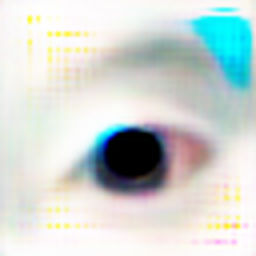

2017-08-27 07:21:23.558490: Step: 4050, Descriminator: 0.043991, Generator: 0.000010, Pass Through: 0.060910
2017-08-27 07:21:28.987471: Step: 4051, Descriminator: 1.143766, Generator: 0.001383, Pass Through: 0.076386
2017-08-27 07:21:42.488864: Step: 4052, Descriminator: 0.079982, Generator: 0.000034, Pass Through: 0.063944
2017-08-27 07:21:56.051710: Step: 4053, Descriminator: 0.062697, Generator: 0.000012, Pass Through: 0.060058
2017-08-27 07:22:09.562769: Step: 4054, Descriminator: 0.101073, Generator: 0.000013, Pass Through: 0.055758
2017-08-27 07:22:23.129530: Step: 4055, Descriminator: 0.059333, Generator: 0.000034, Pass Through: 0.057655
2017-08-27 07:22:37.881047: Step: 4056, Descriminator: 0.047523, Generator: 0.000078, Pass Through: 0.055709
2017-08-27 07:22:51.550188: Step: 4057, Descriminator: 0.041323, Generator: 0.000065, Pass Through: 0.055853
2017-08-27 07:23:05.430889: Step: 4058, Descriminator: 0.038510, Generator: 0.000017, Pass Through: 0.053863
2017-08-27 07:23:10

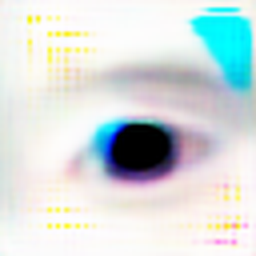

2017-08-27 07:31:49.198212: Step: 4100, Descriminator: 0.068341, Generator: 0.000011, Pass Through: 0.062716
2017-08-27 07:32:02.744921: Step: 4101, Descriminator: 0.067560, Generator: 0.000165, Pass Through: 0.080193
2017-08-27 07:32:16.255591: Step: 4102, Descriminator: 0.059077, Generator: 0.000002, Pass Through: 0.066856
2017-08-27 07:32:29.671679: Step: 4103, Descriminator: 0.049562, Generator: 0.000003, Pass Through: 0.060904
2017-08-27 07:32:43.159486: Step: 4104, Descriminator: 0.062472, Generator: 0.000010, Pass Through: 0.061638
2017-08-27 07:32:56.717483: Step: 4105, Descriminator: 0.055267, Generator: 0.000010, Pass Through: 0.060694
2017-08-27 07:33:10.467419: Step: 4106, Descriminator: 0.052608, Generator: 0.000004, Pass Through: 0.063155
2017-08-27 07:33:15.852696: Step: 4107, Descriminator: 1.156168, Generator: 0.000019, Pass Through: 0.066084
2017-08-27 07:33:29.352959: Step: 4108, Descriminator: 0.058239, Generator: 0.000020, Pass Through: 0.065880
2017-08-27 07:33:42

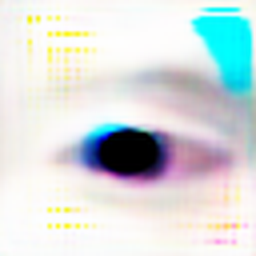

2017-08-27 07:42:18.413178: Step: 4150, Descriminator: 0.053974, Generator: 0.000003, Pass Through: 0.064046
2017-08-27 07:42:31.876908: Step: 4151, Descriminator: 0.045244, Generator: 0.000001, Pass Through: 0.063001
2017-08-27 07:42:45.338074: Step: 4152, Descriminator: 0.042688, Generator: 0.000018, Pass Through: 0.068610
2017-08-27 07:42:58.949947: Step: 4153, Descriminator: 0.047643, Generator: 0.000002, Pass Through: 0.062377
2017-08-27 07:43:12.642662: Step: 4154, Descriminator: 0.031237, Generator: 0.000002, Pass Through: 0.062336
2017-08-27 07:43:18.002659: Step: 4155, Descriminator: 1.356515, Generator: 0.000018, Pass Through: 0.071146
2017-08-27 07:43:31.523528: Step: 4156, Descriminator: 0.059967, Generator: 0.000038, Pass Through: 0.079330
2017-08-27 07:43:44.955759: Step: 4157, Descriminator: 0.045506, Generator: 0.000001, Pass Through: 0.067927
2017-08-27 07:43:58.448537: Step: 4158, Descriminator: 0.045988, Generator: 0.000001, Pass Through: 0.064028
2017-08-27 07:44:11

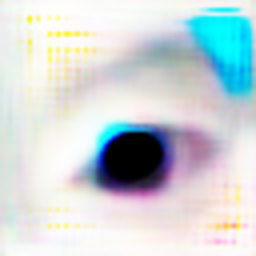

2017-08-27 07:52:46.858661: Step: 4200, Descriminator: 0.047944, Generator: 0.000001, Pass Through: 0.070348
2017-08-27 07:53:00.671862: Step: 4201, Descriminator: 0.058965, Generator: 0.000001, Pass Through: 0.068960
2017-08-27 07:53:14.345456: Step: 4202, Descriminator: 0.074935, Generator: 0.000000, Pass Through: 0.065868
2017-08-27 07:53:19.727262: Step: 4203, Descriminator: 1.269333, Generator: 0.000004, Pass Through: 0.070593
2017-08-27 07:53:33.183380: Step: 4204, Descriminator: 0.064575, Generator: 0.000001, Pass Through: 0.065875
2017-08-27 07:53:46.685485: Step: 4205, Descriminator: 0.067919, Generator: 0.000003, Pass Through: 0.069518
2017-08-27 07:54:00.293673: Step: 4206, Descriminator: 0.049823, Generator: 0.000000, Pass Through: 0.068047
2017-08-27 07:54:13.726947: Step: 4207, Descriminator: 0.055773, Generator: 0.000000, Pass Through: 0.067920
2017-08-27 07:54:27.230803: Step: 4208, Descriminator: 0.044181, Generator: 0.000001, Pass Through: 0.064753
2017-08-27 07:54:40

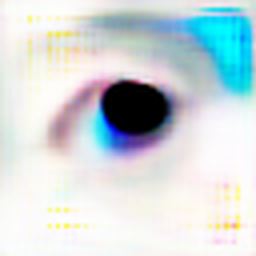

2017-08-27 08:03:19.995677: Step: 4250, Descriminator: 0.037270, Generator: 0.000007, Pass Through: 0.064857
2017-08-27 08:03:25.326617: Step: 4251, Descriminator: 1.236652, Generator: 0.000006, Pass Through: 0.066412
2017-08-27 08:03:38.892124: Step: 4252, Descriminator: 0.070882, Generator: 0.000009, Pass Through: 0.067745
2017-08-27 08:03:52.411180: Step: 4253, Descriminator: 0.072160, Generator: 0.000002, Pass Through: 0.064609
2017-08-27 08:04:05.949126: Step: 4254, Descriminator: 0.052434, Generator: 0.000003, Pass Through: 0.068172
2017-08-27 08:04:19.478160: Step: 4255, Descriminator: 0.052420, Generator: 0.000017, Pass Through: 0.078721
2017-08-27 08:04:33.002507: Step: 4256, Descriminator: 0.050577, Generator: 0.000001, Pass Through: 0.069786
2017-08-27 08:04:46.487686: Step: 4257, Descriminator: 0.048834, Generator: 0.000001, Pass Through: 0.064862
2017-08-27 08:05:00.253631: Step: 4258, Descriminator: 0.047286, Generator: 0.000003, Pass Through: 0.067929
2017-08-27 08:05:05

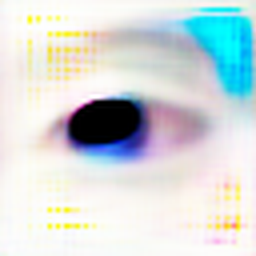

2017-08-27 08:13:42.716945: Step: 4300, Descriminator: 0.070303, Generator: 0.000008, Pass Through: 0.070469
2017-08-27 08:13:56.244673: Step: 4301, Descriminator: 0.060135, Generator: 0.000005, Pass Through: 0.071132
2017-08-27 08:14:09.735818: Step: 4302, Descriminator: 0.051060, Generator: 0.000001, Pass Through: 0.068328
2017-08-27 08:14:23.285702: Step: 4303, Descriminator: 0.048248, Generator: 0.000002, Pass Through: 0.065270
2017-08-27 08:14:36.773258: Step: 4304, Descriminator: 0.043883, Generator: 0.000003, Pass Through: 0.064787
2017-08-27 08:14:50.332641: Step: 4305, Descriminator: 0.045361, Generator: 0.000021, Pass Through: 0.074683
2017-08-27 08:15:04.224767: Step: 4306, Descriminator: 0.046762, Generator: 0.000005, Pass Through: 0.070292
2017-08-27 08:15:09.695766: Step: 4307, Descriminator: 1.137807, Generator: 0.000016, Pass Through: 0.079184
2017-08-27 08:15:23.273860: Step: 4308, Descriminator: 0.070812, Generator: 0.000002, Pass Through: 0.084743
2017-08-27 08:15:36

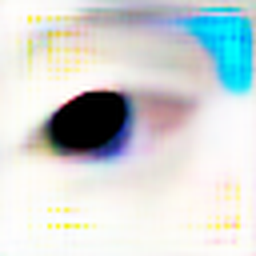

2017-08-27 08:24:16.185043: Step: 4350, Descriminator: 0.053317, Generator: 0.000000, Pass Through: 0.063244
2017-08-27 08:24:29.749866: Step: 4351, Descriminator: 0.053441, Generator: 0.000001, Pass Through: 0.062817
2017-08-27 08:24:43.304361: Step: 4352, Descriminator: 0.052319, Generator: 0.000001, Pass Through: 0.066372
2017-08-27 08:24:56.905997: Step: 4353, Descriminator: 0.039259, Generator: 0.000005, Pass Through: 0.069772
2017-08-27 08:25:10.856965: Step: 4354, Descriminator: 0.033070, Generator: 0.000001, Pass Through: 0.066900
2017-08-27 08:25:16.234091: Step: 4355, Descriminator: 1.324604, Generator: 0.000008, Pass Through: 0.074523
2017-08-27 08:25:29.819048: Step: 4356, Descriminator: 0.064774, Generator: 0.000000, Pass Through: 0.066071
2017-08-27 08:25:43.329796: Step: 4357, Descriminator: 0.062574, Generator: 0.000001, Pass Through: 0.061738
2017-08-27 08:25:56.944814: Step: 4358, Descriminator: 0.044892, Generator: 0.000009, Pass Through: 0.072979
2017-08-27 08:26:10

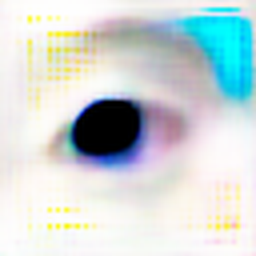

2017-08-27 08:34:49.944518: Step: 4400, Descriminator: 0.054800, Generator: 0.000001, Pass Through: 0.067794
2017-08-27 08:35:03.851340: Step: 4401, Descriminator: 0.053581, Generator: 0.000000, Pass Through: 0.080367
2017-08-27 08:35:17.518929: Step: 4402, Descriminator: 0.045052, Generator: 0.000000, Pass Through: 0.069423
2017-08-27 08:35:22.968137: Step: 4403, Descriminator: 1.161034, Generator: 0.000008, Pass Through: 0.087392
2017-08-27 08:35:36.544552: Step: 4404, Descriminator: 0.064435, Generator: 0.000000, Pass Through: 0.072846
2017-08-27 08:35:50.135819: Step: 4405, Descriminator: 0.056432, Generator: 0.000002, Pass Through: 0.071993
2017-08-27 08:36:03.777455: Step: 4406, Descriminator: 0.053271, Generator: 0.000000, Pass Through: 0.071488
2017-08-27 08:36:17.325352: Step: 4407, Descriminator: 2.491868, Generator: 0.000000, Pass Through: 0.066634
2017-08-27 08:36:30.944200: Step: 4408, Descriminator: 0.136532, Generator: 0.000000, Pass Through: 0.067032
2017-08-27 08:36:44

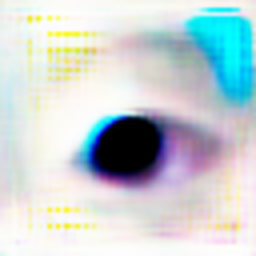

2017-08-27 08:45:24.520154: Step: 4450, Descriminator: 0.031544, Generator: 0.000000, Pass Through: 0.076088
2017-08-27 08:45:29.822845: Step: 4451, Descriminator: 1.490042, Generator: 0.000053, Pass Through: 0.114449
2017-08-27 08:45:43.434628: Step: 4452, Descriminator: 0.088538, Generator: 0.000000, Pass Through: 0.083429
2017-08-27 08:45:57.034731: Step: 4453, Descriminator: 2.330703, Generator: 0.000000, Pass Through: 0.077339
2017-08-27 08:46:10.683475: Step: 4454, Descriminator: 0.127898, Generator: 0.000000, Pass Through: 0.073158
2017-08-27 08:46:24.280085: Step: 4455, Descriminator: 0.078091, Generator: 0.000001, Pass Through: 0.068201
2017-08-27 08:46:37.977024: Step: 4456, Descriminator: 0.088469, Generator: 0.000001, Pass Through: 0.066886
2017-08-27 08:46:51.559221: Step: 4457, Descriminator: 0.060903, Generator: 0.000008, Pass Through: 0.070873
2017-08-27 08:47:05.553687: Step: 4458, Descriminator: 0.058782, Generator: 0.000001, Pass Through: 0.067378
2017-08-27 08:47:10

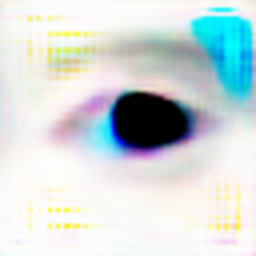

2017-08-27 08:55:51.567241: Step: 4500, Descriminator: 0.043089, Generator: 0.000002, Pass Through: 0.067525
2017-08-27 08:56:05.182002: Step: 4501, Descriminator: 0.043436, Generator: 0.000003, Pass Through: 0.069378
2017-08-27 08:56:18.776252: Step: 4502, Descriminator: 0.036977, Generator: 0.000001, Pass Through: 0.069412
2017-08-27 08:56:32.398354: Step: 4503, Descriminator: 0.042596, Generator: 0.000002, Pass Through: 0.068024
2017-08-27 08:56:46.075811: Step: 4504, Descriminator: 0.028495, Generator: 0.000002, Pass Through: 0.067387
2017-08-27 08:56:59.999148: Step: 4505, Descriminator: 0.024440, Generator: 0.000003, Pass Through: 0.070298
2017-08-27 08:57:13.800207: Step: 4506, Descriminator: 0.024916, Generator: 0.000002, Pass Through: 0.066097
2017-08-27 08:57:19.201714: Step: 4507, Descriminator: 1.492513, Generator: 0.000003, Pass Through: 0.071669
2017-08-27 08:57:32.809476: Step: 4508, Descriminator: 0.070351, Generator: 0.000012, Pass Through: 0.090191
2017-08-27 08:57:46

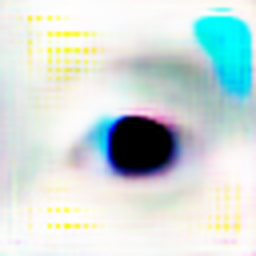

2017-08-27 09:06:31.173493: Step: 4550, Descriminator: 0.064916, Generator: 0.000002, Pass Through: 0.065480
2017-08-27 09:06:44.823817: Step: 4551, Descriminator: 0.057623, Generator: 0.000003, Pass Through: 0.071275
2017-08-27 09:06:58.688919: Step: 4552, Descriminator: 0.070822, Generator: 0.000000, Pass Through: 0.067688
2017-08-27 09:07:12.598621: Step: 4553, Descriminator: 0.041893, Generator: 0.000002, Pass Through: 0.069309
2017-08-27 09:07:26.367511: Step: 4554, Descriminator: 0.046568, Generator: 0.000001, Pass Through: 0.074444
2017-08-27 09:07:31.746067: Step: 4555, Descriminator: 1.310272, Generator: 0.000000, Pass Through: 0.068804
2017-08-27 09:07:45.351307: Step: 4556, Descriminator: 0.073442, Generator: 0.000010, Pass Through: 0.084540
2017-08-27 09:07:59.125504: Step: 4557, Descriminator: 0.049672, Generator: 0.000000, Pass Through: 0.074087
2017-08-27 09:08:12.789433: Step: 4558, Descriminator: 0.045103, Generator: 0.000000, Pass Through: 0.072774
2017-08-27 09:08:26

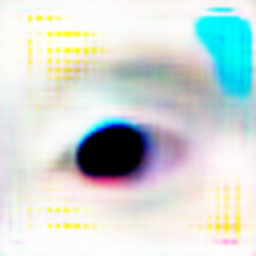

2017-08-27 09:17:13.458497: Step: 4600, Descriminator: 0.054676, Generator: 0.000004, Pass Through: 0.074290
2017-08-27 09:17:27.132074: Step: 4601, Descriminator: 0.051344, Generator: 0.000000, Pass Through: 0.068788
2017-08-27 09:17:40.878308: Step: 4602, Descriminator: 0.045665, Generator: 0.000001, Pass Through: 0.068324
2017-08-27 09:17:46.366077: Step: 4603, Descriminator: 1.086564, Generator: 0.000000, Pass Through: 0.067573
2017-08-27 09:18:00.260454: Step: 4604, Descriminator: 0.084914, Generator: 0.000004, Pass Through: 0.076747
2017-08-27 09:18:13.981219: Step: 4605, Descriminator: 0.080607, Generator: 0.000003, Pass Through: 0.078226
2017-08-27 09:18:27.792766: Step: 4606, Descriminator: 0.056596, Generator: 0.000000, Pass Through: 0.081075
2017-08-27 09:18:41.513310: Step: 4607, Descriminator: 0.055166, Generator: 0.000001, Pass Through: 0.076891
2017-08-27 09:18:55.302218: Step: 4608, Descriminator: 0.062988, Generator: 0.000000, Pass Through: 0.071516
2017-08-27 09:19:09

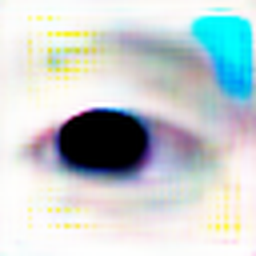

2017-08-27 09:27:53.795745: Step: 4650, Descriminator: 0.049140, Generator: 0.000001, Pass Through: 0.070350
2017-08-27 09:27:59.216330: Step: 4651, Descriminator: 1.178043, Generator: 0.000004, Pass Through: 0.086419
2017-08-27 09:28:12.958067: Step: 4652, Descriminator: 0.063238, Generator: 0.000001, Pass Through: 0.079703
2017-08-27 09:28:26.598515: Step: 4653, Descriminator: 0.063571, Generator: 0.000000, Pass Through: 0.074371
2017-08-27 09:28:40.350994: Step: 4654, Descriminator: 0.054356, Generator: 0.000003, Pass Through: 0.074507
2017-08-27 09:28:54.051171: Step: 4655, Descriminator: 0.063873, Generator: 0.000001, Pass Through: 0.069881
2017-08-27 09:29:08.169719: Step: 4656, Descriminator: 0.048569, Generator: 0.000000, Pass Through: 0.070214
2017-08-27 09:29:21.901094: Step: 4657, Descriminator: 0.043979, Generator: 0.000001, Pass Through: 0.076341
2017-08-27 09:29:35.655782: Step: 4658, Descriminator: 0.037012, Generator: 0.000001, Pass Through: 0.071466
2017-08-27 09:29:41

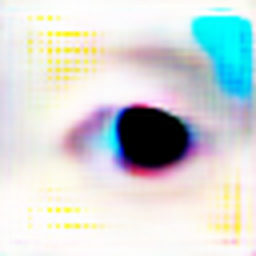

2017-08-27 09:38:27.168658: Step: 4700, Descriminator: 0.068395, Generator: 0.000000, Pass Through: 0.077025
2017-08-27 09:38:40.909797: Step: 4701, Descriminator: 0.073504, Generator: 0.000000, Pass Through: 0.070785
2017-08-27 09:38:54.637967: Step: 4702, Descriminator: 0.056410, Generator: 0.000001, Pass Through: 0.069404
2017-08-27 09:39:08.825247: Step: 4703, Descriminator: 0.053217, Generator: 0.000017, Pass Through: 0.084602
2017-08-27 09:39:22.695945: Step: 4704, Descriminator: 0.043852, Generator: 0.000001, Pass Through: 0.078482
2017-08-27 09:39:36.496041: Step: 4705, Descriminator: 0.047157, Generator: 0.000002, Pass Through: 0.079956
2017-08-27 09:39:50.309556: Step: 4706, Descriminator: 0.031335, Generator: 0.000001, Pass Through: 0.077237
2017-08-27 09:39:55.758307: Step: 4707, Descriminator: 1.305348, Generator: 0.000003, Pass Through: 0.074768
2017-08-27 09:40:09.601997: Step: 4708, Descriminator: 0.055195, Generator: 0.000006, Pass Through: 0.077791
2017-08-27 09:40:23

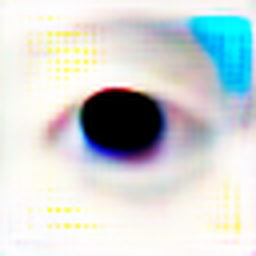

2017-08-27 09:49:11.457502: Step: 4750, Descriminator: 0.053307, Generator: 0.000003, Pass Through: 0.066679
2017-08-27 09:49:25.179472: Step: 4751, Descriminator: 0.042582, Generator: 0.000037, Pass Through: 0.075391
2017-08-27 09:49:38.979303: Step: 4752, Descriminator: 0.046114, Generator: 0.000020, Pass Through: 0.070413
2017-08-27 09:49:52.694181: Step: 4753, Descriminator: 0.033137, Generator: 0.000002, Pass Through: 0.066381
2017-08-27 09:50:06.508878: Step: 4754, Descriminator: 0.042042, Generator: 0.000016, Pass Through: 0.062965
2017-08-27 09:50:11.941686: Step: 4755, Descriminator: 1.292413, Generator: 0.000024, Pass Through: 0.091828
2017-08-27 09:50:25.837053: Step: 4756, Descriminator: 0.062438, Generator: 0.000002, Pass Through: 0.070051
2017-08-27 09:50:39.587945: Step: 4757, Descriminator: 0.051552, Generator: 0.000003, Pass Through: 0.065997
2017-08-27 09:50:53.296426: Step: 4758, Descriminator: 0.061271, Generator: 0.000230, Pass Through: 0.084373
2017-08-27 09:51:07

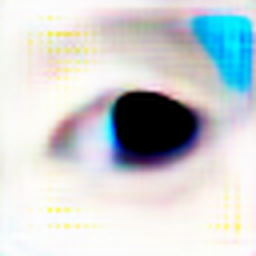

2017-08-27 09:59:56.506362: Step: 4800, Descriminator: 0.041074, Generator: 0.000012, Pass Through: 0.063735
2017-08-27 10:00:10.424315: Step: 4801, Descriminator: 0.028605, Generator: 0.000005, Pass Through: 0.063433
2017-08-27 10:00:24.171641: Step: 4802, Descriminator: 0.036592, Generator: 0.000002, Pass Through: 0.062912
2017-08-27 10:00:29.645070: Step: 4803, Descriminator: 1.475749, Generator: 0.000060, Pass Through: 0.078799
2017-08-27 10:00:43.545156: Step: 4804, Descriminator: 0.060811, Generator: 0.000004, Pass Through: 0.069382
2017-08-27 10:00:57.422800: Step: 4805, Descriminator: 0.050941, Generator: 0.000006, Pass Through: 0.067515
2017-08-27 10:01:11.592831: Step: 4806, Descriminator: 0.058720, Generator: 0.000001, Pass Through: 0.061791
2017-08-27 10:01:25.437017: Step: 4807, Descriminator: 0.054769, Generator: 0.000001, Pass Through: 0.064094
2017-08-27 10:01:39.818916: Step: 4808, Descriminator: 0.044438, Generator: 0.000002, Pass Through: 0.067719
2017-08-27 10:01:53

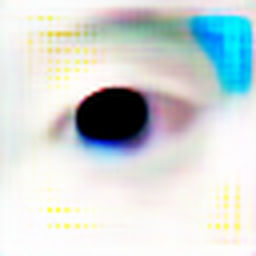

2017-08-27 10:10:43.290602: Step: 4850, Descriminator: 0.057767, Generator: 0.000000, Pass Through: 0.065653
2017-08-27 10:10:48.715905: Step: 4851, Descriminator: 1.428141, Generator: 0.000004, Pass Through: 0.071386
2017-08-27 10:11:02.887410: Step: 4852, Descriminator: 0.069655, Generator: 0.000006, Pass Through: 0.076037
2017-08-27 10:11:16.935557: Step: 4853, Descriminator: 0.063241, Generator: 0.000000, Pass Through: 0.065596
2017-08-27 10:11:30.802020: Step: 4854, Descriminator: 0.069553, Generator: 0.000000, Pass Through: 0.063910
2017-08-27 10:11:44.596181: Step: 4855, Descriminator: 0.054378, Generator: 0.000008, Pass Through: 0.074413
2017-08-27 10:11:58.511977: Step: 4856, Descriminator: 0.046693, Generator: 0.000003, Pass Through: 0.067677
2017-08-27 10:12:12.396139: Step: 4857, Descriminator: 0.043262, Generator: 0.000001, Pass Through: 0.065204
2017-08-27 10:12:26.295583: Step: 4858, Descriminator: 0.037599, Generator: 0.000003, Pass Through: 0.068621
2017-08-27 10:12:31

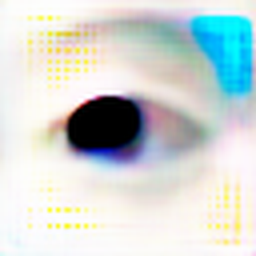

2017-08-27 10:21:23.321104: Step: 4900, Descriminator: 0.067401, Generator: 0.000002, Pass Through: 0.069950
2017-08-27 10:21:37.234039: Step: 4901, Descriminator: 0.062649, Generator: 0.000001, Pass Through: 0.064911
2017-08-27 10:21:51.114545: Step: 4902, Descriminator: 0.056772, Generator: 0.000007, Pass Through: 0.070285
2017-08-27 10:22:05.127855: Step: 4903, Descriminator: 0.054484, Generator: 0.000001, Pass Through: 0.065580
2017-08-27 10:22:18.906238: Step: 4904, Descriminator: 0.047691, Generator: 0.000005, Pass Through: 0.068295
2017-08-27 10:22:32.894570: Step: 4905, Descriminator: 0.078440, Generator: 0.000000, Pass Through: 0.063943
2017-08-27 10:22:46.841763: Step: 4906, Descriminator: 0.044680, Generator: 0.000001, Pass Through: 0.064675
2017-08-27 10:22:52.446260: Step: 4907, Descriminator: 1.260856, Generator: 0.000000, Pass Through: 0.062377
2017-08-27 10:23:06.603569: Step: 4908, Descriminator: 0.061683, Generator: 0.000004, Pass Through: 0.066569
2017-08-27 10:23:20

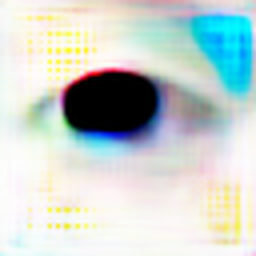

2017-08-27 10:32:13.440273: Step: 4950, Descriminator: 0.050681, Generator: 0.000002, Pass Through: 0.072353
2017-08-27 10:32:27.353969: Step: 4951, Descriminator: 0.051170, Generator: 0.000002, Pass Through: 0.073862
2017-08-27 10:32:41.377738: Step: 4952, Descriminator: 0.051890, Generator: 0.000001, Pass Through: 0.072636
2017-08-27 10:32:55.251144: Step: 4953, Descriminator: 0.043274, Generator: 0.000001, Pass Through: 0.068791
2017-08-27 10:33:09.630223: Step: 4954, Descriminator: 0.044311, Generator: 0.000002, Pass Through: 0.077023
2017-08-27 10:33:15.249758: Step: 4955, Descriminator: 1.309955, Generator: 0.000006, Pass Through: 0.095242
2017-08-27 10:33:29.157253: Step: 4956, Descriminator: 0.085658, Generator: 0.000000, Pass Through: 0.077982
2017-08-27 10:33:43.119287: Step: 4957, Descriminator: 0.062465, Generator: 0.000001, Pass Through: 0.073738
2017-08-27 10:33:57.158234: Step: 4958, Descriminator: 0.056027, Generator: 0.000001, Pass Through: 0.070879
2017-08-27 10:34:11

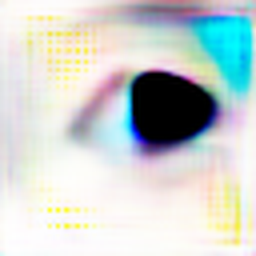

2017-08-27 10:43:05.915846: Step: 5000, Descriminator: 0.052739, Generator: 0.000007, Pass Through: 0.077327
2017-08-27 10:43:20.012159: Step: 5001, Descriminator: 0.043927, Generator: 0.000000, Pass Through: 0.072470
2017-08-27 10:43:33.868827: Step: 5002, Descriminator: 0.048133, Generator: 0.000002, Pass Through: 0.070256
2017-08-27 10:43:39.460837: Step: 5003, Descriminator: 1.264333, Generator: 0.000003, Pass Through: 0.077106
2017-08-27 10:43:53.456233: Step: 5004, Descriminator: 0.080745, Generator: 0.000015, Pass Through: 0.088500
2017-08-27 10:44:07.457318: Step: 5005, Descriminator: 2.714471, Generator: 0.000000, Pass Through: 0.074668
2017-08-27 10:44:21.450403: Step: 5006, Descriminator: 0.122507, Generator: 0.000000, Pass Through: 0.068090
2017-08-27 10:44:35.488410: Step: 5007, Descriminator: 0.098129, Generator: 0.000001, Pass Through: 0.065786
2017-08-27 10:44:49.529336: Step: 5008, Descriminator: 0.067730, Generator: 0.000002, Pass Through: 0.068651
2017-08-27 10:45:03

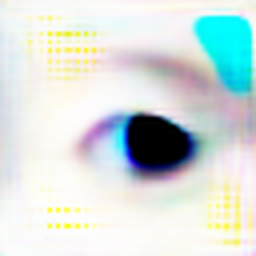

2017-08-27 10:54:00.059177: Step: 5050, Descriminator: 0.033398, Generator: 0.000003, Pass Through: 0.069944
2017-08-27 10:54:05.576584: Step: 5051, Descriminator: 0.561331, Generator: 0.000001, Pass Through: 0.069394
2017-08-27 10:54:19.522711: Step: 5052, Descriminator: 0.078707, Generator: 0.000000, Pass Through: 0.068023
2017-08-27 10:54:33.506240: Step: 5053, Descriminator: 0.055769, Generator: 0.000001, Pass Through: 0.065965
2017-08-27 10:54:47.467257: Step: 5054, Descriminator: 0.036685, Generator: 0.000002, Pass Through: 0.067961
2017-08-27 10:55:01.893115: Step: 5055, Descriminator: 0.042204, Generator: 0.000004, Pass Through: 0.068212
2017-08-27 10:55:16.047665: Step: 5056, Descriminator: 0.029036, Generator: 0.000005, Pass Through: 0.075073
2017-08-27 10:55:30.073734: Step: 5057, Descriminator: 0.022772, Generator: 0.000000, Pass Through: 0.069370
2017-08-27 10:55:44.041554: Step: 5058, Descriminator: 0.020500, Generator: 0.000001, Pass Through: 0.069261
2017-08-27 10:55:49

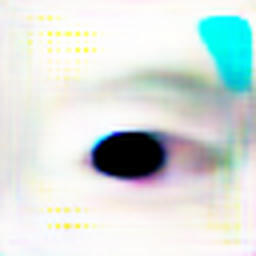

2017-08-27 11:04:51.547054: Step: 5100, Descriminator: 0.073243, Generator: 0.000002, Pass Through: 0.063124
2017-08-27 11:05:06.022403: Step: 5101, Descriminator: 0.080109, Generator: 0.000001, Pass Through: 0.064534
2017-08-27 11:05:20.073890: Step: 5102, Descriminator: 0.060708, Generator: 0.000005, Pass Through: 0.071267
2017-08-27 11:05:34.136714: Step: 5103, Descriminator: 0.056866, Generator: 0.000001, Pass Through: 0.062717
2017-08-27 11:05:48.147825: Step: 5104, Descriminator: 0.066188, Generator: 0.000008, Pass Through: 0.077414
2017-08-27 11:06:02.482331: Step: 5105, Descriminator: 0.051332, Generator: 0.000000, Pass Through: 0.066847
2017-08-27 11:06:16.554316: Step: 5106, Descriminator: 0.052651, Generator: 0.000004, Pass Through: 0.071277
2017-08-27 11:06:22.159975: Step: 5107, Descriminator: 1.375911, Generator: 0.000000, Pass Through: 0.066057
2017-08-27 11:06:36.208314: Step: 5108, Descriminator: 0.083165, Generator: 0.000001, Pass Through: 0.065315
2017-08-27 11:06:50

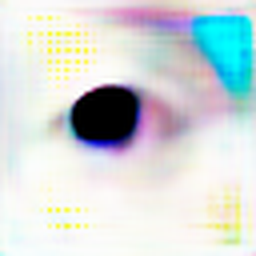

2017-08-27 11:15:49.426798: Step: 5150, Descriminator: 0.059562, Generator: 0.000000, Pass Through: 0.065905
2017-08-27 11:16:03.444449: Step: 5151, Descriminator: 0.047551, Generator: 0.000002, Pass Through: 0.067501
2017-08-27 11:16:17.641789: Step: 5152, Descriminator: 0.047917, Generator: 0.000001, Pass Through: 0.078454
2017-08-27 11:16:31.700816: Step: 5153, Descriminator: 0.052412, Generator: 0.000001, Pass Through: 0.070733
2017-08-27 11:16:45.878997: Step: 5154, Descriminator: 0.044204, Generator: 0.000001, Pass Through: 0.070930
2017-08-27 11:16:51.520728: Step: 5155, Descriminator: 1.330833, Generator: 0.000009, Pass Through: 0.090475
2017-08-27 11:17:06.183739: Step: 5156, Descriminator: 0.065454, Generator: 0.000000, Pass Through: 0.074035
2017-08-27 11:17:20.319079: Step: 5157, Descriminator: 0.074102, Generator: 0.000001, Pass Through: 0.071614
2017-08-27 11:17:34.561293: Step: 5158, Descriminator: 0.062168, Generator: 0.000002, Pass Through: 0.071503
2017-08-27 11:17:48

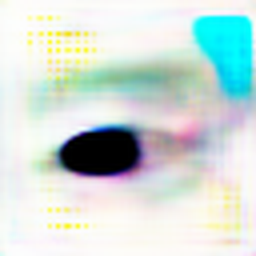

2017-08-27 11:26:48.278731: Step: 5200, Descriminator: 0.052832, Generator: 0.000001, Pass Through: 0.073203
2017-08-27 11:27:02.799063: Step: 5201, Descriminator: 0.058793, Generator: 0.000002, Pass Through: 0.076694
2017-08-27 11:27:17.007847: Step: 5202, Descriminator: 0.054140, Generator: 0.000001, Pass Through: 0.075392
2017-08-27 11:27:22.610028: Step: 5203, Descriminator: 1.164584, Generator: 0.000004, Pass Through: 0.089935
2017-08-27 11:27:36.627765: Step: 5204, Descriminator: 0.073805, Generator: 0.000000, Pass Through: 0.079197
2017-08-27 11:27:50.795978: Step: 5205, Descriminator: 0.067749, Generator: 0.000001, Pass Through: 0.074240
2017-08-27 11:28:04.799675: Step: 5206, Descriminator: 0.062843, Generator: 0.000003, Pass Through: 0.081166
2017-08-27 11:28:18.990261: Step: 5207, Descriminator: 0.062862, Generator: 0.000001, Pass Through: 0.074821
2017-08-27 11:28:33.111794: Step: 5208, Descriminator: 0.050990, Generator: 0.000006, Pass Through: 0.094070
2017-08-27 11:28:47

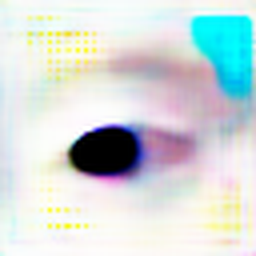

2017-08-27 11:37:48.279971: Step: 5250, Descriminator: 0.036390, Generator: 0.000001, Pass Through: 0.072966
2017-08-27 11:37:53.900207: Step: 5251, Descriminator: 1.305177, Generator: 0.000052, Pass Through: 0.103252
2017-08-27 11:38:08.008994: Step: 5252, Descriminator: 0.057807, Generator: 0.000000, Pass Through: 0.081006
2017-08-27 11:38:22.203126: Step: 5253, Descriminator: 0.076749, Generator: 0.000001, Pass Through: 0.077343
2017-08-27 11:38:36.301300: Step: 5254, Descriminator: 0.041807, Generator: 0.000003, Pass Through: 0.072556
2017-08-27 11:38:50.548067: Step: 5255, Descriminator: 0.046864, Generator: 0.000001, Pass Through: 0.078717
2017-08-27 11:39:05.156580: Step: 5256, Descriminator: 0.032264, Generator: 0.000000, Pass Through: 0.070529
2017-08-27 11:39:19.440164: Step: 5257, Descriminator: 0.028264, Generator: 0.000002, Pass Through: 0.071006
2017-08-27 11:39:33.662035: Step: 5258, Descriminator: 0.026077, Generator: 0.000008, Pass Through: 0.076742
2017-08-27 11:39:39

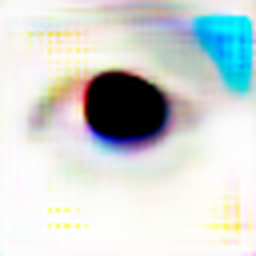

2017-08-27 11:48:40.813423: Step: 5300, Descriminator: 0.057834, Generator: 0.000016, Pass Through: 0.063040
2017-08-27 11:48:54.985656: Step: 5301, Descriminator: 0.069685, Generator: 0.000018, Pass Through: 0.062123
2017-08-27 11:49:09.646863: Step: 5302, Descriminator: 0.048508, Generator: 0.000148, Pass Through: 0.062842
2017-08-27 11:49:23.891040: Step: 5303, Descriminator: 0.066203, Generator: 0.000008, Pass Through: 0.060555
2017-08-27 11:49:38.115487: Step: 5304, Descriminator: 0.066894, Generator: 0.000026, Pass Through: 0.059482
2017-08-27 11:49:52.327674: Step: 5305, Descriminator: 0.045030, Generator: 0.000057, Pass Through: 0.064240
2017-08-27 11:50:06.606769: Step: 5306, Descriminator: 0.044974, Generator: 0.000024, Pass Through: 0.061501
2017-08-27 11:50:12.268718: Step: 5307, Descriminator: 1.285446, Generator: 0.000118, Pass Through: 0.066210
2017-08-27 11:50:26.555466: Step: 5308, Descriminator: 0.072087, Generator: 0.000017, Pass Through: 0.063613
2017-08-27 11:50:40

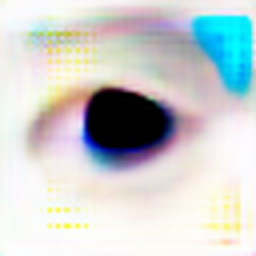

2017-08-27 11:59:42.831295: Step: 5350, Descriminator: 0.044312, Generator: 0.000002, Pass Through: 0.060668
2017-08-27 11:59:57.671465: Step: 5351, Descriminator: 0.036802, Generator: 0.000006, Pass Through: 0.064796
2017-08-27 12:00:12.037831: Step: 5352, Descriminator: 0.043802, Generator: 0.000002, Pass Through: 0.061127
2017-08-27 12:00:26.417229: Step: 5353, Descriminator: 0.033909, Generator: 0.000004, Pass Through: 0.060824
2017-08-27 12:00:40.680460: Step: 5354, Descriminator: 0.034593, Generator: 0.000034, Pass Through: 0.070647
2017-08-27 12:00:46.297717: Step: 5355, Descriminator: 1.446053, Generator: 0.000006, Pass Through: 0.068571
2017-08-27 12:01:00.697491: Step: 5356, Descriminator: 0.061807, Generator: 0.000025, Pass Through: 0.072154
2017-08-27 12:01:15.095832: Step: 5357, Descriminator: 0.061214, Generator: 0.000008, Pass Through: 0.066204
2017-08-27 12:01:29.513452: Step: 5358, Descriminator: 0.055022, Generator: 0.000004, Pass Through: 0.064292
2017-08-27 12:01:44

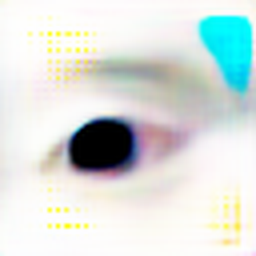

2017-08-27 12:10:49.241574: Step: 5400, Descriminator: 0.047176, Generator: 0.000006, Pass Through: 0.057149
2017-08-27 12:11:03.807783: Step: 5401, Descriminator: 0.049774, Generator: 0.001009, Pass Through: 0.081372
2017-08-27 12:11:18.169078: Step: 5402, Descriminator: 0.038469, Generator: 0.000001, Pass Through: 0.065344
2017-08-27 12:11:23.780418: Step: 5403, Descriminator: 1.233489, Generator: 0.000170, Pass Through: 0.063614
2017-08-27 12:11:38.045617: Step: 5404, Descriminator: 0.077444, Generator: 0.000003, Pass Through: 0.059998
2017-08-27 12:11:52.243693: Step: 5405, Descriminator: 0.052069, Generator: 0.000030, Pass Through: 0.059966
2017-08-27 12:12:06.572132: Step: 5406, Descriminator: 0.053404, Generator: 0.000029, Pass Through: 0.059093
2017-08-27 12:12:20.679322: Step: 5407, Descriminator: 0.053352, Generator: 0.000064, Pass Through: 0.058223
2017-08-27 12:12:34.914472: Step: 5408, Descriminator: 0.050244, Generator: 0.000049, Pass Through: 0.055804
2017-08-27 12:12:49

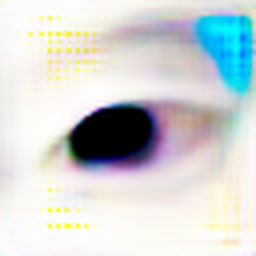

2017-08-27 12:21:55.533350: Step: 5450, Descriminator: 0.028089, Generator: 0.000002, Pass Through: 0.060448
2017-08-27 12:22:01.109976: Step: 5451, Descriminator: 1.499839, Generator: 0.000015, Pass Through: 0.064923
2017-08-27 12:22:15.351110: Step: 5452, Descriminator: 0.066236, Generator: 0.000023, Pass Through: 0.071465
2017-08-27 12:22:29.530204: Step: 5453, Descriminator: 0.054397, Generator: 0.000002, Pass Through: 0.062871
2017-08-27 12:22:43.785998: Step: 5454, Descriminator: 0.062961, Generator: 0.000003, Pass Through: 0.062064
2017-08-27 12:22:58.216107: Step: 5455, Descriminator: 0.053453, Generator: 0.000005, Pass Through: 0.063514
2017-08-27 12:23:12.622384: Step: 5456, Descriminator: 0.044876, Generator: 0.000001, Pass Through: 0.063346
2017-08-27 12:23:26.937441: Step: 5457, Descriminator: 0.045635, Generator: 0.000001, Pass Through: 0.059475
2017-08-27 12:23:41.184974: Step: 5458, Descriminator: 0.031772, Generator: 0.000002, Pass Through: 0.060837
2017-08-27 12:23:46

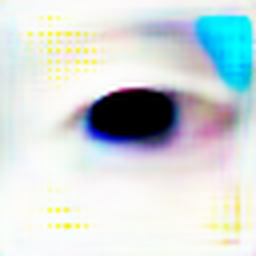

2017-08-27 12:32:51.058619: Step: 5500, Descriminator: 0.066347, Generator: 0.000001, Pass Through: 0.064333
2017-08-27 12:33:05.619482: Step: 5501, Descriminator: 0.052999, Generator: 0.000003, Pass Through: 0.064330
2017-08-27 12:33:19.974655: Step: 5502, Descriminator: 0.058714, Generator: 0.000000, Pass Through: 0.062225
2017-08-27 12:33:34.180275: Step: 5503, Descriminator: 0.059139, Generator: 0.000002, Pass Through: 0.063699
2017-08-27 12:33:48.381365: Step: 5504, Descriminator: 0.054492, Generator: 0.000001, Pass Through: 0.061738
2017-08-27 12:34:02.752163: Step: 5505, Descriminator: 0.047393, Generator: 0.000001, Pass Through: 0.061450
2017-08-27 12:34:17.000986: Step: 5506, Descriminator: 0.039901, Generator: 0.000001, Pass Through: 0.065636
2017-08-27 12:34:22.607828: Step: 5507, Descriminator: 1.254172, Generator: 0.000001, Pass Through: 0.067583
2017-08-27 12:34:36.895778: Step: 5508, Descriminator: 0.066586, Generator: 0.000008, Pass Through: 0.082489
2017-08-27 12:34:51

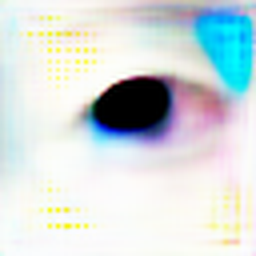

2017-08-27 12:43:57.276640: Step: 5550, Descriminator: 0.047859, Generator: 0.000004, Pass Through: 0.064629
2017-08-27 12:44:11.554902: Step: 5551, Descriminator: 0.045036, Generator: 0.000002, Pass Through: 0.062625
2017-08-27 12:44:25.856629: Step: 5552, Descriminator: 0.041769, Generator: 0.000001, Pass Through: 0.067293
2017-08-27 12:44:40.094578: Step: 5553, Descriminator: 0.043483, Generator: 0.000001, Pass Through: 0.062233
2017-08-27 12:44:54.305904: Step: 5554, Descriminator: 0.037581, Generator: 0.000001, Pass Through: 0.060412
2017-08-27 12:45:00.280239: Step: 5555, Descriminator: 1.298419, Generator: 0.000002, Pass Through: 0.063956
2017-08-27 12:45:14.701960: Step: 5556, Descriminator: 0.068849, Generator: 0.000029, Pass Through: 0.085856
2017-08-27 12:45:28.953579: Step: 5557, Descriminator: 1.995005, Generator: 0.000000, Pass Through: 0.066858
2017-08-27 12:45:43.236005: Step: 5558, Descriminator: 0.176829, Generator: 0.000000, Pass Through: 0.061270
2017-08-27 12:45:57

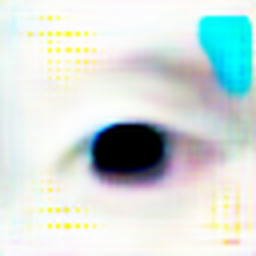

2017-08-27 12:55:04.049687: Step: 5600, Descriminator: 0.060851, Generator: 0.000001, Pass Through: 0.065213
2017-08-27 12:55:18.433184: Step: 5601, Descriminator: 0.050742, Generator: 0.000000, Pass Through: 0.062493
2017-08-27 12:55:32.748459: Step: 5602, Descriminator: 0.043864, Generator: 0.000002, Pass Through: 0.066780
2017-08-27 12:55:38.292728: Step: 5603, Descriminator: 0.690831, Generator: 0.000001, Pass Through: 0.066419
2017-08-27 12:55:52.700005: Step: 5604, Descriminator: 0.065241, Generator: 0.000000, Pass Through: 0.065887
2017-08-27 12:56:06.964582: Step: 5605, Descriminator: 0.045624, Generator: 0.000003, Pass Through: 0.069319
2017-08-27 12:56:21.193524: Step: 5606, Descriminator: 0.035559, Generator: 0.000002, Pass Through: 0.068231
2017-08-27 12:56:35.464080: Step: 5607, Descriminator: 0.043704, Generator: 0.000001, Pass Through: 0.065156
2017-08-27 12:56:49.792244: Step: 5608, Descriminator: 0.037657, Generator: 0.000000, Pass Through: 0.064553
2017-08-27 12:57:04

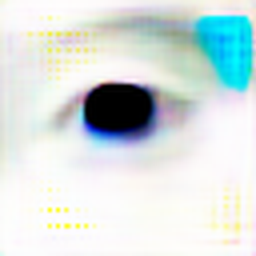

2017-08-27 13:06:15.863513: Step: 5650, Descriminator: 0.219963, Generator: 0.000001, Pass Through: 0.058172
2017-08-27 13:06:21.471510: Step: 5651, Descriminator: 1.269052, Generator: 0.000001, Pass Through: 0.057578
2017-08-27 13:06:35.872584: Step: 5652, Descriminator: 0.104312, Generator: 0.000002, Pass Through: 0.057898
2017-08-27 13:06:50.163998: Step: 5653, Descriminator: 0.080083, Generator: 0.000010, Pass Through: 0.075995
2017-08-27 13:07:04.837983: Step: 5654, Descriminator: 0.082581, Generator: 0.000001, Pass Through: 0.059279
2017-08-27 13:07:19.358053: Step: 5655, Descriminator: 0.062475, Generator: 0.000001, Pass Through: 0.057503
2017-08-27 13:07:33.658711: Step: 5656, Descriminator: 0.052935, Generator: 0.000000, Pass Through: 0.058186
2017-08-27 13:07:47.963912: Step: 5657, Descriminator: 0.078282, Generator: 0.000002, Pass Through: 0.058083
2017-08-27 13:08:02.296066: Step: 5658, Descriminator: 0.049187, Generator: 0.000001, Pass Through: 0.059512
2017-08-27 13:08:07

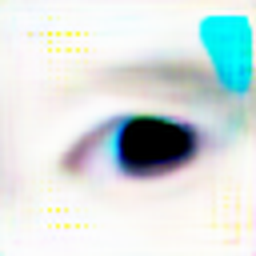

2017-08-27 13:17:17.318475: Step: 5700, Descriminator: 0.116259, Generator: 0.000000, Pass Through: 0.058290
2017-08-27 13:17:31.708510: Step: 5701, Descriminator: 0.089860, Generator: 0.000000, Pass Through: 0.057058
2017-08-27 13:17:46.066366: Step: 5702, Descriminator: 0.065338, Generator: 0.000000, Pass Through: 0.056037
2017-08-27 13:18:00.416020: Step: 5703, Descriminator: 0.067279, Generator: 0.000002, Pass Through: 0.059334
2017-08-27 13:18:14.750738: Step: 5704, Descriminator: 0.055123, Generator: 0.000000, Pass Through: 0.059424
2017-08-27 13:18:29.127619: Step: 5705, Descriminator: 0.061734, Generator: 0.000001, Pass Through: 0.058883
2017-08-27 13:18:43.517493: Step: 5706, Descriminator: 0.041948, Generator: 0.000001, Pass Through: 0.055421
2017-08-27 13:18:49.231184: Step: 5707, Descriminator: 1.206059, Generator: 0.000003, Pass Through: 0.067310
2017-08-27 13:19:03.933037: Step: 5708, Descriminator: 0.082461, Generator: 0.000000, Pass Through: 0.061066
2017-08-27 13:19:18

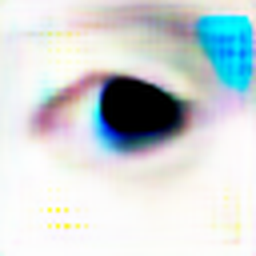

2017-08-27 13:28:27.093934: Step: 5750, Descriminator: 0.064861, Generator: 0.000005, Pass Through: 0.058627
2017-08-27 13:28:41.454512: Step: 5751, Descriminator: 0.058967, Generator: 0.000001, Pass Through: 0.057020
2017-08-27 13:28:55.774614: Step: 5752, Descriminator: 0.053781, Generator: 0.000001, Pass Through: 0.056626
2017-08-27 13:29:10.559385: Step: 5753, Descriminator: 0.048891, Generator: 0.000001, Pass Through: 0.056540
2017-08-27 13:29:24.892379: Step: 5754, Descriminator: 0.043717, Generator: 0.000004, Pass Through: 0.062231
2017-08-27 13:29:30.680270: Step: 5755, Descriminator: 1.415560, Generator: 0.000000, Pass Through: 0.058514
2017-08-27 13:29:44.921435: Step: 5756, Descriminator: 0.076605, Generator: 0.000001, Pass Through: 0.057595
2017-08-27 13:29:59.208633: Step: 5757, Descriminator: 0.078073, Generator: 0.000005, Pass Through: 0.064447
2017-08-27 13:30:13.510345: Step: 5758, Descriminator: 0.058616, Generator: 0.000000, Pass Through: 0.057559
2017-08-27 13:30:27

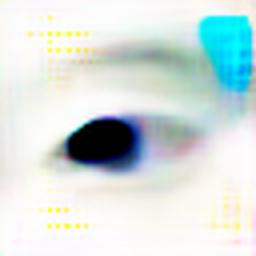

2017-08-27 13:39:38.968631: Step: 5800, Descriminator: 0.043476, Generator: 0.000000, Pass Through: 0.057514
2017-08-27 13:39:53.285606: Step: 5801, Descriminator: 0.035272, Generator: 0.000008, Pass Through: 0.064101
2017-08-27 13:40:07.798312: Step: 5802, Descriminator: 0.043569, Generator: 0.000003, Pass Through: 0.060136
2017-08-27 13:40:13.427204: Step: 5803, Descriminator: 1.253787, Generator: 0.000099, Pass Through: 0.090166
2017-08-27 13:40:27.819300: Step: 5804, Descriminator: 0.077627, Generator: 0.000000, Pass Through: 0.070446
2017-08-27 13:40:42.211979: Step: 5805, Descriminator: 0.059024, Generator: 0.000003, Pass Through: 0.064802
2017-08-27 13:40:56.843296: Step: 5806, Descriminator: 0.040864, Generator: 0.000001, Pass Through: 0.060984
2017-08-27 13:41:11.462399: Step: 5807, Descriminator: 0.039995, Generator: 0.000001, Pass Through: 0.073494
2017-08-27 13:41:25.964708: Step: 5808, Descriminator: 0.039561, Generator: 0.000001, Pass Through: 0.063556
2017-08-27 13:41:40

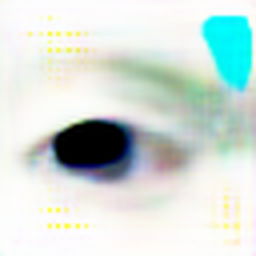

2017-08-27 13:50:49.236294: Step: 5850, Descriminator: 0.041228, Generator: 0.000001, Pass Through: 0.055512
2017-08-27 13:50:55.040557: Step: 5851, Descriminator: 1.417468, Generator: 0.000001, Pass Through: 0.062284
2017-08-27 13:51:09.788601: Step: 5852, Descriminator: 0.077897, Generator: 0.000005, Pass Through: 0.061788
2017-08-27 13:51:24.310019: Step: 5853, Descriminator: 0.078481, Generator: 0.000000, Pass Through: 0.053335
2017-08-27 13:51:38.638563: Step: 5854, Descriminator: 0.069363, Generator: 0.000002, Pass Through: 0.055997
2017-08-27 13:51:52.990258: Step: 5855, Descriminator: 0.047663, Generator: 0.000001, Pass Through: 0.054499
2017-08-27 13:52:07.527103: Step: 5856, Descriminator: 0.038565, Generator: 0.000002, Pass Through: 0.054709
2017-08-27 13:52:21.765001: Step: 5857, Descriminator: 0.043118, Generator: 0.000001, Pass Through: 0.053906
2017-08-27 13:52:36.179219: Step: 5858, Descriminator: 0.036199, Generator: 0.000024, Pass Through: 0.073451
2017-08-27 13:52:41

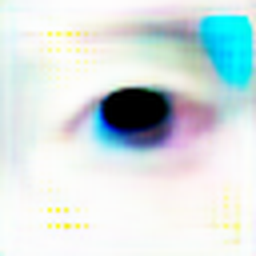

2017-08-27 14:01:53.291834: Step: 5900, Descriminator: 0.083080, Generator: 0.000001, Pass Through: 0.065110
2017-08-27 14:02:07.665162: Step: 5901, Descriminator: 0.071356, Generator: 0.000000, Pass Through: 0.058099
2017-08-27 14:02:22.117551: Step: 5902, Descriminator: 0.062148, Generator: 0.000000, Pass Through: 0.053715
2017-08-27 14:02:36.495134: Step: 5903, Descriminator: 0.071819, Generator: 0.000001, Pass Through: 0.055375
2017-08-27 14:02:50.876119: Step: 5904, Descriminator: 0.054077, Generator: 0.000001, Pass Through: 0.057990
2017-08-27 14:03:05.654155: Step: 5905, Descriminator: 0.048603, Generator: 0.000000, Pass Through: 0.054706
2017-08-27 14:03:20.221845: Step: 5906, Descriminator: 0.033333, Generator: 0.000002, Pass Through: 0.061201
2017-08-27 14:03:26.054072: Step: 5907, Descriminator: 1.343505, Generator: 0.000000, Pass Through: 0.056575
2017-08-27 14:03:40.281754: Step: 5908, Descriminator: 0.070302, Generator: 0.000000, Pass Through: 0.054925
2017-08-27 14:03:54

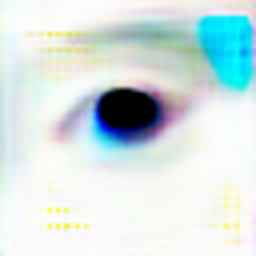

2017-08-27 14:13:11.155449: Step: 5950, Descriminator: 0.068853, Generator: 0.000000, Pass Through: 0.056517
2017-08-27 14:13:25.741265: Step: 5951, Descriminator: 0.049190, Generator: 0.000000, Pass Through: 0.058749
2017-08-27 14:13:40.408638: Step: 5952, Descriminator: 0.054240, Generator: 0.000000, Pass Through: 0.056903
2017-08-27 14:13:54.839943: Step: 5953, Descriminator: 0.044056, Generator: 0.000003, Pass Through: 0.070279
2017-08-27 14:14:09.336682: Step: 5954, Descriminator: 0.038603, Generator: 0.000000, Pass Through: 0.062306
2017-08-27 14:14:15.062953: Step: 5955, Descriminator: 1.256432, Generator: 0.000000, Pass Through: 0.064074
2017-08-27 14:14:29.478941: Step: 5956, Descriminator: 0.063590, Generator: 0.000001, Pass Through: 0.061405
2017-08-27 14:14:43.872412: Step: 5957, Descriminator: 0.063960, Generator: 0.000001, Pass Through: 0.061423
2017-08-27 14:14:58.509697: Step: 5958, Descriminator: 0.065695, Generator: 0.000002, Pass Through: 0.065825
2017-08-27 14:15:13

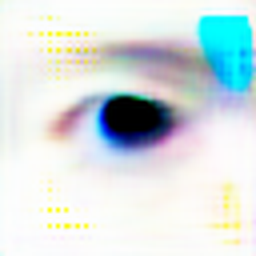

2017-08-27 14:24:31.940211: Step: 6000, Descriminator: 0.035442, Generator: 0.000000, Pass Through: 0.062523
2017-08-27 14:24:46.489999: Step: 6001, Descriminator: 0.039119, Generator: 0.000002, Pass Through: 0.063325
2017-08-27 14:25:01.440462: Step: 6002, Descriminator: 0.028995, Generator: 0.000000, Pass Through: 0.061604
2017-08-27 14:25:07.280981: Step: 6003, Descriminator: 1.334816, Generator: 0.000001, Pass Through: 0.063606
2017-08-27 14:25:21.870916: Step: 6004, Descriminator: 0.061798, Generator: 0.000006, Pass Through: 0.068936
2017-08-27 14:25:36.397507: Step: 6005, Descriminator: 0.093844, Generator: 0.000000, Pass Through: 0.058913
2017-08-27 14:25:50.910513: Step: 6006, Descriminator: 0.061261, Generator: 0.000000, Pass Through: 0.057037
2017-08-27 14:26:05.420195: Step: 6007, Descriminator: 0.066031, Generator: 0.000001, Pass Through: 0.058407
2017-08-27 14:26:19.927157: Step: 6008, Descriminator: 0.049513, Generator: 0.000001, Pass Through: 0.059916
2017-08-27 14:26:34

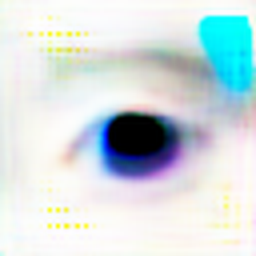

2017-08-27 14:35:53.456687: Step: 6050, Descriminator: 0.040211, Generator: 0.000004, Pass Through: 0.078432
2017-08-27 14:35:59.300025: Step: 6051, Descriminator: 1.396064, Generator: 0.000001, Pass Through: 0.064986
2017-08-27 14:36:13.841120: Step: 6052, Descriminator: 0.068167, Generator: 0.000001, Pass Through: 0.063421
2017-08-27 14:36:28.523247: Step: 6053, Descriminator: 0.073367, Generator: 0.000001, Pass Through: 0.061120
2017-08-27 14:36:43.030034: Step: 6054, Descriminator: 0.055868, Generator: 0.000000, Pass Through: 0.065702
2017-08-27 14:36:57.866686: Step: 6055, Descriminator: 0.046464, Generator: 0.000000, Pass Through: 0.060586
2017-08-27 14:37:12.709105: Step: 6056, Descriminator: 0.047696, Generator: 0.000000, Pass Through: 0.065189
2017-08-27 14:37:27.266433: Step: 6057, Descriminator: 0.050610, Generator: 0.000000, Pass Through: 0.058888
2017-08-27 14:37:41.889991: Step: 6058, Descriminator: 0.039955, Generator: 0.000001, Pass Through: 0.060395
2017-08-27 14:37:47

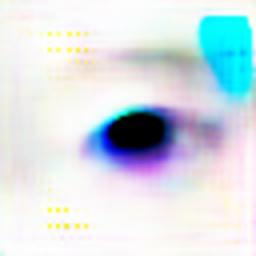

2017-08-27 14:47:09.716123: Step: 6100, Descriminator: 0.099987, Generator: 0.000000, Pass Through: 0.069030
2017-08-27 14:47:24.469606: Step: 6101, Descriminator: 0.075658, Generator: 0.000002, Pass Through: 0.069782
2017-08-27 14:47:39.146843: Step: 6102, Descriminator: 0.050374, Generator: 0.000000, Pass Through: 0.064385
2017-08-27 14:47:53.901401: Step: 6103, Descriminator: 0.046817, Generator: 0.000000, Pass Through: 0.063090
2017-08-27 14:48:08.467480: Step: 6104, Descriminator: 0.052804, Generator: 0.000000, Pass Through: 0.060484
2017-08-27 14:48:23.013454: Step: 6105, Descriminator: 0.039032, Generator: 0.000002, Pass Through: 0.066352
2017-08-27 14:48:37.538544: Step: 6106, Descriminator: 0.032728, Generator: 0.000001, Pass Through: 0.061599
2017-08-27 14:48:43.319319: Step: 6107, Descriminator: 1.309937, Generator: 0.000002, Pass Through: 0.071673
2017-08-27 14:48:58.042723: Step: 6108, Descriminator: 0.085744, Generator: 0.000000, Pass Through: 0.064107
2017-08-27 14:49:12

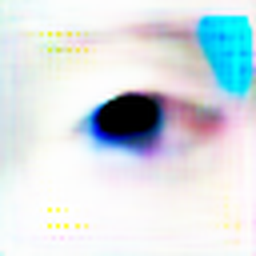

2017-08-27 14:58:30.204614: Step: 6150, Descriminator: 0.060415, Generator: 0.000001, Pass Through: 0.065396
2017-08-27 14:58:44.651569: Step: 6151, Descriminator: 0.050596, Generator: 0.000002, Pass Through: 0.063120
2017-08-27 14:58:59.629530: Step: 6152, Descriminator: 0.051820, Generator: 0.000000, Pass Through: 0.060899
2017-08-27 14:59:14.374287: Step: 6153, Descriminator: 0.047484, Generator: 0.000002, Pass Through: 0.066674
2017-08-27 14:59:28.945214: Step: 6154, Descriminator: 0.033808, Generator: 0.000000, Pass Through: 0.061914
2017-08-27 14:59:34.698017: Step: 6155, Descriminator: 0.578597, Generator: 0.000000, Pass Through: 0.060544
2017-08-27 14:59:49.892029: Step: 6156, Descriminator: 0.044460, Generator: 0.000001, Pass Through: 0.062276
2017-08-27 15:00:04.793406: Step: 6157, Descriminator: 0.042793, Generator: 0.000003, Pass Through: 0.071424
2017-08-27 15:00:19.418331: Step: 6158, Descriminator: 0.039841, Generator: 0.000000, Pass Through: 0.060196
2017-08-27 15:00:34

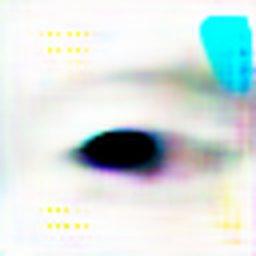

2017-08-27 15:09:58.329395: Step: 6200, Descriminator: 0.030950, Generator: 0.000000, Pass Through: 0.058659
2017-08-27 15:10:13.020981: Step: 6201, Descriminator: 2.426500, Generator: 0.000000, Pass Through: 0.056192
2017-08-27 15:10:27.741968: Step: 6202, Descriminator: 0.241999, Generator: 0.000000, Pass Through: 0.058372
2017-08-27 15:10:33.543263: Step: 6203, Descriminator: 1.490377, Generator: 0.000000, Pass Through: 0.070106
2017-08-27 15:10:48.235136: Step: 6204, Descriminator: 0.111440, Generator: 0.000000, Pass Through: 0.063452
2017-08-27 15:11:03.333538: Step: 6205, Descriminator: 0.077839, Generator: 0.000000, Pass Through: 0.058610
2017-08-27 15:11:18.072177: Step: 6206, Descriminator: 0.065024, Generator: 0.000002, Pass Through: 0.066465
2017-08-27 15:11:32.754843: Step: 6207, Descriminator: 0.071566, Generator: 0.000000, Pass Through: 0.061039
2017-08-27 15:11:47.388866: Step: 6208, Descriminator: 0.054958, Generator: 0.000000, Pass Through: 0.057417
2017-08-27 15:12:02

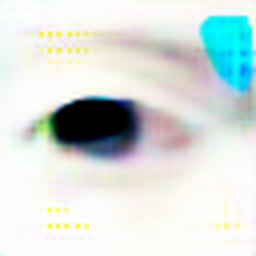

2017-08-27 15:21:23.675571: Step: 6250, Descriminator: 0.067105, Generator: 0.000002, Pass Through: 0.052700
2017-08-27 15:21:29.506678: Step: 6251, Descriminator: 1.227225, Generator: 0.000000, Pass Through: 0.054192
2017-08-27 15:21:44.205677: Step: 6252, Descriminator: 0.092517, Generator: 0.000001, Pass Through: 0.055536
2017-08-27 15:21:59.031583: Step: 6253, Descriminator: 0.074041, Generator: 0.000001, Pass Through: 0.058037
2017-08-27 15:22:13.734036: Step: 6254, Descriminator: 0.077866, Generator: 0.000004, Pass Through: 0.059053
2017-08-27 15:22:28.381423: Step: 6255, Descriminator: 0.066459, Generator: 0.000000, Pass Through: 0.052497
2017-08-27 15:22:43.052903: Step: 6256, Descriminator: 0.064618, Generator: 0.000000, Pass Through: 0.057950
2017-08-27 15:22:57.932501: Step: 6257, Descriminator: 0.048464, Generator: 0.000002, Pass Through: 0.057893
2017-08-27 15:23:12.854948: Step: 6258, Descriminator: 0.038998, Generator: 0.000001, Pass Through: 0.055492
2017-08-27 15:23:18

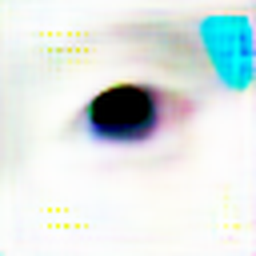

2017-08-27 15:33:10.588750: Step: 6300, Descriminator: 0.082023, Generator: 0.000001, Pass Through: 0.055995
2017-08-27 15:33:25.698921: Step: 6301, Descriminator: 0.090747, Generator: 0.000005, Pass Through: 0.057907
2017-08-27 15:33:40.671320: Step: 6302, Descriminator: 0.056298, Generator: 0.000000, Pass Through: 0.054928
2017-08-27 15:33:55.566102: Step: 6303, Descriminator: 0.055831, Generator: 0.000006, Pass Through: 0.059852
2017-08-27 15:34:10.299516: Step: 6304, Descriminator: 0.051711, Generator: 0.000001, Pass Through: 0.052499
2017-08-27 15:34:24.966796: Step: 6305, Descriminator: 0.050703, Generator: 0.000011, Pass Through: 0.061720
2017-08-27 15:34:39.609798: Step: 6306, Descriminator: 0.040915, Generator: 0.000002, Pass Through: 0.056632
2017-08-27 15:34:45.399228: Step: 6307, Descriminator: 1.430632, Generator: 0.000000, Pass Through: 0.057752
2017-08-27 15:35:00.467714: Step: 6308, Descriminator: 0.090720, Generator: 0.000005, Pass Through: 0.060158
2017-08-27 15:35:15

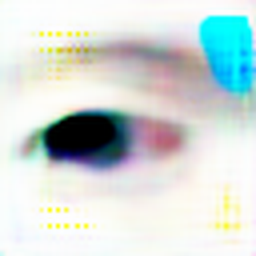

2017-08-27 15:44:42.684795: Step: 6350, Descriminator: 0.057418, Generator: 0.000001, Pass Through: 0.059258
2017-08-27 15:44:57.414831: Step: 6351, Descriminator: 0.054179, Generator: 0.000005, Pass Through: 0.069663
2017-08-27 15:45:12.238684: Step: 6352, Descriminator: 0.102605, Generator: 0.000000, Pass Through: 0.060968
2017-08-27 15:45:27.445094: Step: 6353, Descriminator: 0.028883, Generator: 0.000000, Pass Through: 0.058671
2017-08-27 15:45:42.330109: Step: 6354, Descriminator: 0.029589, Generator: 0.000000, Pass Through: 0.060818
2017-08-27 15:45:48.146434: Step: 6355, Descriminator: 1.359308, Generator: 0.000000, Pass Through: 0.064953
2017-08-27 15:46:02.927243: Step: 6356, Descriminator: 0.057336, Generator: 0.000000, Pass Through: 0.060057
2017-08-27 15:46:17.668810: Step: 6357, Descriminator: 0.056065, Generator: 0.000001, Pass Through: 0.061806
2017-08-27 15:46:32.523609: Step: 6358, Descriminator: 0.051696, Generator: 0.000001, Pass Through: 0.061695
2017-08-27 15:46:47

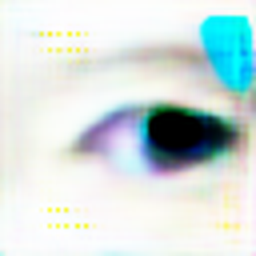

2017-08-27 15:56:36.387863: Step: 6400, Descriminator: 0.050838, Generator: 0.000001, Pass Through: 0.063382
2017-08-27 15:56:51.781632: Step: 6401, Descriminator: 0.051136, Generator: 0.000000, Pass Through: 0.058817
2017-08-27 15:57:07.890028: Step: 6402, Descriminator: 0.043237, Generator: 0.000000, Pass Through: 0.069939
2017-08-27 15:57:14.194802: Step: 6403, Descriminator: 1.168074, Generator: 0.000000, Pass Through: 0.063214
2017-08-27 15:57:29.619164: Step: 6404, Descriminator: 0.076359, Generator: 0.000002, Pass Through: 0.061375
2017-08-27 15:57:45.081786: Step: 6405, Descriminator: 0.069661, Generator: 0.000000, Pass Through: 0.059197
2017-08-27 15:58:00.597628: Step: 6406, Descriminator: 0.064339, Generator: 0.000001, Pass Through: 0.056953
2017-08-27 15:58:16.319785: Step: 6407, Descriminator: 0.054234, Generator: 0.000002, Pass Through: 0.062967
2017-08-27 15:58:31.731926: Step: 6408, Descriminator: 0.048999, Generator: 0.000001, Pass Through: 0.058210
2017-08-27 15:58:47

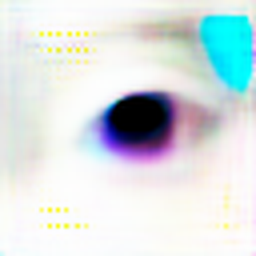

2017-08-27 16:08:46.318840: Step: 6450, Descriminator: 0.030922, Generator: 0.000001, Pass Through: 0.061551
2017-08-27 16:08:52.612848: Step: 6451, Descriminator: 1.216124, Generator: 0.000001, Pass Through: 0.058341
2017-08-27 16:09:08.470773: Step: 6452, Descriminator: 0.057994, Generator: 0.000001, Pass Through: 0.056985
2017-08-27 16:09:24.195966: Step: 6453, Descriminator: 0.062722, Generator: 0.000003, Pass Through: 0.059593
2017-08-27 16:09:39.530257: Step: 6454, Descriminator: 0.061985, Generator: 0.000001, Pass Through: 0.060021
2017-08-27 16:09:54.955396: Step: 6455, Descriminator: 0.056777, Generator: 0.000002, Pass Through: 0.056767
2017-08-27 16:10:10.687706: Step: 6456, Descriminator: 0.050954, Generator: 0.000004, Pass Through: 0.063607
2017-08-27 16:10:26.099215: Step: 6457, Descriminator: 0.042981, Generator: 0.000001, Pass Through: 0.056933
2017-08-27 16:10:41.775845: Step: 6458, Descriminator: 0.045629, Generator: 0.000003, Pass Through: 0.062319
2017-08-27 16:10:47

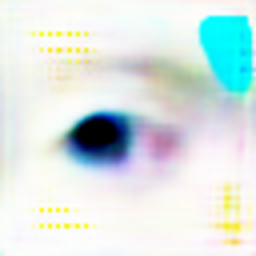

2017-08-27 16:20:46.912914: Step: 6500, Descriminator: 0.065630, Generator: 0.000001, Pass Through: 0.063904
2017-08-27 16:21:03.053518: Step: 6501, Descriminator: 0.048909, Generator: 0.000001, Pass Through: 0.060311
2017-08-27 16:21:18.745374: Step: 6502, Descriminator: 0.047282, Generator: 0.000001, Pass Through: 0.060211
2017-08-27 16:21:34.089747: Step: 6503, Descriminator: 0.044201, Generator: 0.000008, Pass Through: 0.075410
2017-08-27 16:21:49.508228: Step: 6504, Descriminator: 0.050556, Generator: 0.000000, Pass Through: 0.061749
2017-08-27 16:22:05.244120: Step: 6505, Descriminator: 0.040021, Generator: 0.000001, Pass Through: 0.061060
2017-08-27 16:22:20.572165: Step: 6506, Descriminator: 0.037385, Generator: 0.000001, Pass Through: 0.062862
2017-08-27 16:22:26.848013: Step: 6507, Descriminator: 1.283722, Generator: 0.000003, Pass Through: 0.071497
2017-08-27 16:22:42.492245: Step: 6508, Descriminator: 0.067053, Generator: 0.000002, Pass Through: 0.066628
2017-08-27 16:22:58

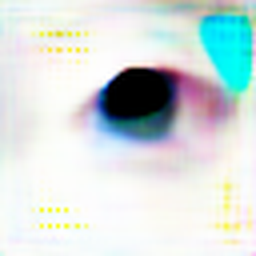

2017-08-27 16:33:00.991651: Step: 6550, Descriminator: 0.061076, Generator: 0.000001, Pass Through: 0.064159
2017-08-27 16:33:16.950375: Step: 6551, Descriminator: 0.054941, Generator: 0.000001, Pass Through: 0.061200
2017-08-27 16:33:32.754046: Step: 6552, Descriminator: 0.051560, Generator: 0.000001, Pass Through: 0.068283
2017-08-27 16:33:48.412597: Step: 6553, Descriminator: 0.038392, Generator: 0.000000, Pass Through: 0.062339
2017-08-27 16:34:04.202415: Step: 6554, Descriminator: 0.037551, Generator: 0.000002, Pass Through: 0.068301
2017-08-27 16:34:10.545233: Step: 6555, Descriminator: 1.317637, Generator: 0.000000, Pass Through: 0.061861
2017-08-27 16:34:26.243868: Step: 6556, Descriminator: 0.053856, Generator: 0.000002, Pass Through: 0.070024
2017-08-27 16:34:41.974137: Step: 6557, Descriminator: 0.050138, Generator: 0.000001, Pass Through: 0.063987
2017-08-27 16:34:57.938456: Step: 6558, Descriminator: 0.050199, Generator: 0.000004, Pass Through: 0.074338
2017-08-27 16:35:13

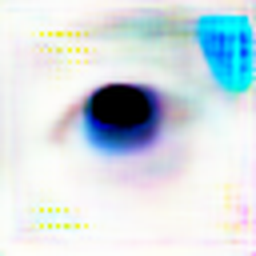

2017-08-27 16:45:15.238772: Step: 6600, Descriminator: 0.045240, Generator: 0.000000, Pass Through: 0.063461
2017-08-27 16:45:30.891560: Step: 6601, Descriminator: 0.038776, Generator: 0.000000, Pass Through: 0.064245
2017-08-27 16:45:46.187084: Step: 6602, Descriminator: 0.029601, Generator: 0.000000, Pass Through: 0.061555
2017-08-27 16:45:52.467328: Step: 6603, Descriminator: 1.213656, Generator: 0.000000, Pass Through: 0.066466
2017-08-27 16:46:07.766458: Step: 6604, Descriminator: 0.068338, Generator: 0.000006, Pass Through: 0.083477
2017-08-27 16:46:23.492826: Step: 6605, Descriminator: 0.057211, Generator: 0.000000, Pass Through: 0.068807
2017-08-27 16:46:38.909111: Step: 6606, Descriminator: 0.049514, Generator: 0.000000, Pass Through: 0.063751
2017-08-27 16:46:54.605465: Step: 6607, Descriminator: 0.045781, Generator: 0.000004, Pass Through: 0.076001
2017-08-27 16:47:10.776182: Step: 6608, Descriminator: 0.038660, Generator: 0.000000, Pass Through: 0.062193
2017-08-27 16:47:26

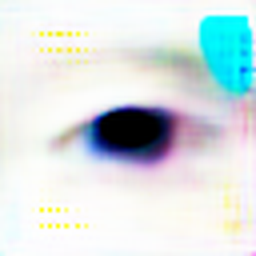

2017-08-27 16:57:30.330731: Step: 6650, Descriminator: 0.039119, Generator: 0.000002, Pass Through: 0.070297
2017-08-27 16:57:36.585364: Step: 6651, Descriminator: 1.208959, Generator: 0.000033, Pass Through: 0.091761
2017-08-27 16:57:52.254564: Step: 6652, Descriminator: 0.073949, Generator: 0.000002, Pass Through: 0.075628
2017-08-27 16:58:08.002959: Step: 6653, Descriminator: 0.053962, Generator: 0.000000, Pass Through: 0.068154
2017-08-27 16:58:23.694725: Step: 6654, Descriminator: 0.046972, Generator: 0.000002, Pass Through: 0.070104
2017-08-27 16:58:39.681289: Step: 6655, Descriminator: 0.049886, Generator: 0.000001, Pass Through: 0.068245
2017-08-27 16:58:55.391058: Step: 6656, Descriminator: 0.036955, Generator: 0.000002, Pass Through: 0.067014
2017-08-27 16:59:11.970201: Step: 6657, Descriminator: 0.132200, Generator: 0.000000, Pass Through: 0.063479
2017-08-27 16:59:27.701964: Step: 6658, Descriminator: 0.033582, Generator: 0.000000, Pass Through: 0.064181
2017-08-27 16:59:33

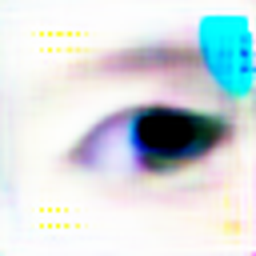

2017-08-27 17:09:41.544727: Step: 6700, Descriminator: 0.086715, Generator: 0.000000, Pass Through: 0.068605
2017-08-27 17:09:57.437469: Step: 6701, Descriminator: 0.061751, Generator: 0.000001, Pass Through: 0.065390
2017-08-27 17:10:13.242730: Step: 6702, Descriminator: 0.052399, Generator: 0.000001, Pass Through: 0.065452
2017-08-27 17:10:28.951646: Step: 6703, Descriminator: 0.050135, Generator: 0.000001, Pass Through: 0.067995
2017-08-27 17:10:44.626894: Step: 6704, Descriminator: 0.047237, Generator: 0.000001, Pass Through: 0.060780
2017-08-27 17:11:00.734090: Step: 6705, Descriminator: 0.030427, Generator: 0.000003, Pass Through: 0.070529
2017-08-27 17:11:16.516343: Step: 6706, Descriminator: 0.035324, Generator: 0.000003, Pass Through: 0.065931
2017-08-27 17:11:22.805925: Step: 6707, Descriminator: 0.759037, Generator: 0.000000, Pass Through: 0.061144
2017-08-27 17:11:38.512272: Step: 6708, Descriminator: 0.060038, Generator: 0.000001, Pass Through: 0.061100
2017-08-27 17:11:53

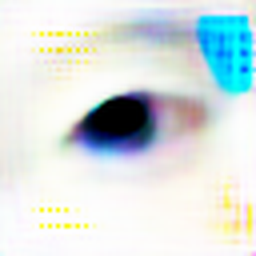

2017-08-27 17:21:55.974602: Step: 6750, Descriminator: 0.046196, Generator: 0.000004, Pass Through: 0.066475
2017-08-27 17:22:11.673563: Step: 6751, Descriminator: 0.045207, Generator: 0.000000, Pass Through: 0.063778
2017-08-27 17:22:27.353402: Step: 6752, Descriminator: 0.047915, Generator: 0.000001, Pass Through: 0.063861
2017-08-27 17:22:43.050904: Step: 6753, Descriminator: 2.318033, Generator: 0.000000, Pass Through: 0.060661
2017-08-27 17:22:59.213963: Step: 6754, Descriminator: 0.208251, Generator: 0.000000, Pass Through: 0.060718
2017-08-27 17:23:05.621900: Step: 6755, Descriminator: 1.388956, Generator: 0.000000, Pass Through: 0.060643
2017-08-27 17:23:21.308053: Step: 6756, Descriminator: 0.085407, Generator: 0.000001, Pass Through: 0.058998
2017-08-27 17:23:36.985825: Step: 6757, Descriminator: 0.096772, Generator: 0.000000, Pass Through: 0.057747
2017-08-27 17:23:52.726335: Step: 6758, Descriminator: 0.083644, Generator: 0.000010, Pass Through: 0.061242
2017-08-27 17:24:08

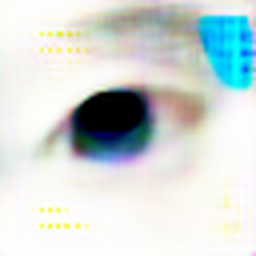

2017-08-27 17:33:56.964316: Step: 6800, Descriminator: 0.118851, Generator: 0.000001, Pass Through: 0.057781
2017-08-27 17:34:11.982746: Step: 6801, Descriminator: 0.078759, Generator: 0.000001, Pass Through: 0.054089
2017-08-27 17:34:27.042394: Step: 6802, Descriminator: 0.058909, Generator: 0.000001, Pass Through: 0.053873
2017-08-27 17:34:33.101841: Step: 6803, Descriminator: 1.393283, Generator: 0.000001, Pass Through: 0.059168
2017-08-27 17:34:48.195624: Step: 6804, Descriminator: 0.132050, Generator: 0.000001, Pass Through: 0.057086
2017-08-27 17:35:03.725756: Step: 6805, Descriminator: 0.096564, Generator: 0.000003, Pass Through: 0.052072
2017-08-27 17:35:18.883061: Step: 6806, Descriminator: 0.095582, Generator: 0.000003, Pass Through: 0.053648
2017-08-27 17:35:34.021935: Step: 6807, Descriminator: 0.070468, Generator: 0.000001, Pass Through: 0.053193
2017-08-27 17:35:49.173054: Step: 6808, Descriminator: 0.069662, Generator: 0.000004, Pass Through: 0.055101
2017-08-27 17:36:04

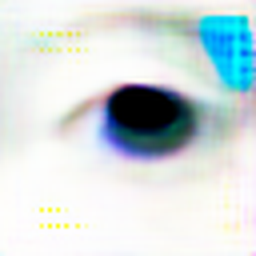

2017-08-27 17:45:42.951085: Step: 6850, Descriminator: 0.051976, Generator: 0.000000, Pass Through: 0.054503
2017-08-27 17:45:48.865245: Step: 6851, Descriminator: 1.217542, Generator: 0.000000, Pass Through: 0.052893
2017-08-27 17:46:04.107124: Step: 6852, Descriminator: 0.084732, Generator: 0.000001, Pass Through: 0.057651
2017-08-27 17:46:19.225290: Step: 6853, Descriminator: 0.075870, Generator: 0.000001, Pass Through: 0.059116
2017-08-27 17:46:34.427480: Step: 6854, Descriminator: 0.073254, Generator: 0.000001, Pass Through: 0.065609
2017-08-27 17:46:49.591264: Step: 6855, Descriminator: 0.065296, Generator: 0.000000, Pass Through: 0.061637
2017-08-27 17:47:05.092350: Step: 6856, Descriminator: 0.052831, Generator: 0.000004, Pass Through: 0.073041
2017-08-27 17:47:20.185285: Step: 6857, Descriminator: 0.041686, Generator: 0.000000, Pass Through: 0.061529
2017-08-27 17:47:35.292100: Step: 6858, Descriminator: 0.040319, Generator: 0.000000, Pass Through: 0.057042
2017-08-27 17:47:41

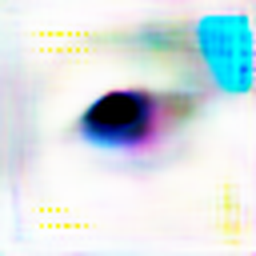

2017-08-27 17:57:23.526509: Step: 6900, Descriminator: 0.048711, Generator: 0.000000, Pass Through: 0.070637
2017-08-27 17:57:38.541497: Step: 6901, Descriminator: 0.053410, Generator: 0.000000, Pass Through: 0.066815
2017-08-27 17:57:53.637368: Step: 6902, Descriminator: 0.045201, Generator: 0.000001, Pass Through: 0.069546
2017-08-27 17:58:08.891905: Step: 6903, Descriminator: 0.035574, Generator: 0.000001, Pass Through: 0.068943
2017-08-27 17:58:24.027481: Step: 6904, Descriminator: 0.033415, Generator: 0.000002, Pass Through: 0.075052
2017-08-27 17:58:39.209342: Step: 6905, Descriminator: 0.038029, Generator: 0.000001, Pass Through: 0.069165
2017-08-27 17:58:54.314415: Step: 6906, Descriminator: 0.052135, Generator: 0.000000, Pass Through: 0.063688
2017-08-27 17:59:00.733761: Step: 6907, Descriminator: 1.366899, Generator: 0.000000, Pass Through: 0.065722
2017-08-27 17:59:15.897011: Step: 6908, Descriminator: 0.085658, Generator: 0.000000, Pass Through: 0.062927
2017-08-27 17:59:30

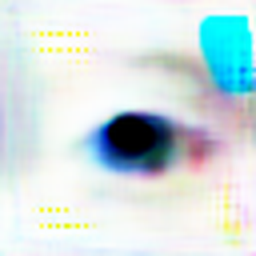

2017-08-27 18:09:10.006961: Step: 6950, Descriminator: 0.060578, Generator: 0.000001, Pass Through: 0.065075
2017-08-27 18:09:24.980743: Step: 6951, Descriminator: 0.052074, Generator: 0.000001, Pass Through: 0.065478
2017-08-27 18:09:40.064212: Step: 6952, Descriminator: 0.044239, Generator: 0.000000, Pass Through: 0.072868
2017-08-27 18:09:55.125790: Step: 6953, Descriminator: 0.041338, Generator: 0.000000, Pass Through: 0.067382
2017-08-27 18:10:10.218611: Step: 6954, Descriminator: 0.041963, Generator: 0.000000, Pass Through: 0.065447
2017-08-27 18:10:16.083196: Step: 6955, Descriminator: 1.282598, Generator: 0.000002, Pass Through: 0.077573
2017-08-27 18:10:31.206611: Step: 6956, Descriminator: 0.060752, Generator: 0.000000, Pass Through: 0.068248
2017-08-27 18:10:46.193462: Step: 6957, Descriminator: 0.071913, Generator: 0.000001, Pass Through: 0.072511
2017-08-27 18:11:01.679191: Step: 6958, Descriminator: 0.058243, Generator: 0.000001, Pass Through: 0.068046
2017-08-27 18:11:16

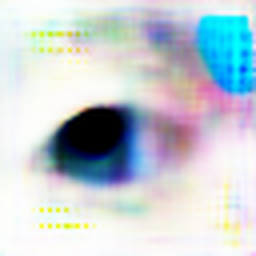

2017-08-27 18:20:51.672653: Step: 7000, Descriminator: 0.049211, Generator: 0.000000, Pass Through: 0.065171
2017-08-27 18:21:07.252650: Step: 7001, Descriminator: 0.056093, Generator: 0.000001, Pass Through: 0.070331
2017-08-27 18:21:22.334212: Step: 7002, Descriminator: 0.031594, Generator: 0.000001, Pass Through: 0.077067
2017-08-27 18:21:28.369054: Step: 7003, Descriminator: 1.354331, Generator: 0.000000, Pass Through: 0.073518
2017-08-27 18:21:43.358031: Step: 7004, Descriminator: 0.080575, Generator: 0.000001, Pass Through: 0.072889
2017-08-27 18:21:58.556178: Step: 7005, Descriminator: 0.063017, Generator: 0.000001, Pass Through: 0.071202
2017-08-27 18:22:13.614310: Step: 7006, Descriminator: 0.061657, Generator: 0.000001, Pass Through: 0.074061
2017-08-27 18:22:28.635575: Step: 7007, Descriminator: 0.046701, Generator: 0.000001, Pass Through: 0.081963
2017-08-27 18:22:43.771404: Step: 7008, Descriminator: 0.050080, Generator: 0.000000, Pass Through: 0.069979
2017-08-27 18:22:59

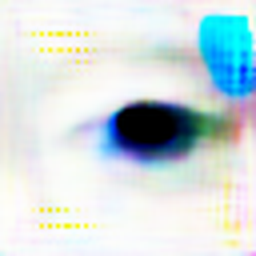

2017-08-27 18:32:35.043289: Step: 7050, Descriminator: 0.040128, Generator: 0.000000, Pass Through: 0.070464
2017-08-27 18:32:41.094883: Step: 7051, Descriminator: 1.190929, Generator: 0.000003, Pass Through: 0.083476
2017-08-27 18:32:56.048905: Step: 7052, Descriminator: 0.070007, Generator: 0.000000, Pass Through: 0.074154
2017-08-27 18:33:11.360115: Step: 7053, Descriminator: 0.061100, Generator: 0.000001, Pass Through: 0.073775
2017-08-27 18:33:26.520297: Step: 7054, Descriminator: 0.056100, Generator: 0.000005, Pass Through: 0.092684
2017-08-27 18:33:41.521160: Step: 7055, Descriminator: 0.049244, Generator: 0.000000, Pass Through: 0.076154
2017-08-27 18:33:56.585687: Step: 7056, Descriminator: 0.061884, Generator: 0.000000, Pass Through: 0.070443
2017-08-27 18:34:11.685047: Step: 7057, Descriminator: 0.042796, Generator: 0.000000, Pass Through: 0.070145
2017-08-27 18:34:26.669051: Step: 7058, Descriminator: 0.043177, Generator: 0.000000, Pass Through: 0.072322
2017-08-27 18:34:32

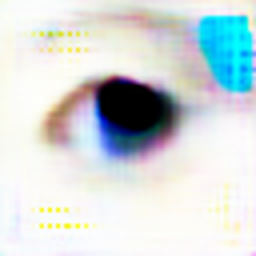

2017-08-27 18:44:09.927176: Step: 7100, Descriminator: 0.068869, Generator: 0.000004, Pass Through: 0.065476
2017-08-27 18:44:24.912977: Step: 7101, Descriminator: 0.061593, Generator: 0.000001, Pass Through: 0.061092
2017-08-27 18:44:40.018974: Step: 7102, Descriminator: 0.049084, Generator: 0.000003, Pass Through: 0.063734
2017-08-27 18:44:54.940967: Step: 7103, Descriminator: 0.039210, Generator: 0.000002, Pass Through: 0.065416
2017-08-27 18:45:10.376254: Step: 7104, Descriminator: 0.035819, Generator: 0.000001, Pass Through: 0.061037
2017-08-27 18:45:25.480256: Step: 7105, Descriminator: 0.042004, Generator: 0.000005, Pass Through: 0.067578
2017-08-27 18:45:40.395652: Step: 7106, Descriminator: 0.029061, Generator: 0.000001, Pass Through: 0.060026
2017-08-27 18:45:46.440254: Step: 7107, Descriminator: 1.353978, Generator: 0.000006, Pass Through: 0.069809
2017-08-27 18:46:01.707793: Step: 7108, Descriminator: 0.070063, Generator: 0.000001, Pass Through: 0.061790
2017-08-27 18:46:16

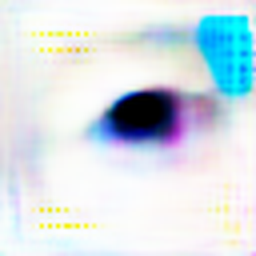

2017-08-27 18:55:53.165500: Step: 7150, Descriminator: 0.065291, Generator: 0.000001, Pass Through: 0.068796
2017-08-27 18:56:08.233196: Step: 7151, Descriminator: 0.050130, Generator: 0.000000, Pass Through: 0.067885
2017-08-27 18:56:23.366383: Step: 7152, Descriminator: 0.039118, Generator: 0.000004, Pass Through: 0.081989
2017-08-27 18:56:38.341561: Step: 7153, Descriminator: 0.046327, Generator: 0.000000, Pass Through: 0.071572
2017-08-27 18:56:53.487081: Step: 7154, Descriminator: 0.038017, Generator: 0.000000, Pass Through: 0.067739
2017-08-27 18:56:59.689376: Step: 7155, Descriminator: 1.294286, Generator: 0.000000, Pass Through: 0.075423
2017-08-27 18:57:14.832762: Step: 7156, Descriminator: 0.072020, Generator: 0.000000, Pass Through: 0.066977
2017-08-27 18:57:29.942783: Step: 7157, Descriminator: 0.066004, Generator: 0.000000, Pass Through: 0.066895
2017-08-27 18:57:44.891859: Step: 7158, Descriminator: 0.051071, Generator: 0.000001, Pass Through: 0.066464
2017-08-27 18:57:59

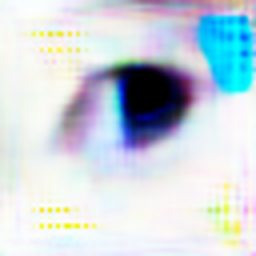

2017-08-27 19:07:36.829513: Step: 7200, Descriminator: 0.046425, Generator: 0.000001, Pass Through: 0.068536
2017-08-27 19:07:51.889243: Step: 7201, Descriminator: 0.049064, Generator: 0.000000, Pass Through: 0.067133
2017-08-27 19:08:06.914623: Step: 7202, Descriminator: 0.037608, Generator: 0.000001, Pass Through: 0.071841
2017-08-27 19:08:12.794386: Step: 7203, Descriminator: 1.362558, Generator: 0.000006, Pass Through: 0.095724
2017-08-27 19:08:27.844597: Step: 7204, Descriminator: 0.075271, Generator: 0.000000, Pass Through: 0.076431
2017-08-27 19:08:42.811310: Step: 7205, Descriminator: 0.067177, Generator: 0.000000, Pass Through: 0.071592
2017-08-27 19:08:58.127053: Step: 7206, Descriminator: 0.073627, Generator: 0.000000, Pass Through: 0.068876
2017-08-27 19:09:13.273241: Step: 7207, Descriminator: 0.053841, Generator: 0.000005, Pass Through: 0.084665
2017-08-27 19:09:28.301399: Step: 7208, Descriminator: 0.045317, Generator: 0.000000, Pass Through: 0.072270
2017-08-27 19:09:43

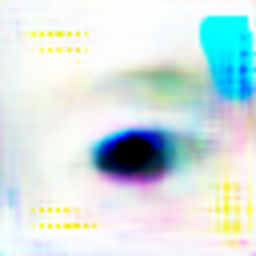

2017-08-27 19:19:28.488485: Step: 7250, Descriminator: 0.035892, Generator: 0.000001, Pass Through: 0.090826
2017-08-27 19:19:34.312700: Step: 7251, Descriminator: 1.348954, Generator: 0.000000, Pass Through: 0.073786
2017-08-27 19:19:49.091105: Step: 7252, Descriminator: 0.073777, Generator: 0.000000, Pass Through: 0.071567
2017-08-27 19:20:03.947464: Step: 7253, Descriminator: 0.067619, Generator: 0.000000, Pass Through: 0.066898
2017-08-27 19:20:18.664057: Step: 7254, Descriminator: 0.079459, Generator: 0.000002, Pass Through: 0.073153
2017-08-27 19:20:33.392156: Step: 7255, Descriminator: 0.060522, Generator: 0.000000, Pass Through: 0.069941
2017-08-27 19:20:48.371511: Step: 7256, Descriminator: 0.050154, Generator: 0.000000, Pass Through: 0.067444
2017-08-27 19:21:03.548904: Step: 7257, Descriminator: 0.041966, Generator: 0.000000, Pass Through: 0.065732
2017-08-27 19:21:18.264865: Step: 7258, Descriminator: 0.037068, Generator: 0.000007, Pass Through: 0.088889
2017-08-27 19:21:24

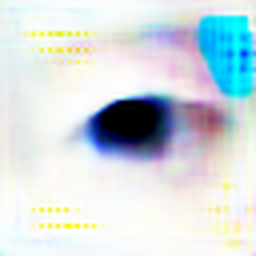

2017-08-27 19:30:45.148150: Step: 7300, Descriminator: 0.062644, Generator: 0.000000, Pass Through: 0.068353
2017-08-27 19:31:00.299798: Step: 7301, Descriminator: 0.060821, Generator: 0.000000, Pass Through: 0.065778
2017-08-27 19:31:15.083377: Step: 7302, Descriminator: 0.054179, Generator: 0.000000, Pass Through: 0.065323
2017-08-27 19:31:29.779865: Step: 7303, Descriminator: 0.041479, Generator: 0.000001, Pass Through: 0.072014
2017-08-27 19:31:44.429649: Step: 7304, Descriminator: 0.034684, Generator: 0.000001, Pass Through: 0.069396
2017-08-27 19:31:59.108920: Step: 7305, Descriminator: 1.751835, Generator: 0.000000, Pass Through: 0.067171
2017-08-27 19:32:13.791278: Step: 7306, Descriminator: 0.159233, Generator: 0.000000, Pass Through: 0.070070
2017-08-27 19:32:19.560113: Step: 7307, Descriminator: 1.458123, Generator: 0.000000, Pass Through: 0.064632
2017-08-27 19:32:34.321483: Step: 7308, Descriminator: 0.086998, Generator: 0.000001, Pass Through: 0.071256
2017-08-27 19:32:49

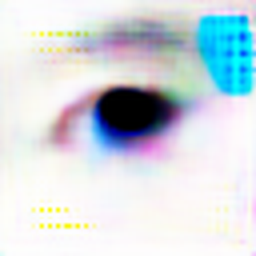

2017-08-27 19:42:12.030211: Step: 7350, Descriminator: 0.068914, Generator: 0.000001, Pass Through: 0.068641
2017-08-27 19:42:26.666747: Step: 7351, Descriminator: 2.371235, Generator: 0.000000, Pass Through: 0.064734
2017-08-27 19:42:41.336325: Step: 7352, Descriminator: 0.093457, Generator: 0.000001, Pass Through: 0.070687
2017-08-27 19:42:56.050937: Step: 7353, Descriminator: 0.096014, Generator: 0.000000, Pass Through: 0.065804
2017-08-27 19:43:11.005866: Step: 7354, Descriminator: 0.065394, Generator: 0.000000, Pass Through: 0.065999
2017-08-27 19:43:16.825968: Step: 7355, Descriminator: 1.353809, Generator: 0.000000, Pass Through: 0.063467
2017-08-27 19:43:31.601227: Step: 7356, Descriminator: 0.084803, Generator: 0.000001, Pass Through: 0.064615
2017-08-27 19:43:46.184191: Step: 7357, Descriminator: 0.092424, Generator: 0.000002, Pass Through: 0.073569
2017-08-27 19:44:00.878172: Step: 7358, Descriminator: 0.061553, Generator: 0.000000, Pass Through: 0.066239
2017-08-27 19:44:15

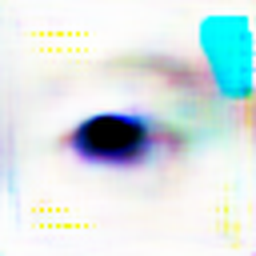

2017-08-27 19:53:39.954996: Step: 7400, Descriminator: 0.074546, Generator: 0.000001, Pass Through: 0.065750
2017-08-27 19:53:54.697390: Step: 7401, Descriminator: 0.051667, Generator: 0.000000, Pass Through: 0.065563
2017-08-27 19:54:09.390279: Step: 7402, Descriminator: 0.068436, Generator: 0.000000, Pass Through: 0.063964
2017-08-27 19:54:15.287155: Step: 7403, Descriminator: 1.458323, Generator: 0.000001, Pass Through: 0.067379
2017-08-27 19:54:30.101576: Step: 7404, Descriminator: 0.085692, Generator: 0.000003, Pass Through: 0.075805
2017-08-27 19:54:44.821941: Step: 7405, Descriminator: 0.071284, Generator: 0.000000, Pass Through: 0.066804
2017-08-27 19:54:59.910952: Step: 7406, Descriminator: 0.059098, Generator: 0.000000, Pass Through: 0.064173
2017-08-27 19:55:14.687071: Step: 7407, Descriminator: 0.054854, Generator: 0.000001, Pass Through: 0.068622
2017-08-27 19:55:29.428695: Step: 7408, Descriminator: 0.056593, Generator: 0.000001, Pass Through: 0.071061
2017-08-27 19:55:44

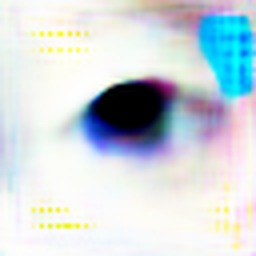

2017-08-27 20:05:08.965557: Step: 7450, Descriminator: 0.032809, Generator: 0.000001, Pass Through: 0.072112
2017-08-27 20:05:14.786994: Step: 7451, Descriminator: 1.566553, Generator: 0.000001, Pass Through: 0.072826
2017-08-27 20:05:29.528071: Step: 7452, Descriminator: 0.055321, Generator: 0.000000, Pass Through: 0.070161
2017-08-27 20:05:44.104016: Step: 7453, Descriminator: 0.041235, Generator: 0.000002, Pass Through: 0.076068
2017-08-27 20:05:58.775500: Step: 7454, Descriminator: 0.043494, Generator: 0.000000, Pass Through: 0.068836
2017-08-27 20:06:13.478992: Step: 7455, Descriminator: 0.039477, Generator: 0.000000, Pass Through: 0.068911
2017-08-27 20:06:29.117108: Step: 7456, Descriminator: 0.034100, Generator: 0.000002, Pass Through: 0.072653
2017-08-27 20:06:44.352010: Step: 7457, Descriminator: 0.034929, Generator: 0.000001, Pass Through: 0.068562
2017-08-27 20:06:59.466381: Step: 7458, Descriminator: 0.027046, Generator: 0.000001, Pass Through: 0.074659
2017-08-27 20:07:05

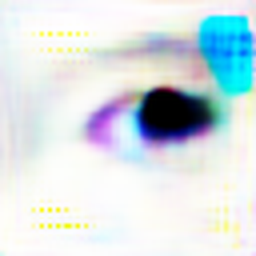

2017-08-27 20:16:27.393010: Step: 7500, Descriminator: 0.093381, Generator: 0.000000, Pass Through: 0.065406
2017-08-27 20:16:42.323713: Step: 7501, Descriminator: 0.070298, Generator: 0.000000, Pass Through: 0.064632
2017-08-27 20:16:57.447742: Step: 7502, Descriminator: 0.058180, Generator: 0.000001, Pass Through: 0.069872
2017-08-27 20:17:12.580382: Step: 7503, Descriminator: 0.051953, Generator: 0.000000, Pass Through: 0.065964
2017-08-27 20:17:27.546227: Step: 7504, Descriminator: 0.052442, Generator: 0.000001, Pass Through: 0.068499
2017-08-27 20:17:42.415686: Step: 7505, Descriminator: 0.053967, Generator: 0.000000, Pass Through: 0.072786
2017-08-27 20:17:57.303469: Step: 7506, Descriminator: 0.037233, Generator: 0.000000, Pass Through: 0.066314
2017-08-27 20:18:03.121885: Step: 7507, Descriminator: 1.209507, Generator: 0.000001, Pass Through: 0.071337
2017-08-27 20:18:17.908282: Step: 7508, Descriminator: 0.079877, Generator: 0.000001, Pass Through: 0.069395
2017-08-27 20:18:32

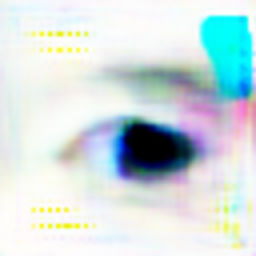

2017-08-27 20:27:54.226984: Step: 7550, Descriminator: 0.096526, Generator: 0.000000, Pass Through: 0.068960
2017-08-27 20:28:08.833288: Step: 7551, Descriminator: 0.051147, Generator: 0.000001, Pass Through: 0.072463
2017-08-27 20:28:23.340446: Step: 7552, Descriminator: 0.060122, Generator: 0.000000, Pass Through: 0.070345
2017-08-27 20:28:38.034537: Step: 7553, Descriminator: 0.055091, Generator: 0.000001, Pass Through: 0.072455
2017-08-27 20:28:52.729588: Step: 7554, Descriminator: 0.043235, Generator: 0.000001, Pass Through: 0.078445
2017-08-27 20:28:58.894628: Step: 7555, Descriminator: 1.302583, Generator: 0.000000, Pass Through: 0.073031
2017-08-27 20:29:13.577476: Step: 7556, Descriminator: 0.072413, Generator: 0.000001, Pass Through: 0.079177
2017-08-27 20:29:28.203989: Step: 7557, Descriminator: 0.058100, Generator: 0.000000, Pass Through: 0.069511
2017-08-27 20:29:42.822953: Step: 7558, Descriminator: 0.048367, Generator: 0.000000, Pass Through: 0.068971
2017-08-27 20:29:57

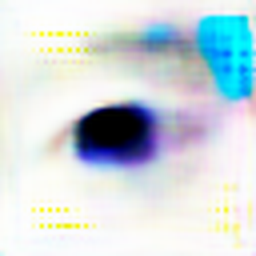

2017-08-27 20:39:18.338963: Step: 7600, Descriminator: 0.047612, Generator: 0.000001, Pass Through: 0.071026
2017-08-27 20:39:32.960240: Step: 7601, Descriminator: 0.045425, Generator: 0.000002, Pass Through: 0.074791
2017-08-27 20:39:47.585444: Step: 7602, Descriminator: 0.040160, Generator: 0.000001, Pass Through: 0.073567
2017-08-27 20:39:53.395009: Step: 7603, Descriminator: 1.260382, Generator: 0.000000, Pass Through: 0.068511
2017-08-27 20:40:07.996216: Step: 7604, Descriminator: 0.061572, Generator: 0.000001, Pass Through: 0.072269
2017-08-27 20:40:22.618439: Step: 7605, Descriminator: 0.052022, Generator: 0.000001, Pass Through: 0.070541
2017-08-27 20:40:37.297382: Step: 7606, Descriminator: 0.048241, Generator: 0.000000, Pass Through: 0.068907
2017-08-27 20:40:51.981359: Step: 7607, Descriminator: 0.053769, Generator: 0.000001, Pass Through: 0.073297
2017-08-27 20:41:07.135016: Step: 7608, Descriminator: 0.047429, Generator: 0.000001, Pass Through: 0.069996
2017-08-27 20:41:21

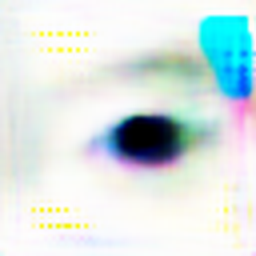

2017-08-27 20:50:44.619941: Step: 7650, Descriminator: 0.024343, Generator: 0.000001, Pass Through: 0.066124
2017-08-27 20:50:50.459170: Step: 7651, Descriminator: 1.331742, Generator: 0.000004, Pass Through: 0.084191
2017-08-27 20:51:05.628560: Step: 7652, Descriminator: 0.059951, Generator: 0.000000, Pass Through: 0.070563
2017-08-27 20:51:20.379629: Step: 7653, Descriminator: 0.055737, Generator: 0.000000, Pass Through: 0.066740
2017-08-27 20:51:34.887047: Step: 7654, Descriminator: 0.039519, Generator: 0.000007, Pass Through: 0.082006
2017-08-27 20:51:49.629620: Step: 7655, Descriminator: 0.036068, Generator: 0.000000, Pass Through: 0.074173
2017-08-27 20:52:04.354664: Step: 7656, Descriminator: 0.044416, Generator: 0.000000, Pass Through: 0.066787
2017-08-27 20:52:19.039448: Step: 7657, Descriminator: 0.048765, Generator: 0.000000, Pass Through: 0.065147
2017-08-27 20:52:33.721558: Step: 7658, Descriminator: 0.032827, Generator: 0.000000, Pass Through: 0.064980
2017-08-27 20:52:39

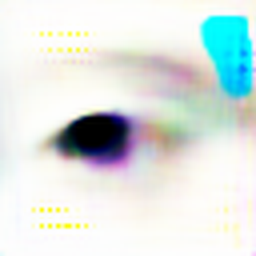

2017-08-27 21:02:41.873055: Step: 7700, Descriminator: 0.060154, Generator: 0.000001, Pass Through: 0.058191
2017-08-27 21:02:57.956024: Step: 7701, Descriminator: 0.065953, Generator: 0.000062, Pass Through: 0.080618
2017-08-27 21:03:14.386571: Step: 7702, Descriminator: 0.056656, Generator: 0.000000, Pass Through: 0.066522
2017-08-27 21:03:30.872470: Step: 7703, Descriminator: 0.049696, Generator: 0.000001, Pass Through: 0.059027
2017-08-27 21:03:46.838469: Step: 7704, Descriminator: 0.046160, Generator: 0.000000, Pass Through: 0.058125
2017-08-27 21:04:02.859889: Step: 7705, Descriminator: 0.047926, Generator: 0.000000, Pass Through: 0.056559
2017-08-27 21:04:18.946425: Step: 7706, Descriminator: 0.038534, Generator: 0.000002, Pass Through: 0.059734
2017-08-27 21:04:25.266272: Step: 7707, Descriminator: 1.327652, Generator: 0.000020, Pass Through: 0.071067
2017-08-27 21:04:41.406960: Step: 7708, Descriminator: 0.076901, Generator: 0.000001, Pass Through: 0.064655
2017-08-27 21:04:57

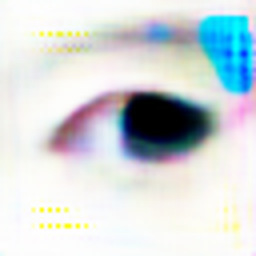

2017-08-27 21:15:17.124665: Step: 7750, Descriminator: 0.051010, Generator: 0.000002, Pass Through: 0.058103
2017-08-27 21:15:33.476773: Step: 7751, Descriminator: 0.044322, Generator: 0.000001, Pass Through: 0.059549
2017-08-27 21:15:49.606673: Step: 7752, Descriminator: 0.046935, Generator: 0.000002, Pass Through: 0.063193
2017-08-27 21:16:05.931301: Step: 7753, Descriminator: 0.049341, Generator: 0.000007, Pass Through: 0.070931
2017-08-27 21:16:22.262132: Step: 7754, Descriminator: 0.031850, Generator: 0.000000, Pass Through: 0.062108
2017-08-27 21:16:28.629477: Step: 7755, Descriminator: 1.322391, Generator: 0.000000, Pass Through: 0.060035
2017-08-27 21:16:45.184561: Step: 7756, Descriminator: 0.074470, Generator: 0.000002, Pass Through: 0.065048
2017-08-27 21:17:01.972350: Step: 7757, Descriminator: 0.057063, Generator: 0.000001, Pass Through: 0.062854
2017-08-27 21:17:18.395044: Step: 7758, Descriminator: 0.050566, Generator: 0.000000, Pass Through: 0.057583
2017-08-27 21:17:34

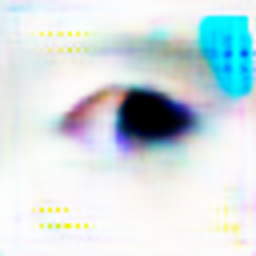

2017-08-27 21:28:03.256730: Step: 7800, Descriminator: 0.050375, Generator: 0.000000, Pass Through: 0.063008
2017-08-27 21:28:19.624690: Step: 7801, Descriminator: 0.033642, Generator: 0.000001, Pass Through: 0.061983
2017-08-27 21:28:35.905102: Step: 7802, Descriminator: 0.032945, Generator: 0.000001, Pass Through: 0.065286
2017-08-27 21:28:42.507618: Step: 7803, Descriminator: 1.262949, Generator: 0.000000, Pass Through: 0.064752
2017-08-27 21:28:59.221158: Step: 7804, Descriminator: 0.064360, Generator: 0.000002, Pass Through: 0.079316
2017-08-27 21:29:15.608110: Step: 7805, Descriminator: 0.076963, Generator: 0.000000, Pass Through: 0.064014
2017-08-27 21:29:31.950878: Step: 7806, Descriminator: 0.050703, Generator: 0.000001, Pass Through: 0.063209
2017-08-27 21:29:48.068422: Step: 7807, Descriminator: 0.053877, Generator: 0.000000, Pass Through: 0.065477
2017-08-27 21:30:04.405096: Step: 7808, Descriminator: 0.043922, Generator: 0.000001, Pass Through: 0.064810
2017-08-27 21:30:20

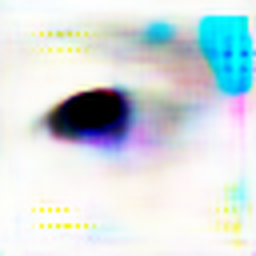

2017-08-27 21:40:46.932175: Step: 7850, Descriminator: 0.035959, Generator: 0.000000, Pass Through: 0.068347
2017-08-27 21:40:53.464477: Step: 7851, Descriminator: 1.251040, Generator: 0.000000, Pass Through: 0.064845
2017-08-27 21:41:10.223700: Step: 7852, Descriminator: 0.070467, Generator: 0.000003, Pass Through: 0.076509
2017-08-27 21:41:26.650033: Step: 7853, Descriminator: 0.063565, Generator: 0.000000, Pass Through: 0.076399
2017-08-27 21:41:42.718541: Step: 7854, Descriminator: 0.051755, Generator: 0.000000, Pass Through: 0.068732
2017-08-27 21:41:59.112664: Step: 7855, Descriminator: 0.050557, Generator: 0.000000, Pass Through: 0.067686
2017-08-27 21:42:15.429133: Step: 7856, Descriminator: 0.047983, Generator: 0.000000, Pass Through: 0.064707
2017-08-27 21:42:31.484603: Step: 7857, Descriminator: 2.158728, Generator: 0.000000, Pass Through: 0.063545
2017-08-27 21:42:47.846082: Step: 7858, Descriminator: 0.139591, Generator: 0.000000, Pass Through: 0.064173
2017-08-27 21:42:54

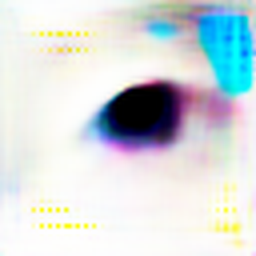

2017-08-27 21:53:19.390497: Step: 7900, Descriminator: 0.063919, Generator: 0.000000, Pass Through: 0.062918
2017-08-27 21:53:35.789181: Step: 7901, Descriminator: 0.062632, Generator: 0.000003, Pass Through: 0.068755
2017-08-27 21:53:51.905545: Step: 7902, Descriminator: 0.042499, Generator: 0.000000, Pass Through: 0.061971
2017-08-27 21:54:08.277945: Step: 7903, Descriminator: 2.088481, Generator: 0.000000, Pass Through: 0.059651
2017-08-27 21:54:24.530322: Step: 7904, Descriminator: 0.129536, Generator: 0.000000, Pass Through: 0.059429
2017-08-27 21:54:40.659911: Step: 7905, Descriminator: 0.054619, Generator: 0.000000, Pass Through: 0.059313
2017-08-27 21:54:57.330057: Step: 7906, Descriminator: 0.061595, Generator: 0.000001, Pass Through: 0.059531
2017-08-27 21:55:03.994519: Step: 7907, Descriminator: 1.275976, Generator: 0.000000, Pass Through: 0.058170
2017-08-27 21:55:20.155091: Step: 7908, Descriminator: 0.059281, Generator: 0.000000, Pass Through: 0.059302
2017-08-27 21:55:36

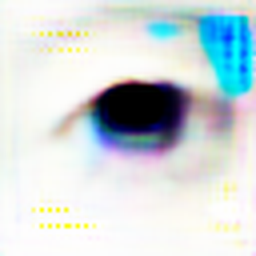

2017-08-27 22:06:00.618360: Step: 7950, Descriminator: 0.085994, Generator: 0.000000, Pass Through: 0.060405
2017-08-27 22:06:16.747536: Step: 7951, Descriminator: 0.098968, Generator: 0.000001, Pass Through: 0.062476
2017-08-27 22:06:33.081520: Step: 7952, Descriminator: 0.090706, Generator: 0.000001, Pass Through: 0.065334
2017-08-27 22:06:49.148234: Step: 7953, Descriminator: 0.057856, Generator: 0.000001, Pass Through: 0.065954
2017-08-27 22:07:06.099655: Step: 7954, Descriminator: 0.057027, Generator: 0.000001, Pass Through: 0.064197
2017-08-27 22:07:12.784051: Step: 7955, Descriminator: 1.194497, Generator: 0.000000, Pass Through: 0.077088
2017-08-27 22:07:29.201680: Step: 7956, Descriminator: 0.067493, Generator: 0.000000, Pass Through: 0.064724
2017-08-27 22:07:45.222690: Step: 7957, Descriminator: 0.060199, Generator: 0.000001, Pass Through: 0.065335
2017-08-27 22:08:01.623865: Step: 7958, Descriminator: 0.075024, Generator: 0.000001, Pass Through: 0.065576
2017-08-27 22:08:17

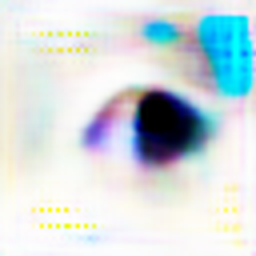

2017-08-27 22:18:46.927882: Step: 8000, Descriminator: 0.037269, Generator: 0.000000, Pass Through: 0.063969
2017-08-27 22:19:03.814726: Step: 8001, Descriminator: 0.033105, Generator: 0.000000, Pass Through: 0.063123
2017-08-27 22:19:20.202372: Step: 8002, Descriminator: 0.023132, Generator: 0.000000, Pass Through: 0.062636
2017-08-27 22:19:26.523010: Step: 8003, Descriminator: 1.440309, Generator: 0.000001, Pass Through: 0.062300
2017-08-27 22:19:42.830120: Step: 8004, Descriminator: 0.059253, Generator: 0.000004, Pass Through: 0.078237
2017-08-27 22:19:58.933073: Step: 8005, Descriminator: 0.053868, Generator: 0.000001, Pass Through: 0.068493
2017-08-27 22:20:15.347980: Step: 8006, Descriminator: 0.048398, Generator: 0.000001, Pass Through: 0.079780
2017-08-27 22:20:32.129700: Step: 8007, Descriminator: 0.052614, Generator: 0.000000, Pass Through: 0.066947
2017-08-27 22:20:49.156183: Step: 8008, Descriminator: 0.049532, Generator: 0.000000, Pass Through: 0.062785
2017-08-27 22:21:06

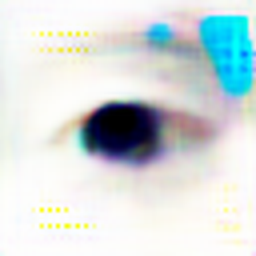

2017-08-27 22:31:20.784948: Step: 8050, Descriminator: 0.042788, Generator: 0.000000, Pass Through: 0.060072
2017-08-27 22:31:26.622725: Step: 8051, Descriminator: 1.231127, Generator: 0.000000, Pass Through: 0.059250
2017-08-27 22:31:42.716188: Step: 8052, Descriminator: 0.072822, Generator: 0.000002, Pass Through: 0.063199
2017-08-27 22:31:57.697143: Step: 8053, Descriminator: 0.069847, Generator: 0.000000, Pass Through: 0.058148
2017-08-27 22:32:12.661719: Step: 8054, Descriminator: 0.054756, Generator: 0.000000, Pass Through: 0.058612
2017-08-27 22:32:27.583911: Step: 8055, Descriminator: 0.050398, Generator: 0.000001, Pass Through: 0.060415
2017-08-27 22:32:42.566948: Step: 8056, Descriminator: 0.057024, Generator: 0.000000, Pass Through: 0.059178
2017-08-27 22:32:59.185203: Step: 8057, Descriminator: 0.040037, Generator: 0.000000, Pass Through: 0.061894
2017-08-27 22:33:14.301207: Step: 8058, Descriminator: 0.045038, Generator: 0.000001, Pass Through: 0.061698
2017-08-27 22:33:20

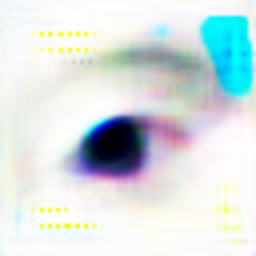

2017-08-27 22:43:02.152358: Step: 8100, Descriminator: 0.079982, Generator: 0.000002, Pass Through: 0.066122
2017-08-27 22:43:17.398797: Step: 8101, Descriminator: 0.062888, Generator: 0.000000, Pass Through: 0.059475
2017-08-27 22:43:32.338704: Step: 8102, Descriminator: 0.067105, Generator: 0.000001, Pass Through: 0.060347
2017-08-27 22:43:47.222090: Step: 8103, Descriminator: 0.051006, Generator: 0.000000, Pass Through: 0.074866
2017-08-27 22:44:02.033067: Step: 8104, Descriminator: 0.057522, Generator: 0.000000, Pass Through: 0.065369
2017-08-27 22:44:16.813165: Step: 8105, Descriminator: 0.059977, Generator: 0.000000, Pass Through: 0.060768
2017-08-27 22:44:32.400008: Step: 8106, Descriminator: 0.045916, Generator: 0.000004, Pass Through: 0.069524
2017-08-27 22:44:38.937598: Step: 8107, Descriminator: 1.254110, Generator: 0.000000, Pass Through: 0.058308
2017-08-27 22:44:53.798131: Step: 8108, Descriminator: 0.068697, Generator: 0.000000, Pass Through: 0.061110
2017-08-27 22:45:09

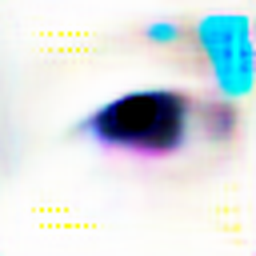

2017-08-27 22:54:44.174694: Step: 8150, Descriminator: 0.057495, Generator: 0.000000, Pass Through: 0.063806
2017-08-27 22:54:59.438917: Step: 8151, Descriminator: 0.054885, Generator: 0.000001, Pass Through: 0.059924
2017-08-27 22:55:14.326642: Step: 8152, Descriminator: 0.053667, Generator: 0.000001, Pass Through: 0.058562
2017-08-27 22:55:30.301664: Step: 8153, Descriminator: 0.049886, Generator: 0.000001, Pass Through: 0.060689
2017-08-27 22:55:45.185094: Step: 8154, Descriminator: 0.050845, Generator: 0.000002, Pass Through: 0.061551
2017-08-27 22:55:51.109369: Step: 8155, Descriminator: 1.130662, Generator: 0.000001, Pass Through: 0.060894
2017-08-27 22:56:06.061111: Step: 8156, Descriminator: 0.052765, Generator: 0.000001, Pass Through: 0.059727
2017-08-27 22:56:21.129635: Step: 8157, Descriminator: 0.062768, Generator: 0.000003, Pass Through: 0.066292
2017-08-27 22:56:36.462740: Step: 8158, Descriminator: 0.062115, Generator: 0.000000, Pass Through: 0.060903
2017-08-27 22:56:51

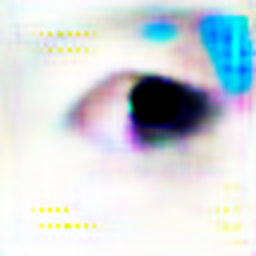

2017-08-27 23:06:20.397536: Step: 8200, Descriminator: 0.046406, Generator: 0.000001, Pass Through: 0.059204
2017-08-27 23:06:35.174876: Step: 8201, Descriminator: 0.032804, Generator: 0.000001, Pass Through: 0.059906
2017-08-27 23:06:49.934411: Step: 8202, Descriminator: 0.031428, Generator: 0.000001, Pass Through: 0.059280
2017-08-27 23:06:55.895219: Step: 8203, Descriminator: 1.401645, Generator: 0.000001, Pass Through: 0.061307
2017-08-27 23:07:11.162120: Step: 8204, Descriminator: 0.061199, Generator: 0.000002, Pass Through: 0.071644
2017-08-27 23:07:25.890454: Step: 8205, Descriminator: 0.053322, Generator: 0.000001, Pass Through: 0.066370
2017-08-27 23:07:40.669672: Step: 8206, Descriminator: 0.044008, Generator: 0.000002, Pass Through: 0.069932
2017-08-27 23:07:55.409822: Step: 8207, Descriminator: 0.048760, Generator: 0.000001, Pass Through: 0.068675
2017-08-27 23:08:10.169925: Step: 8208, Descriminator: 0.056001, Generator: 0.000000, Pass Through: 0.063268
2017-08-27 23:08:24

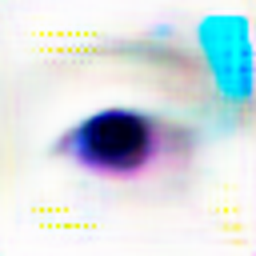

2017-08-27 23:17:49.576039: Step: 8250, Descriminator: 0.046575, Generator: 0.000001, Pass Through: 0.063901
2017-08-27 23:17:55.384331: Step: 8251, Descriminator: 1.280550, Generator: 0.000015, Pass Through: 0.086741
2017-08-27 23:18:10.123833: Step: 8252, Descriminator: 0.070894, Generator: 0.000000, Pass Through: 0.069319
2017-08-27 23:18:24.795701: Step: 8253, Descriminator: 0.065586, Generator: 0.000000, Pass Through: 0.064535
2017-08-27 23:18:39.529719: Step: 8254, Descriminator: 0.052582, Generator: 0.000004, Pass Through: 0.067426
2017-08-27 23:18:54.350684: Step: 8255, Descriminator: 0.054147, Generator: 0.000000, Pass Through: 0.062878
2017-08-27 23:19:09.621222: Step: 8256, Descriminator: 0.043168, Generator: 0.000000, Pass Through: 0.061601
2017-08-27 23:19:24.327198: Step: 8257, Descriminator: 0.042868, Generator: 0.000000, Pass Through: 0.062359
2017-08-27 23:19:38.994482: Step: 8258, Descriminator: 0.038377, Generator: 0.000004, Pass Through: 0.068247
2017-08-27 23:19:44

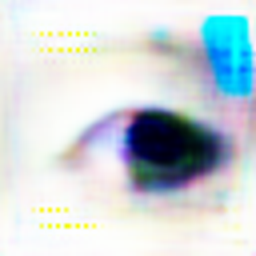

2017-08-27 23:29:08.735933: Step: 8300, Descriminator: 0.072591, Generator: 0.000002, Pass Through: 0.065615
2017-08-27 23:29:23.470924: Step: 8301, Descriminator: 0.057756, Generator: 0.000000, Pass Through: 0.060516
2017-08-27 23:29:38.203537: Step: 8302, Descriminator: 0.060429, Generator: 0.000001, Pass Through: 0.062084
2017-08-27 23:29:52.996233: Step: 8303, Descriminator: 0.044333, Generator: 0.000001, Pass Through: 0.062044
2017-08-27 23:30:07.760196: Step: 8304, Descriminator: 0.054882, Generator: 0.000000, Pass Through: 0.066037
2017-08-27 23:30:22.493377: Step: 8305, Descriminator: 0.040541, Generator: 0.000000, Pass Through: 0.060794
2017-08-27 23:30:37.283202: Step: 8306, Descriminator: 0.036485, Generator: 0.000001, Pass Through: 0.062609
2017-08-27 23:30:43.097206: Step: 8307, Descriminator: 1.328007, Generator: 0.000001, Pass Through: 0.067328
2017-08-27 23:30:58.253274: Step: 8308, Descriminator: 0.060702, Generator: 0.000001, Pass Through: 0.069426
2017-08-27 23:31:13

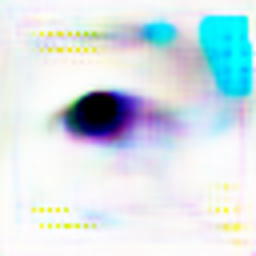

2017-08-27 23:40:38.406206: Step: 8350, Descriminator: 0.053910, Generator: 0.000000, Pass Through: 0.071178
2017-08-27 23:40:53.137075: Step: 8351, Descriminator: 0.052665, Generator: 0.000000, Pass Through: 0.067250
2017-08-27 23:41:08.518642: Step: 8352, Descriminator: 0.039451, Generator: 0.000000, Pass Through: 0.067243
2017-08-27 23:41:23.181904: Step: 8353, Descriminator: 0.043356, Generator: 0.000001, Pass Through: 0.069192
2017-08-27 23:41:37.823570: Step: 8354, Descriminator: 0.026312, Generator: 0.000000, Pass Through: 0.063605
2017-08-27 23:41:43.604554: Step: 8355, Descriminator: 1.350758, Generator: 0.000001, Pass Through: 0.071842
2017-08-27 23:41:58.401840: Step: 8356, Descriminator: 0.083374, Generator: 0.000000, Pass Through: 0.066009
2017-08-27 23:42:13.134466: Step: 8357, Descriminator: 0.052188, Generator: 0.000000, Pass Through: 0.066541
2017-08-27 23:42:27.882848: Step: 8358, Descriminator: 0.050801, Generator: 0.000003, Pass Through: 0.076216
2017-08-27 23:42:42

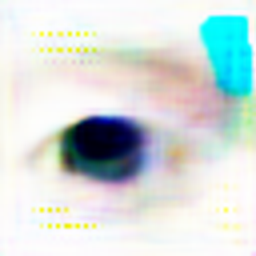

2017-08-27 23:52:05.595789: Step: 8400, Descriminator: 0.038128, Generator: 0.000000, Pass Through: 0.060290
2017-08-27 23:52:20.248416: Step: 8401, Descriminator: 0.035660, Generator: 0.000001, Pass Through: 0.063344
2017-08-27 23:52:34.936347: Step: 8402, Descriminator: 0.033997, Generator: 0.000000, Pass Through: 0.059786
2017-08-27 23:52:40.730709: Step: 8403, Descriminator: 1.480763, Generator: 0.000001, Pass Through: 0.066372
2017-08-27 23:52:55.451503: Step: 8404, Descriminator: 0.067793, Generator: 0.000004, Pass Through: 0.081879
2017-08-27 23:53:10.538813: Step: 8405, Descriminator: 0.050765, Generator: 0.000000, Pass Through: 0.066446
2017-08-27 23:53:25.338270: Step: 8406, Descriminator: 0.059091, Generator: 0.000000, Pass Through: 0.062694
2017-08-27 23:53:40.597579: Step: 8407, Descriminator: 0.050014, Generator: 0.000002, Pass Through: 0.069018
2017-08-27 23:53:55.279049: Step: 8408, Descriminator: 0.056335, Generator: 0.000000, Pass Through: 0.065925
2017-08-27 23:54:09

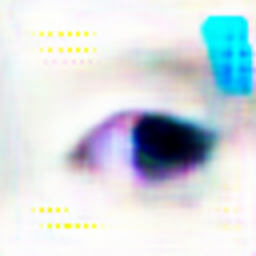

2017-08-28 00:03:32.887182: Step: 8450, Descriminator: 0.039183, Generator: 0.000000, Pass Through: 0.064168
2017-08-28 00:03:38.685017: Step: 8451, Descriminator: 1.394700, Generator: 0.000001, Pass Through: 0.069961
2017-08-28 00:03:53.413274: Step: 8452, Descriminator: 0.077444, Generator: 0.000002, Pass Through: 0.069572
2017-08-28 00:04:08.091950: Step: 8453, Descriminator: 0.054332, Generator: 0.000000, Pass Through: 0.063935
2017-08-28 00:04:22.880973: Step: 8454, Descriminator: 0.059865, Generator: 0.000000, Pass Through: 0.065073
2017-08-28 00:04:37.637603: Step: 8455, Descriminator: 2.797704, Generator: 0.000000, Pass Through: 0.062369
2017-08-28 00:04:52.333601: Step: 8456, Descriminator: 0.113658, Generator: 0.000000, Pass Through: 0.061241
2017-08-28 00:05:07.624563: Step: 8457, Descriminator: 0.080483, Generator: 0.000001, Pass Through: 0.064407
2017-08-28 00:05:22.421788: Step: 8458, Descriminator: 0.055713, Generator: 0.000000, Pass Through: 0.062305
2017-08-28 00:05:28

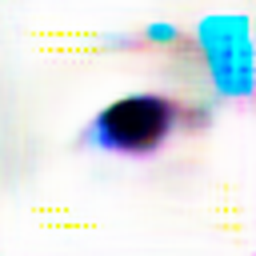

2017-08-28 00:14:49.778898: Step: 8500, Descriminator: 0.059727, Generator: 0.000000, Pass Through: 0.064730
2017-08-28 00:15:04.918280: Step: 8501, Descriminator: 2.394504, Generator: 0.000000, Pass Through: 0.063152
2017-08-28 00:15:19.715249: Step: 8502, Descriminator: 0.127062, Generator: 0.000000, Pass Through: 0.063042
2017-08-28 00:15:34.538651: Step: 8503, Descriminator: 0.091494, Generator: 0.000000, Pass Through: 0.062218
2017-08-28 00:15:49.204311: Step: 8504, Descriminator: 0.053402, Generator: 0.000000, Pass Through: 0.064357
2017-08-28 00:16:03.961619: Step: 8505, Descriminator: 0.067140, Generator: 0.000001, Pass Through: 0.066432
2017-08-28 00:16:18.555651: Step: 8506, Descriminator: 0.057699, Generator: 0.000000, Pass Through: 0.062112
2017-08-28 00:16:24.385918: Step: 8507, Descriminator: 1.145717, Generator: 0.000000, Pass Through: 0.063562
2017-08-28 00:16:39.153615: Step: 8508, Descriminator: 0.087256, Generator: 0.000000, Pass Through: 0.070754
2017-08-28 00:16:53

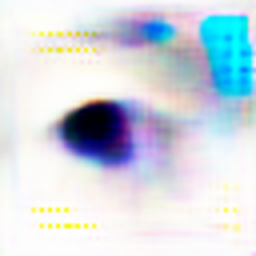

2017-08-28 00:26:15.626704: Step: 8550, Descriminator: 0.039843, Generator: 0.000000, Pass Through: 0.065055
2017-08-28 00:26:30.210927: Step: 8551, Descriminator: 0.029821, Generator: 0.000002, Pass Through: 0.073288
2017-08-28 00:26:44.958513: Step: 8552, Descriminator: 0.031914, Generator: 0.000000, Pass Through: 0.066001
2017-08-28 00:27:00.138796: Step: 8553, Descriminator: 0.030228, Generator: 0.000001, Pass Through: 0.076493
2017-08-28 00:27:14.989777: Step: 8554, Descriminator: 0.024928, Generator: 0.000000, Pass Through: 0.067086
2017-08-28 00:27:20.913424: Step: 8555, Descriminator: 1.449038, Generator: 0.000000, Pass Through: 0.093398
2017-08-28 00:27:35.696518: Step: 8556, Descriminator: 0.056889, Generator: 0.000001, Pass Through: 0.078387
2017-08-28 00:27:50.551733: Step: 8557, Descriminator: 0.049605, Generator: 0.000001, Pass Through: 0.072032
2017-08-28 00:28:05.262411: Step: 8558, Descriminator: 0.039746, Generator: 0.000000, Pass Through: 0.070846
2017-08-28 00:28:20

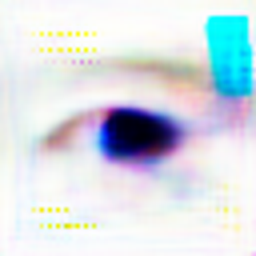

2017-08-28 00:37:40.615742: Step: 8600, Descriminator: 0.056382, Generator: 0.000001, Pass Through: 0.069047
2017-08-28 00:37:55.268913: Step: 8601, Descriminator: 0.050602, Generator: 0.000000, Pass Through: 0.064406
2017-08-28 00:38:09.923256: Step: 8602, Descriminator: 0.045462, Generator: 0.000001, Pass Through: 0.067272
2017-08-28 00:38:15.701454: Step: 8603, Descriminator: 1.244751, Generator: 0.000000, Pass Through: 0.068252
2017-08-28 00:38:30.316713: Step: 8604, Descriminator: 0.070524, Generator: 0.000001, Pass Through: 0.071983
2017-08-28 00:38:44.965427: Step: 8605, Descriminator: 0.058462, Generator: 0.000001, Pass Through: 0.068759
2017-08-28 00:39:00.099120: Step: 8606, Descriminator: 0.061473, Generator: 0.000001, Pass Through: 0.070065
2017-08-28 00:39:14.809808: Step: 8607, Descriminator: 0.047373, Generator: 0.000000, Pass Through: 0.063551
2017-08-28 00:39:29.418295: Step: 8608, Descriminator: 0.049086, Generator: 0.000002, Pass Through: 0.075356
2017-08-28 00:39:43

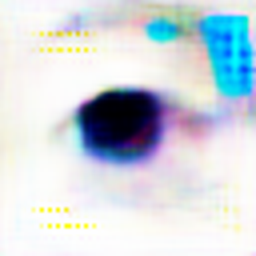

2017-08-28 00:49:02.295758: Step: 8650, Descriminator: 0.051165, Generator: 0.000000, Pass Through: 0.065685
2017-08-28 00:49:08.074214: Step: 8651, Descriminator: 1.142089, Generator: 0.000000, Pass Through: 0.065916
2017-08-28 00:49:22.730961: Step: 8652, Descriminator: 0.078767, Generator: 0.000000, Pass Through: 0.064876
2017-08-28 00:49:37.131577: Step: 8653, Descriminator: 0.052705, Generator: 0.000001, Pass Through: 0.069526
2017-08-28 00:49:51.810436: Step: 8654, Descriminator: 0.061964, Generator: 0.000000, Pass Through: 0.063992
2017-08-28 00:50:06.316720: Step: 8655, Descriminator: 0.061423, Generator: 0.000001, Pass Through: 0.069296
2017-08-28 00:50:21.366196: Step: 8656, Descriminator: 0.055812, Generator: 0.000000, Pass Through: 0.067509
2017-08-28 00:50:35.992374: Step: 8657, Descriminator: 0.048050, Generator: 0.000001, Pass Through: 0.073328
2017-08-28 00:50:50.600295: Step: 8658, Descriminator: 0.048200, Generator: 0.000000, Pass Through: 0.066327
2017-08-28 00:50:56

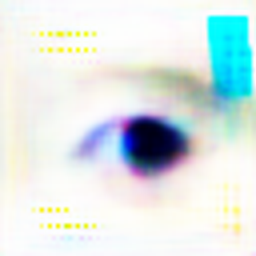

2017-08-28 01:00:15.854974: Step: 8700, Descriminator: 0.066992, Generator: 0.000000, Pass Through: 0.065831
2017-08-28 01:00:30.460824: Step: 8701, Descriminator: 0.064873, Generator: 0.000000, Pass Through: 0.065959
2017-08-28 01:00:44.976612: Step: 8702, Descriminator: 0.067569, Generator: 0.000001, Pass Through: 0.072148
2017-08-28 01:01:00.087549: Step: 8703, Descriminator: 0.058759, Generator: 0.000000, Pass Through: 0.066456
2017-08-28 01:01:14.885874: Step: 8704, Descriminator: 0.048262, Generator: 0.000000, Pass Through: 0.068817
2017-08-28 01:01:29.383946: Step: 8705, Descriminator: 0.039048, Generator: 0.000001, Pass Through: 0.068257
2017-08-28 01:01:43.924900: Step: 8706, Descriminator: 0.060491, Generator: 0.000000, Pass Through: 0.066449
2017-08-28 01:01:49.754723: Step: 8707, Descriminator: 1.283945, Generator: 0.000000, Pass Through: 0.072208
2017-08-28 01:02:04.314858: Step: 8708, Descriminator: 0.060011, Generator: 0.000000, Pass Through: 0.069376
2017-08-28 01:02:18

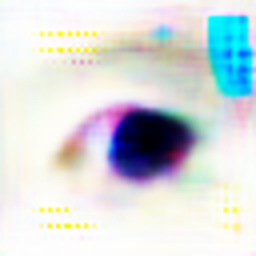

2017-08-28 01:11:36.926007: Step: 8750, Descriminator: 0.050756, Generator: 0.000001, Pass Through: 0.062484
2017-08-28 01:11:51.745449: Step: 8751, Descriminator: 0.037962, Generator: 0.000006, Pass Through: 0.067401
2017-08-28 01:12:06.248185: Step: 8752, Descriminator: 0.037877, Generator: 0.000000, Pass Through: 0.060431
2017-08-28 01:12:20.749226: Step: 8753, Descriminator: 0.031144, Generator: 0.000000, Pass Through: 0.059006
2017-08-28 01:12:35.437055: Step: 8754, Descriminator: 0.027108, Generator: 0.000003, Pass Through: 0.067450
2017-08-28 01:12:41.260900: Step: 8755, Descriminator: 1.595446, Generator: 0.000001, Pass Through: 0.065302
2017-08-28 01:12:55.844641: Step: 8756, Descriminator: 0.058617, Generator: 0.000001, Pass Through: 0.062883
2017-08-28 01:13:10.917316: Step: 8757, Descriminator: 0.051914, Generator: 0.000004, Pass Through: 0.070663
2017-08-28 01:13:25.356465: Step: 8758, Descriminator: 0.052695, Generator: 0.000000, Pass Through: 0.065399
2017-08-28 01:13:39

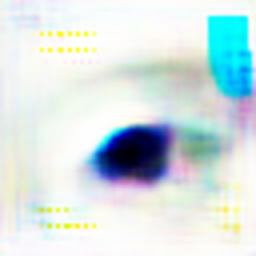

2017-08-28 01:22:57.172824: Step: 8800, Descriminator: 0.036829, Generator: 0.000000, Pass Through: 0.064415
2017-08-28 01:23:11.840454: Step: 8801, Descriminator: 0.040974, Generator: 0.000002, Pass Through: 0.073537
2017-08-28 01:23:26.349660: Step: 8802, Descriminator: 0.043172, Generator: 0.000000, Pass Through: 0.067141
2017-08-28 01:23:32.143785: Step: 8803, Descriminator: 1.336264, Generator: 0.000001, Pass Through: 0.072732
2017-08-28 01:23:46.664193: Step: 8804, Descriminator: 0.073060, Generator: 0.000000, Pass Through: 0.066853
2017-08-28 01:24:01.121372: Step: 8805, Descriminator: 0.060068, Generator: 0.000000, Pass Through: 0.069828
2017-08-28 01:24:15.697160: Step: 8806, Descriminator: 0.057757, Generator: 0.000000, Pass Through: 0.067358
2017-08-28 01:24:30.140759: Step: 8807, Descriminator: 0.047695, Generator: 0.000000, Pass Through: 0.065721
2017-08-28 01:24:44.708700: Step: 8808, Descriminator: 0.041969, Generator: 0.000001, Pass Through: 0.066732
2017-08-28 01:24:59

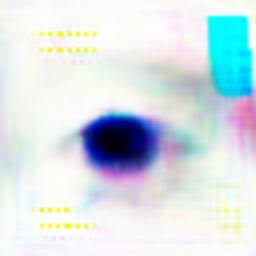

2017-08-28 01:34:16.236909: Step: 8850, Descriminator: 0.036607, Generator: 0.000000, Pass Through: 0.065543
2017-08-28 01:34:22.063268: Step: 8851, Descriminator: 1.465254, Generator: 0.000002, Pass Through: 0.072267
2017-08-28 01:34:36.492199: Step: 8852, Descriminator: 0.071075, Generator: 0.000001, Pass Through: 0.068832
2017-08-28 01:34:51.015551: Step: 8853, Descriminator: 0.080518, Generator: 0.000000, Pass Through: 0.065518
2017-08-28 01:35:06.073031: Step: 8854, Descriminator: 0.054791, Generator: 0.000001, Pass Through: 0.065420
2017-08-28 01:35:20.722051: Step: 8855, Descriminator: 0.063750, Generator: 0.000000, Pass Through: 0.066058
2017-08-28 01:35:35.465815: Step: 8856, Descriminator: 0.047998, Generator: 0.000000, Pass Through: 0.064904
2017-08-28 01:35:50.227935: Step: 8857, Descriminator: 0.048801, Generator: 0.000002, Pass Through: 0.077272
2017-08-28 01:36:04.769711: Step: 8858, Descriminator: 0.031016, Generator: 0.000000, Pass Through: 0.068655
2017-08-28 01:36:10

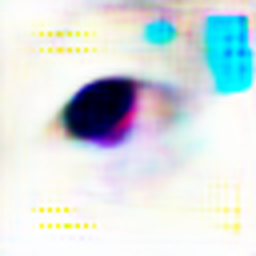

2017-08-28 01:45:27.571133: Step: 8900, Descriminator: 0.091227, Generator: 0.000000, Pass Through: 0.076851
2017-08-28 01:45:42.115457: Step: 8901, Descriminator: 0.066118, Generator: 0.000000, Pass Through: 0.069456
2017-08-28 01:45:56.734116: Step: 8902, Descriminator: 0.050943, Generator: 0.000000, Pass Through: 0.066186
2017-08-28 01:46:11.284535: Step: 8903, Descriminator: 0.048135, Generator: 0.000002, Pass Through: 0.071863
2017-08-28 01:46:25.814316: Step: 8904, Descriminator: 0.054055, Generator: 0.000000, Pass Through: 0.067640
2017-08-28 01:46:40.432476: Step: 8905, Descriminator: 0.038087, Generator: 0.000000, Pass Through: 0.066679
2017-08-28 01:46:54.875859: Step: 8906, Descriminator: 0.033278, Generator: 0.000000, Pass Through: 0.067220
2017-08-28 01:47:01.177288: Step: 8907, Descriminator: 1.367281, Generator: 0.000001, Pass Through: 0.066198
2017-08-28 01:47:15.805321: Step: 8908, Descriminator: 0.069020, Generator: 0.000000, Pass Through: 0.063917
2017-08-28 01:47:30

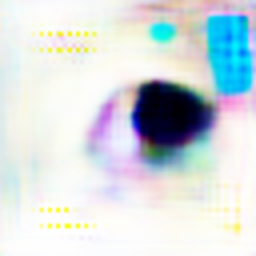

2017-08-28 01:56:46.647695: Step: 8950, Descriminator: 0.055237, Generator: 0.000000, Pass Through: 0.063527
2017-08-28 01:57:01.731908: Step: 8951, Descriminator: 0.045203, Generator: 0.000000, Pass Through: 0.065374
2017-08-28 01:57:16.226573: Step: 8952, Descriminator: 0.042003, Generator: 0.000003, Pass Through: 0.080908
2017-08-28 01:57:30.769430: Step: 8953, Descriminator: 0.038993, Generator: 0.000001, Pass Through: 0.070467
2017-08-28 01:57:45.327189: Step: 8954, Descriminator: 0.047005, Generator: 0.000000, Pass Through: 0.065061
2017-08-28 01:57:51.165394: Step: 8955, Descriminator: 1.295001, Generator: 0.000000, Pass Through: 0.062596
2017-08-28 01:58:05.601259: Step: 8956, Descriminator: 0.059594, Generator: 0.000000, Pass Through: 0.060589
2017-08-28 01:58:20.080933: Step: 8957, Descriminator: 0.049626, Generator: 0.000002, Pass Through: 0.073107
2017-08-28 01:58:34.608694: Step: 8958, Descriminator: 0.044853, Generator: 0.000000, Pass Through: 0.065645
2017-08-28 01:58:49

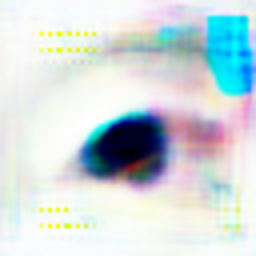

2017-08-28 02:08:06.597096: Step: 9000, Descriminator: 0.048525, Generator: 0.000000, Pass Through: 0.063720
2017-08-28 02:08:21.047018: Step: 9001, Descriminator: 0.043104, Generator: 0.000000, Pass Through: 0.063438
2017-08-28 02:08:35.699670: Step: 9002, Descriminator: 0.033716, Generator: 0.000000, Pass Through: 0.064210
2017-08-28 02:08:41.522112: Step: 9003, Descriminator: 1.335381, Generator: 0.000001, Pass Through: 0.074182
2017-08-28 02:08:56.281784: Step: 9004, Descriminator: 0.061265, Generator: 0.000000, Pass Through: 0.076256
2017-08-28 02:09:11.118580: Step: 9005, Descriminator: 0.056421, Generator: 0.000002, Pass Through: 0.083318
2017-08-28 02:09:25.669975: Step: 9006, Descriminator: 0.045634, Generator: 0.000000, Pass Through: 0.070729
2017-08-28 02:09:40.179064: Step: 9007, Descriminator: 2.210675, Generator: 0.000000, Pass Through: 0.066063
2017-08-28 02:09:54.703906: Step: 9008, Descriminator: 0.115168, Generator: 0.000000, Pass Through: 0.065686
2017-08-28 02:10:09

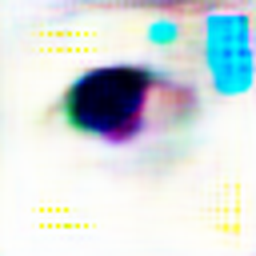

2017-08-28 02:19:26.596790: Step: 9050, Descriminator: 0.038840, Generator: 0.000000, Pass Through: 0.067070
2017-08-28 02:19:32.251315: Step: 9051, Descriminator: 1.246464, Generator: 0.000009, Pass Through: 0.093484
2017-08-28 02:19:46.602820: Step: 9052, Descriminator: 0.106229, Generator: 0.000000, Pass Through: 0.074768
2017-08-28 02:20:01.013577: Step: 9053, Descriminator: 1.999847, Generator: 0.000000, Pass Through: 0.069518
2017-08-28 02:20:15.369811: Step: 9054, Descriminator: 0.123919, Generator: 0.000000, Pass Through: 0.064384
2017-08-28 02:20:29.826620: Step: 9055, Descriminator: 0.082380, Generator: 0.000001, Pass Through: 0.065562
2017-08-28 02:20:44.309161: Step: 9056, Descriminator: 0.051118, Generator: 0.000000, Pass Through: 0.064405
2017-08-28 02:20:59.308277: Step: 9057, Descriminator: 0.064639, Generator: 0.000000, Pass Through: 0.064977
2017-08-28 02:21:14.012791: Step: 9058, Descriminator: 0.041240, Generator: 0.000000, Pass Through: 0.066085
2017-08-28 02:21:19

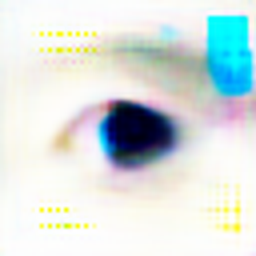

2017-08-28 02:30:34.107341: Step: 9100, Descriminator: 0.051600, Generator: 0.000001, Pass Through: 0.066842
2017-08-28 02:30:48.639949: Step: 9101, Descriminator: 0.051808, Generator: 0.000000, Pass Through: 0.061754
2017-08-28 02:31:03.647363: Step: 9102, Descriminator: 0.041025, Generator: 0.000000, Pass Through: 0.060032
2017-08-28 02:31:18.256618: Step: 9103, Descriminator: 0.041445, Generator: 0.000000, Pass Through: 0.058622
2017-08-28 02:31:32.685119: Step: 9104, Descriminator: 0.029988, Generator: 0.000004, Pass Through: 0.072830
2017-08-28 02:31:47.288968: Step: 9105, Descriminator: 0.027350, Generator: 0.000000, Pass Through: 0.061651
2017-08-28 02:32:01.865562: Step: 9106, Descriminator: 0.020376, Generator: 0.000000, Pass Through: 0.060772
2017-08-28 02:32:07.555901: Step: 9107, Descriminator: 1.558844, Generator: 0.000001, Pass Through: 0.064151
2017-08-28 02:32:22.099375: Step: 9108, Descriminator: 0.085381, Generator: 0.000001, Pass Through: 0.063858
2017-08-28 02:32:36

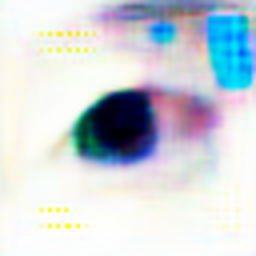

2017-08-28 02:41:50.669788: Step: 9150, Descriminator: 0.080276, Generator: 0.000000, Pass Through: 0.060071
2017-08-28 02:42:04.966300: Step: 9151, Descriminator: 0.081895, Generator: 0.000000, Pass Through: 0.060210
2017-08-28 02:42:19.464641: Step: 9152, Descriminator: 0.065487, Generator: 0.000000, Pass Through: 0.061283
2017-08-28 02:42:33.900152: Step: 9153, Descriminator: 0.050610, Generator: 0.000000, Pass Through: 0.059972
2017-08-28 02:42:48.405277: Step: 9154, Descriminator: 0.043547, Generator: 0.000001, Pass Through: 0.067681
2017-08-28 02:42:54.043736: Step: 9155, Descriminator: 1.342685, Generator: 0.000000, Pass Through: 0.058122
2017-08-28 02:43:09.099703: Step: 9156, Descriminator: 0.088599, Generator: 0.000000, Pass Through: 0.058174
2017-08-28 02:43:23.689122: Step: 9157, Descriminator: 0.064246, Generator: 0.000001, Pass Through: 0.062720
2017-08-28 02:43:38.092968: Step: 9158, Descriminator: 0.068679, Generator: 0.000000, Pass Through: 0.064160
2017-08-28 02:43:52

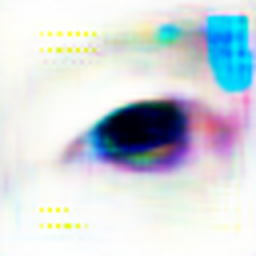

2017-08-28 02:53:05.576918: Step: 9200, Descriminator: 0.052557, Generator: 0.000000, Pass Through: 0.063658
2017-08-28 02:53:19.953395: Step: 9201, Descriminator: 0.048964, Generator: 0.000001, Pass Through: 0.063000
2017-08-28 02:53:34.365928: Step: 9202, Descriminator: 0.043828, Generator: 0.000000, Pass Through: 0.062749
2017-08-28 02:53:40.180102: Step: 9203, Descriminator: 1.373139, Generator: 0.000000, Pass Through: 0.071479
2017-08-28 02:53:54.506710: Step: 9204, Descriminator: 0.072492, Generator: 0.000000, Pass Through: 0.062847
2017-08-28 02:54:09.026312: Step: 9205, Descriminator: 0.077249, Generator: 0.000001, Pass Through: 0.063258
2017-08-28 02:54:23.404831: Step: 9206, Descriminator: 0.062151, Generator: 0.000000, Pass Through: 0.060228
2017-08-28 02:54:37.793010: Step: 9207, Descriminator: 0.066812, Generator: 0.000000, Pass Through: 0.059676
2017-08-28 02:54:52.290966: Step: 9208, Descriminator: 0.055345, Generator: 0.000002, Pass Through: 0.066866
2017-08-28 02:55:07

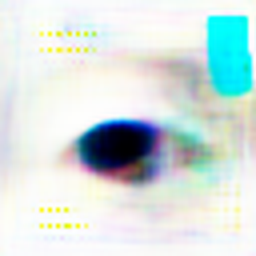

2017-08-28 03:04:20.113314: Step: 9250, Descriminator: 0.049071, Generator: 0.000000, Pass Through: 0.065953
2017-08-28 03:04:25.750936: Step: 9251, Descriminator: 1.223094, Generator: 0.000001, Pass Through: 0.065997
2017-08-28 03:04:40.269878: Step: 9252, Descriminator: 0.080312, Generator: 0.000000, Pass Through: 0.063240
2017-08-28 03:04:54.600316: Step: 9253, Descriminator: 0.064310, Generator: 0.000000, Pass Through: 0.068460
2017-08-28 03:05:09.580908: Step: 9254, Descriminator: 0.054500, Generator: 0.000000, Pass Through: 0.066193
2017-08-28 03:05:24.228569: Step: 9255, Descriminator: 0.051869, Generator: 0.000001, Pass Through: 0.074779
2017-08-28 03:05:38.665485: Step: 9256, Descriminator: 0.043469, Generator: 0.000000, Pass Through: 0.067085
2017-08-28 03:05:53.109723: Step: 9257, Descriminator: 0.052193, Generator: 0.000000, Pass Through: 0.064631
2017-08-28 03:06:07.527701: Step: 9258, Descriminator: 0.036263, Generator: 0.000000, Pass Through: 0.067493
2017-08-28 03:06:13

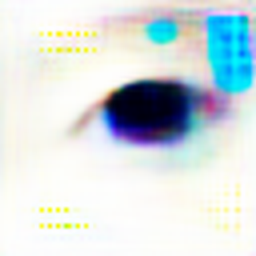

2017-08-28 03:15:26.671919: Step: 9300, Descriminator: 0.046596, Generator: 0.000000, Pass Through: 0.062711
2017-08-28 03:15:41.071420: Step: 9301, Descriminator: 0.055126, Generator: 0.000002, Pass Through: 0.072384
2017-08-28 03:15:55.652487: Step: 9302, Descriminator: 0.048679, Generator: 0.000001, Pass Through: 0.065399
2017-08-28 03:16:10.023942: Step: 9303, Descriminator: 0.038006, Generator: 0.000000, Pass Through: 0.062880
2017-08-28 03:16:24.574390: Step: 9304, Descriminator: 0.037044, Generator: 0.000001, Pass Through: 0.062898
2017-08-28 03:16:38.965482: Step: 9305, Descriminator: 0.032095, Generator: 0.000001, Pass Through: 0.064903
2017-08-28 03:16:53.503006: Step: 9306, Descriminator: 0.036080, Generator: 0.000003, Pass Through: 0.075298
2017-08-28 03:16:59.686313: Step: 9307, Descriminator: 1.438667, Generator: 0.000000, Pass Through: 0.065574
2017-08-28 03:17:14.229806: Step: 9308, Descriminator: 0.053330, Generator: 0.000000, Pass Through: 0.078604
2017-08-28 03:17:28

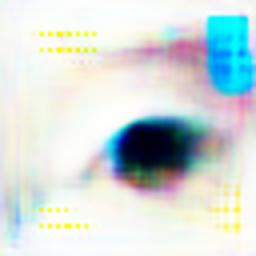

2017-08-28 03:26:38.942468: Step: 9350, Descriminator: 0.054693, Generator: 0.000000, Pass Through: 0.066958
2017-08-28 03:26:53.525541: Step: 9351, Descriminator: 0.062730, Generator: 0.000000, Pass Through: 0.063568
2017-08-28 03:27:08.449672: Step: 9352, Descriminator: 0.051413, Generator: 0.000000, Pass Through: 0.064156
2017-08-28 03:27:22.773364: Step: 9353, Descriminator: 0.040744, Generator: 0.000000, Pass Through: 0.062863
2017-08-28 03:27:37.121433: Step: 9354, Descriminator: 0.041078, Generator: 0.000000, Pass Through: 0.060549
2017-08-28 03:27:42.870311: Step: 9355, Descriminator: 1.298198, Generator: 0.000000, Pass Through: 0.064930
2017-08-28 03:27:57.279285: Step: 9356, Descriminator: 0.074132, Generator: 0.000000, Pass Through: 0.068305
2017-08-28 03:28:11.770833: Step: 9357, Descriminator: 0.057073, Generator: 0.000003, Pass Through: 0.073096
2017-08-28 03:28:26.005673: Step: 9358, Descriminator: 0.055023, Generator: 0.000000, Pass Through: 0.063731
2017-08-28 03:28:40

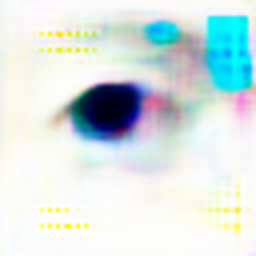

2017-08-28 03:37:50.492059: Step: 9400, Descriminator: 0.051057, Generator: 0.000000, Pass Through: 0.064608
2017-08-28 03:38:04.810420: Step: 9401, Descriminator: 0.047950, Generator: 0.000000, Pass Through: 0.066665
2017-08-28 03:38:19.125359: Step: 9402, Descriminator: 0.036389, Generator: 0.000001, Pass Through: 0.068981
2017-08-28 03:38:24.851794: Step: 9403, Descriminator: 1.274380, Generator: 0.000001, Pass Through: 0.070429
2017-08-28 03:38:39.237035: Step: 9404, Descriminator: 0.071705, Generator: 0.000001, Pass Through: 0.067835
2017-08-28 03:38:53.518456: Step: 9405, Descriminator: 0.065617, Generator: 0.000000, Pass Through: 0.063200
2017-08-28 03:39:08.575471: Step: 9406, Descriminator: 0.059154, Generator: 0.000000, Pass Through: 0.062491
2017-08-28 03:39:22.843213: Step: 9407, Descriminator: 0.043157, Generator: 0.000003, Pass Through: 0.077016
2017-08-28 03:39:37.248906: Step: 9408, Descriminator: 0.049692, Generator: 0.000000, Pass Through: 0.067504
2017-08-28 03:39:51

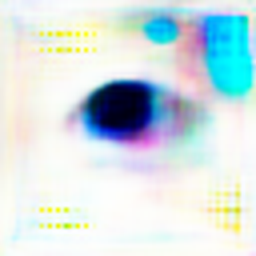

2017-08-28 03:49:01.156288: Step: 9450, Descriminator: 0.031374, Generator: 0.000002, Pass Through: 0.084557
2017-08-28 03:49:06.811236: Step: 9451, Descriminator: 1.276778, Generator: 0.000000, Pass Through: 0.070372
2017-08-28 03:49:21.185474: Step: 9452, Descriminator: 0.092465, Generator: 0.000000, Pass Through: 0.068688
2017-08-28 03:49:35.392533: Step: 9453, Descriminator: 0.070253, Generator: 0.000000, Pass Through: 0.066034
2017-08-28 03:49:49.657807: Step: 9454, Descriminator: 0.048315, Generator: 0.000000, Pass Through: 0.066185
2017-08-28 03:50:03.967168: Step: 9455, Descriminator: 0.051487, Generator: 0.000000, Pass Through: 0.079244
2017-08-28 03:50:18.301133: Step: 9456, Descriminator: 0.044852, Generator: 0.000000, Pass Through: 0.069041
2017-08-28 03:50:32.563851: Step: 9457, Descriminator: 0.047712, Generator: 0.000000, Pass Through: 0.065361
2017-08-28 03:50:46.858314: Step: 9458, Descriminator: 0.035503, Generator: 0.000000, Pass Through: 0.065182
2017-08-28 03:50:52

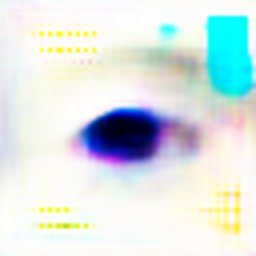

2017-08-28 04:00:02.491464: Step: 9500, Descriminator: 0.058003, Generator: 0.000006, Pass Through: 0.083050
2017-08-28 04:00:16.768757: Step: 9501, Descriminator: 0.064660, Generator: 0.000000, Pass Through: 0.072508
2017-08-28 04:00:31.067861: Step: 9502, Descriminator: 0.060892, Generator: 0.000000, Pass Through: 0.069081
2017-08-28 04:00:45.418947: Step: 9503, Descriminator: 0.045982, Generator: 0.000000, Pass Through: 0.068258
2017-08-28 04:01:00.296438: Step: 9504, Descriminator: 0.046916, Generator: 0.000000, Pass Through: 0.066097
2017-08-28 04:01:14.802145: Step: 9505, Descriminator: 0.034951, Generator: 0.000000, Pass Through: 0.066869
2017-08-28 04:01:29.093377: Step: 9506, Descriminator: 0.043089, Generator: 0.000000, Pass Through: 0.064059
2017-08-28 04:01:34.728576: Step: 9507, Descriminator: 1.195612, Generator: 0.000000, Pass Through: 0.063050
2017-08-28 04:01:49.079081: Step: 9508, Descriminator: 0.062477, Generator: 0.000006, Pass Through: 0.084778
2017-08-28 04:02:03

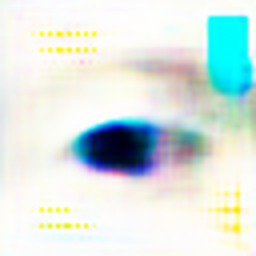

2017-08-28 04:11:11.600647: Step: 9550, Descriminator: 0.056094, Generator: 0.000006, Pass Through: 0.084583
2017-08-28 04:11:25.888040: Step: 9551, Descriminator: 0.052088, Generator: 0.000000, Pass Through: 0.067043
2017-08-28 04:11:40.287726: Step: 9552, Descriminator: 0.047200, Generator: 0.000000, Pass Through: 0.064039
2017-08-28 04:11:54.551231: Step: 9553, Descriminator: 0.055437, Generator: 0.000001, Pass Through: 0.066748
2017-08-28 04:12:08.934978: Step: 9554, Descriminator: 0.041405, Generator: 0.000000, Pass Through: 0.065002
2017-08-28 04:12:14.558929: Step: 9555, Descriminator: 1.298266, Generator: 0.000003, Pass Through: 0.074583
2017-08-28 04:12:28.961408: Step: 9556, Descriminator: 0.057430, Generator: 0.000001, Pass Through: 0.067020
2017-08-28 04:12:43.291714: Step: 9557, Descriminator: 0.059801, Generator: 0.000001, Pass Through: 0.066598
2017-08-28 04:12:58.114406: Step: 9558, Descriminator: 0.050778, Generator: 0.000001, Pass Through: 0.067481
2017-08-28 04:13:12

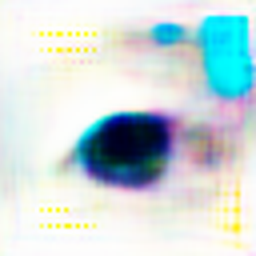

2017-08-28 04:22:21.037469: Step: 9600, Descriminator: 0.044682, Generator: 0.000000, Pass Through: 0.071053
2017-08-28 04:22:35.385229: Step: 9601, Descriminator: 0.048221, Generator: 0.000000, Pass Through: 0.068720
2017-08-28 04:22:49.708258: Step: 9602, Descriminator: 0.043372, Generator: 0.000000, Pass Through: 0.068032
2017-08-28 04:22:55.522959: Step: 9603, Descriminator: 1.248928, Generator: 0.000005, Pass Through: 0.081797
2017-08-28 04:23:10.362843: Step: 9604, Descriminator: 0.057450, Generator: 0.000000, Pass Through: 0.068563
2017-08-28 04:23:24.557797: Step: 9605, Descriminator: 2.588618, Generator: 0.000000, Pass Through: 0.067578
2017-08-28 04:23:38.871363: Step: 9606, Descriminator: 0.093026, Generator: 0.000000, Pass Through: 0.065628
2017-08-28 04:23:53.153753: Step: 9607, Descriminator: 0.077006, Generator: 0.000000, Pass Through: 0.064284
2017-08-28 04:24:07.560134: Step: 9608, Descriminator: 0.081230, Generator: 0.000000, Pass Through: 0.062308
2017-08-28 04:24:21

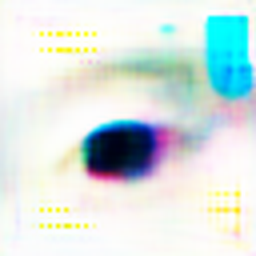

2017-08-28 04:33:30.495134: Step: 9650, Descriminator: 0.035066, Generator: 0.000000, Pass Through: 0.078992
2017-08-28 04:33:36.018422: Step: 9651, Descriminator: 0.581596, Generator: 0.000000, Pass Through: 0.074502
2017-08-28 04:33:50.332285: Step: 9652, Descriminator: 0.045703, Generator: 0.000000, Pass Through: 0.071540
2017-08-28 04:34:04.585445: Step: 9653, Descriminator: 0.050353, Generator: 0.000000, Pass Through: 0.076657
2017-08-28 04:34:18.820466: Step: 9654, Descriminator: 0.036279, Generator: 0.000000, Pass Through: 0.070658
2017-08-28 04:34:33.088224: Step: 9655, Descriminator: 0.038568, Generator: 0.000000, Pass Through: 0.079513
2017-08-28 04:34:47.399599: Step: 9656, Descriminator: 0.031698, Generator: 0.000000, Pass Through: 0.068044
2017-08-28 04:35:02.140090: Step: 9657, Descriminator: 0.027296, Generator: 0.000000, Pass Through: 0.079065
2017-08-28 04:35:16.609686: Step: 9658, Descriminator: 0.026478, Generator: 0.000000, Pass Through: 0.070669
2017-08-28 04:35:22

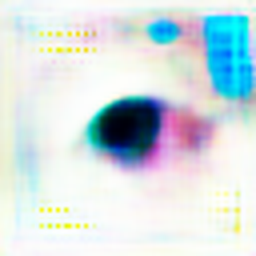

2017-08-28 04:44:29.024604: Step: 9700, Descriminator: 0.078711, Generator: 0.000000, Pass Through: 0.066650
2017-08-28 04:44:43.245323: Step: 9701, Descriminator: 0.064707, Generator: 0.000000, Pass Through: 0.067352
2017-08-28 04:44:57.921906: Step: 9702, Descriminator: 0.054708, Generator: 0.000000, Pass Through: 0.063028
2017-08-28 04:45:12.342849: Step: 9703, Descriminator: 0.060331, Generator: 0.000000, Pass Through: 0.065956
2017-08-28 04:45:26.677249: Step: 9704, Descriminator: 0.060514, Generator: 0.000002, Pass Through: 0.070970
2017-08-28 04:45:40.867185: Step: 9705, Descriminator: 0.052783, Generator: 0.000001, Pass Through: 0.066918
2017-08-28 04:45:55.163244: Step: 9706, Descriminator: 0.050891, Generator: 0.000000, Pass Through: 0.065018
2017-08-28 04:46:00.809133: Step: 9707, Descriminator: 1.183554, Generator: 0.000001, Pass Through: 0.064678
2017-08-28 04:46:15.178306: Step: 9708, Descriminator: 0.077403, Generator: 0.000000, Pass Through: 0.069453
2017-08-28 04:46:29

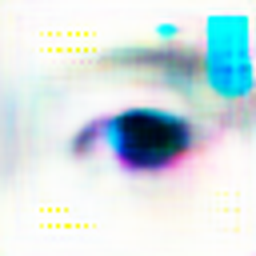

2017-08-28 04:55:35.419955: Step: 9750, Descriminator: 0.064858, Generator: 0.000000, Pass Through: 0.063880
2017-08-28 04:55:49.655332: Step: 9751, Descriminator: 0.060088, Generator: 0.000000, Pass Through: 0.062921
2017-08-28 04:56:03.989575: Step: 9752, Descriminator: 0.060785, Generator: 0.000001, Pass Through: 0.064993
2017-08-28 04:56:18.118426: Step: 9753, Descriminator: 0.057343, Generator: 0.000000, Pass Through: 0.064159
2017-08-28 04:56:32.360481: Step: 9754, Descriminator: 0.045437, Generator: 0.000001, Pass Through: 0.068370
2017-08-28 04:56:37.923759: Step: 9755, Descriminator: 1.174157, Generator: 0.000000, Pass Through: 0.065507
2017-08-28 04:56:52.246275: Step: 9756, Descriminator: 0.095532, Generator: 0.000000, Pass Through: 0.066824
2017-08-28 04:57:07.138322: Step: 9757, Descriminator: 0.068745, Generator: 0.000001, Pass Through: 0.071026
2017-08-28 04:57:21.391198: Step: 9758, Descriminator: 0.060090, Generator: 0.000000, Pass Through: 0.064997
2017-08-28 04:57:35

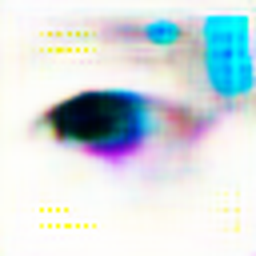

2017-08-28 05:06:42.208696: Step: 9800, Descriminator: 0.060599, Generator: 0.000000, Pass Through: 0.066854
2017-08-28 05:06:56.627026: Step: 9801, Descriminator: 0.047534, Generator: 0.000000, Pass Through: 0.063805
2017-08-28 05:07:11.207053: Step: 9802, Descriminator: 0.047815, Generator: 0.000000, Pass Through: 0.063835
2017-08-28 05:07:16.855726: Step: 9803, Descriminator: 1.359761, Generator: 0.000002, Pass Through: 0.080820
2017-08-28 05:07:31.251322: Step: 9804, Descriminator: 0.063247, Generator: 0.000011, Pass Through: 0.088197
2017-08-28 05:07:45.276715: Step: 9805, Descriminator: 0.054132, Generator: 0.000000, Pass Through: 0.073032
2017-08-28 05:07:59.533220: Step: 9806, Descriminator: 0.060083, Generator: 0.000000, Pass Through: 0.065619
2017-08-28 05:08:13.606778: Step: 9807, Descriminator: 0.050421, Generator: 0.000000, Pass Through: 0.067244
2017-08-28 05:08:27.900135: Step: 9808, Descriminator: 0.042126, Generator: 0.000000, Pass Through: 0.067428
2017-08-28 05:08:42

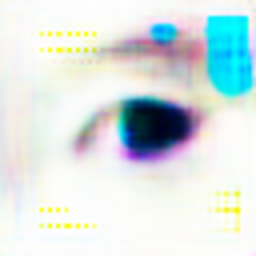

2017-08-28 05:17:46.853501: Step: 9850, Descriminator: 0.032587, Generator: 0.000000, Pass Through: 0.063950
2017-08-28 05:17:52.465326: Step: 9851, Descriminator: 1.383358, Generator: 0.000000, Pass Through: 0.061542
2017-08-28 05:18:06.734976: Step: 9852, Descriminator: 0.060794, Generator: 0.000000, Pass Through: 0.064045
2017-08-28 05:18:21.050986: Step: 9853, Descriminator: 0.052781, Generator: 0.000000, Pass Through: 0.061427
2017-08-28 05:18:35.293703: Step: 9854, Descriminator: 0.048397, Generator: 0.000000, Pass Through: 0.061810
2017-08-28 05:18:49.498283: Step: 9855, Descriminator: 0.043566, Generator: 0.000001, Pass Through: 0.065857
2017-08-28 05:19:04.308503: Step: 9856, Descriminator: 0.038081, Generator: 0.000000, Pass Through: 0.060268
2017-08-28 05:19:18.618381: Step: 9857, Descriminator: 0.034325, Generator: 0.000000, Pass Through: 0.061901
2017-08-28 05:19:32.822630: Step: 9858, Descriminator: 0.031432, Generator: 0.000001, Pass Through: 0.063250
2017-08-28 05:19:38

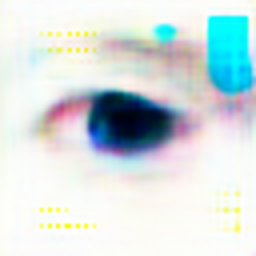

2017-08-28 05:28:42.071063: Step: 9900, Descriminator: 0.084646, Generator: 0.000001, Pass Through: 0.062254
2017-08-28 05:28:56.489066: Step: 9901, Descriminator: 0.074648, Generator: 0.000001, Pass Through: 0.061552
2017-08-28 05:29:10.936417: Step: 9902, Descriminator: 0.068658, Generator: 0.000000, Pass Through: 0.064188
2017-08-28 05:29:25.049326: Step: 9903, Descriminator: 0.049914, Generator: 0.000000, Pass Through: 0.059620
2017-08-28 05:29:39.198673: Step: 9904, Descriminator: 0.042074, Generator: 0.000000, Pass Through: 0.060103
2017-08-28 05:29:53.400091: Step: 9905, Descriminator: 0.043044, Generator: 0.000001, Pass Through: 0.064134
2017-08-28 05:30:07.449477: Step: 9906, Descriminator: 0.041976, Generator: 0.000009, Pass Through: 0.086548
2017-08-28 05:30:13.097388: Step: 9907, Descriminator: 1.587316, Generator: 0.000001, Pass Through: 0.069561
2017-08-28 05:30:27.320585: Step: 9908, Descriminator: 0.092152, Generator: 0.000000, Pass Through: 0.062208
2017-08-28 05:30:41

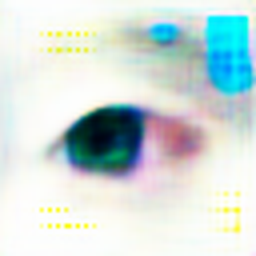

2017-08-28 05:39:46.002444: Step: 9950, Descriminator: 0.056530, Generator: 0.000000, Pass Through: 0.060097
2017-08-28 05:40:00.156610: Step: 9951, Descriminator: 0.051825, Generator: 0.000000, Pass Through: 0.058578
2017-08-28 05:40:14.438399: Step: 9952, Descriminator: 0.041199, Generator: 0.000001, Pass Through: 0.061435
2017-08-28 05:40:28.652958: Step: 9953, Descriminator: 0.040699, Generator: 0.000000, Pass Through: 0.062395
2017-08-28 05:40:42.751452: Step: 9954, Descriminator: 0.034466, Generator: 0.000000, Pass Through: 0.059471
2017-08-28 05:40:48.408283: Step: 9955, Descriminator: 1.275795, Generator: 0.000000, Pass Through: 0.059126
2017-08-28 05:41:03.198458: Step: 9956, Descriminator: 0.073131, Generator: 0.000004, Pass Through: 0.077673
2017-08-28 05:41:17.458737: Step: 9957, Descriminator: 0.064476, Generator: 0.000000, Pass Through: 0.062301
2017-08-28 05:41:31.656951: Step: 9958, Descriminator: 0.064407, Generator: 0.000000, Pass Through: 0.058526
2017-08-28 05:41:45

In [6]:
def fit_gan(generator, descriminator_builder, steps = 10000):
    desc = descriminator_builder()
    d = Sequential()
    d.add(desc)
    d.compile(loss='binary_crossentropy', optimizer=RMSprop(lr=0.0005))
    
    combined_model = Sequential()
    combined_model.add(generator)
    for layer in desc.layers:
            layer.trainable = False
    combined_model.add(desc)
    combined_model.compile(loss='binary_crossentropy', optimizer=RMSprop(lr=0.0001))
    
    descriminator_history = []
    generator_history = []
    pass_through_history = []
    sample_history = []
    
    for step in range(steps):
        real = next(real_data_gen)[0]
        fake = next(fake_data_gen)[0]
        
        combined = np.concatenate((real, fake))
        combined_y = np.ones([len(real) + len(fake),1])
        combined_y[len(fake):,:] = 0
        
        d_err = d.train_on_batch(combined, combined_y)
        
        y = np.ones([len(fake),1])
        
        for layer in desc.layers:
            layer.trainable = False
        c_err = combined_model.train_on_batch(fake, y)
        # train twice to make the descriminator's effect stronger
        combined_model.train_on_batch(fake, y)
        for layer in desc.layers:
            layer.trainable = True
            
        pass_err = generator.train_on_batch(fake, fake)
            
    
        sample = generator.predict(fake)
            
        if step % 50 == 0:
            sample = generator.predict(fake)
            
            display(output_to_image(sample[0]))
            # print(descriminator.predict(x))
            # print(y_all)
            # print(combined.predict(fake_in))
        print("%s: Step: %d, Descriminator: %f, Generator: %f, Pass Through: %f"%(str(datetime.now()), step, d_err, c_err, pass_err))
        
        descriminator_history.append(d_err)
        generator_history.append(c_err)
        pass_through_history.append(pass_err)
        sample_history.append(output_to_image(sample[0]))
        
    return (descriminator_history, generator_history, pass_through_history, sample_history)
        
    
descriminator_history, generator_history, pass_through_history, sample_history = fit_gan(generator, get_descriminator)
